<a href="https://colab.research.google.com/github/ashiduDissanayake/-Traveller-/blob/main/JPEG_Compression_Complete_Step_by_Step_Interactive_Guide.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# JPEG Compression: Complete Step-by-Step Interactive Guide

> **Author**: DissanayakeD.M.A.K._220135N  
> **Program**: JPEG Compression Analysis

This notebook provides a complete, step-by-step implementation of JPEG compression **without using any JPEG libraries**. Each step includes detailed visualizations, explanations, and interactive examples.

---
## 📋 Table of Contents

1. [Setup and Installation](#setup)
2. [Load and Prepare Image](#load-image)
3. [Step 1: RGB to YCbCr Conversion](#step1)
4. [Step 2: Chroma Subsampling (4:2:0)](#step2)
5. [Step 3: Block Splitting (8×8)](#step3)
6. [Step 4: Discrete Cosine Transform (DCT)](#step4)
7. [Step 5: Quantization](#step5)
8. [Step 6: Zigzag Scanning](#step6)
9. [Step 7: Encoding - Part A (DC Differential Encoding)](#step7a)
10. [Step 7: Encoding - Part B (AC Run-Length Encoding)](#step7b)
11. [Step 7: Encoding - Part C (Huffman Entropy Coding)](#step7c)
12. [Step 8: Complete Reconstruction Pipeline](#step8)
13. [Step 9: Quality Comparison](#step9)
14. [Step 10: Compression Analysis](#step10)

---

<a id="setup"></a>
## 🔧 Setup and Installation

In [1]:
# Install required packages
!pip install numpy matplotlib opencv-python scipy pillow -q

# Import libraries
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.fftpack import dct, idct
from PIL import Image
import io
from collections import Counter, defaultdict
import heapq

# Set display options for better visualization
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 10
np.set_printoptions(precision=2, suppress=True, linewidth=100)

print("✓ All packages imported successfully!")
print(f"NumPy version: {np.__version__}")
print(f"OpenCV version: {cv2.__version__}")

✓ All packages imported successfully!
NumPy version: 2.0.2
OpenCV version: 4.12.0


<a id="load-image"></a>
## 📤 Load and Prepare Test Image

Please upload your image file...


Saving lena_color.tiff to lena_color.tiff

✓ File uploaded: lena_color.tiff
Image loaded: 512×512 pixels
Image shape: (512, 512, 3)
Data type: uint8
Value range: [3, 255]


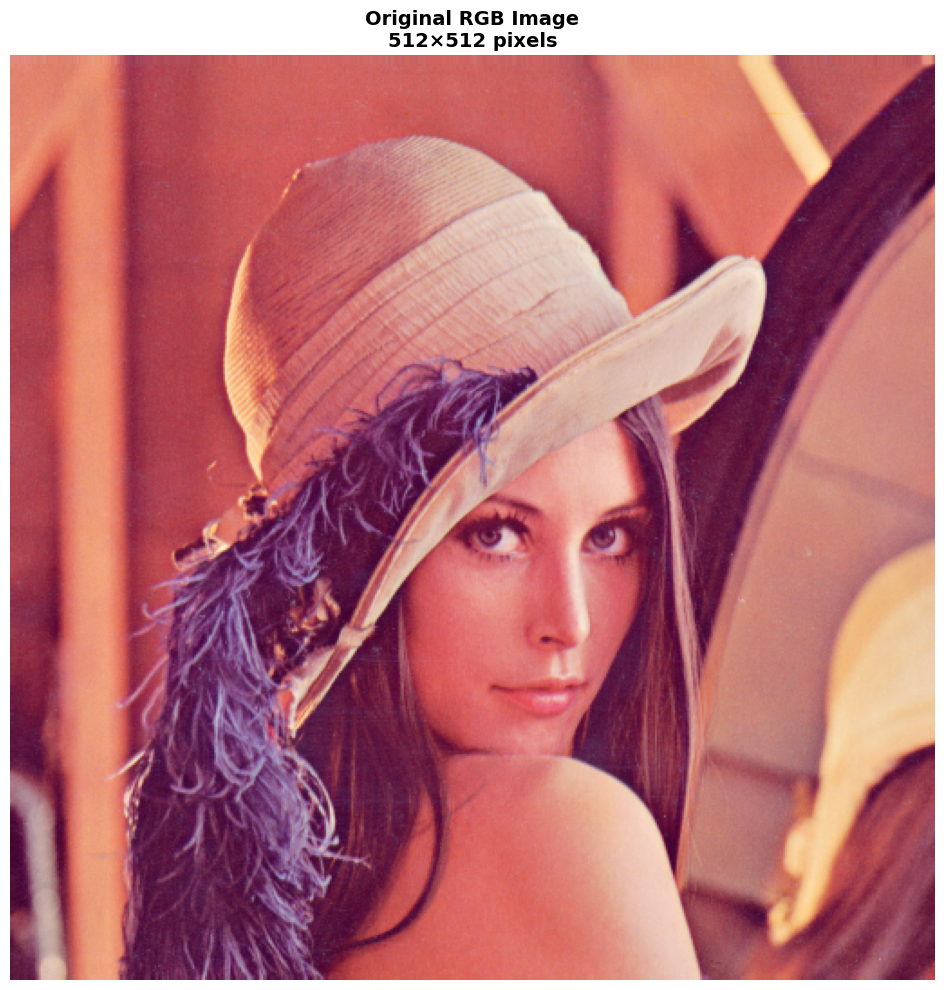


📊 Original Uncompressed Size:
   786,432 bytes
   768.00 KB
   0.75 MB


In [2]:
# Upload your image
from google.colab import files

print("Please upload your image file...")
uploaded = files.upload()

# Get the filename
filename = list(uploaded.keys())[0]
print(f"\n✓ File uploaded: {filename}")

# Load image
image_bgr = cv2.imread(filename)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Resize to be divisible by 8 (required for 8x8 blocks)
h, w = image_rgb.shape[:2]
new_h = (h // 8) * 8
new_w = (w // 8) * 8

if h != new_h or w != new_w:
    print(f"Resizing from {w}×{h} to {new_w}×{new_h} (must be divisible by 8)")
    image_rgb = image_rgb[:new_h, :new_w, :]

print(f"Image loaded: {new_w}×{new_h} pixels")
print(f"Image shape: {image_rgb.shape}")
print(f"Data type: {image_rgb.dtype}")
print(f"Value range: [{image_rgb.min()}, {image_rgb.max()}]")

# Display original image
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
ax.imshow(image_rgb)
ax.set_title(f"Original RGB Image\n{new_w}×{new_h} pixels", fontsize=14, fontweight='bold')
ax.axis('off')
plt.tight_layout()
plt.show()

# Calculate original file size
original_size_bytes = image_rgb.size  # width × height × 3 channels
original_size_kb = original_size_bytes / 1024
original_size_mb = original_size_kb / 1024

print(f"\n📊 Original Uncompressed Size:")
print(f"   {original_size_bytes:,} bytes")
print(f"   {original_size_kb:.2f} KB")
print(f"   {original_size_mb:.2f} MB")

---

<a id="step1"></a>
## 📍 Step 1: RGB to YCbCr Color Space Conversion

### 🎯 Theory

**Why convert to YCbCr?**
- Human vision is more sensitive to **brightness (luminance)** than **color (chrominance)**
- JPEG exploits this by separating brightness (Y) from color information (Cb, Cr)
- Allows us to compress color information more aggressively

**YCbCr Components:**
- **Y** = Luminance (brightness) - keeps full resolution
- **Cb** = Blue-difference chroma component (U in some standards)
- **Cr** = Red-difference chroma component (V in some standards)

**Conversion Formula (ITU-R BT.601):**
```
Y  =  0.299×R    + 0.587×G    + 0.114×B
Cb = -0.168736×R - 0.331264×G + 0.5×B     + 128
Cr =  0.5×R      - 0.418688×G - 0.081312×B + 128
```

The offset of 128 is added to Cb and Cr to shift the range from [-128, 127] to [0, 255].

### 💻 Implementation

In [3]:
def rgb_to_ycbcr(rgb_image):
    """
    Convert RGB image to YCbCr color space using ITU-R BT.601 standard.

    Parameters:
        rgb_image: numpy array of shape (height, width, 3) with values [0, 255]

    Returns:
        ycbcr_image: numpy array of shape (height, width, 3) with values [0, 255]
    """
    rgb = rgb_image.astype(np.float32)

    # Conversion matrix (ITU-R BT.601)
    conversion_matrix = np.array([
        [ 0.299,      0.587,      0.114    ],  # Y
        [-0.168736,  -0.331264,   0.5      ],  # Cb
        [ 0.5,       -0.418688,  -0.081312 ]   # Cr
    ])

    # Apply matrix multiplication
    ycbcr = np.dot(rgb, conversion_matrix.T)

    # Add offset to Cb and Cr channels (shift range to [0, 255])
    ycbcr[:, :, 1] += 128.0
    ycbcr[:, :, 2] += 128.0

    # Clip to valid range and convert to uint8
    return np.clip(ycbcr, 0, 255).astype(np.uint8)


def ycbcr_to_rgb(ycbcr_image):
    """
    Convert YCbCr back to RGB (for reconstruction and display).

    Parameters:
        ycbcr_image: numpy array of shape (height, width, 3) with values [0, 255]

    Returns:
        rgb_image: numpy array of shape (height, width, 3) with values [0, 255]
    """
    ycbcr = ycbcr_image.astype(np.float32)

    # Remove offset from Cb and Cr
    ycbcr[:, :, 1] -= 128.0
    ycbcr[:, :, 2] -= 128.0

    # Inverse conversion matrix
    inverse_matrix = np.array([
        [1.0,  0.0,        1.402     ],  # R
        [1.0, -0.344136,  -0.714136  ],  # G
        [1.0,  1.772,      0.0       ]   # B
    ])

    # Apply matrix multiplication
    rgb = np.dot(ycbcr, inverse_matrix.T)

    # Clip to valid range and convert to uint8
    return np.clip(rgb, 0, 255).astype(np.uint8)

In [4]:
# Test the conversion
print("Converting RGB to YCbCr...")
ycbcr_image = rgb_to_ycbcr(image_rgb)
Y_channel = ycbcr_image[:, :, 0]
Cb_channel = ycbcr_image[:, :, 1]
Cr_channel = ycbcr_image[:, :, 2]

print("✓ Conversion complete!")
print(f"\nChannel statistics:")
print(f"Y  (Luminance):      min={Y_channel.min()}, max={Y_channel.max()}, mean={Y_channel.mean():.2f}")
print(f"Cb (Blue-diff):      min={Cb_channel.min()}, max={Cb_channel.max()}, mean={Cb_channel.mean():.2f}")
print(f"Cr (Red-diff):       min={Cr_channel.min()}, max={Cr_channel.max()}, mean={Cr_channel.mean():.2f}")

# Test round-trip conversion
rgb_reconstructed = ycbcr_to_rgb(ycbcr_image)
conversion_error = np.abs(image_rgb.astype(np.float32) - rgb_reconstructed.astype(np.float32)).max()
print(f"\nRound-trip conversion error: {conversion_error:.2f} (should be ≤ 1 due to rounding)")

Converting RGB to YCbCr...
✓ Conversion complete!

Channel statistics:
Y  (Luminance):      min=24, max=245, mean=123.55
Cb (Blue-diff):      min=27, max=161, mean=116.99
Cr (Red-diff):       min=120, max=205, mean=167.57

Round-trip conversion error: 3.00 (should be ≤ 1 due to rounding)


### 📊 Visualization: Side-by-Side Comparison

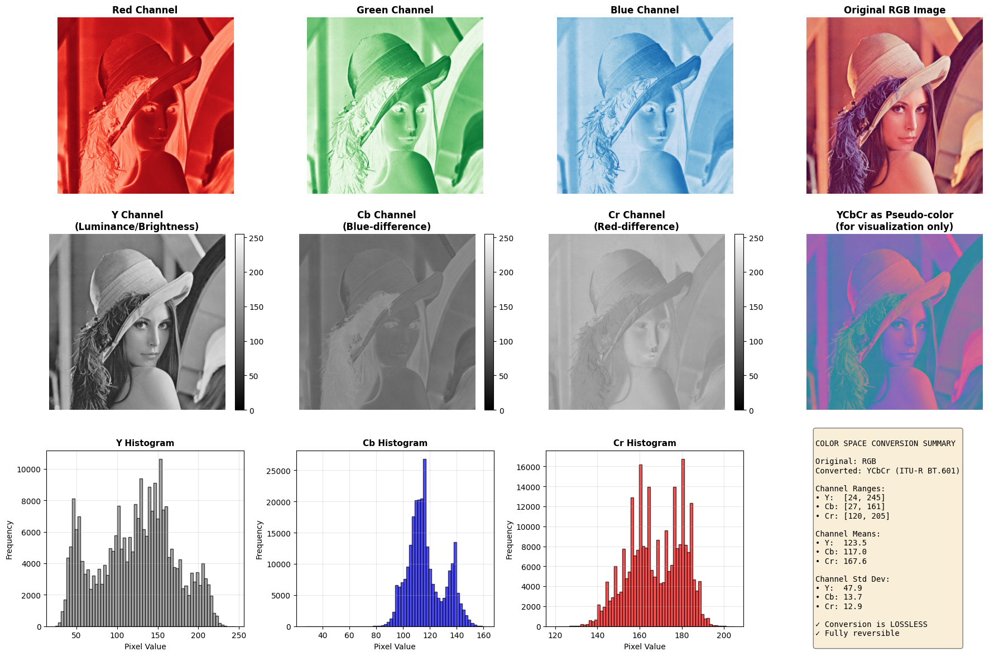


KEY OBSERVATIONS:
1. Y channel contains the grayscale version of the image
2. Cb and Cr contain color information (often smoother than Y)
3. Cb and Cr typically have values centered around 128
4. Human eyes are most sensitive to Y channel details
5. This conversion is completely LOSSLESS - no data is lost


In [5]:
# Create comprehensive visualization
fig = plt.figure(figsize=(18, 12))

# Row 1: Original RGB channels
ax1 = plt.subplot(3, 4, 1)
ax1.imshow(image_rgb[:, :, 0], cmap='Reds', vmin=0, vmax=255)
ax1.set_title('Red Channel', fontsize=12, fontweight='bold')
ax1.axis('off')

ax2 = plt.subplot(3, 4, 2)
ax2.imshow(image_rgb[:, :, 1], cmap='Greens', vmin=0, vmax=255)
ax2.set_title('Green Channel', fontsize=12, fontweight='bold')
ax2.axis('off')

ax3 = plt.subplot(3, 4, 3)
ax3.imshow(image_rgb[:, :, 2], cmap='Blues', vmin=0, vmax=255)
ax3.set_title('Blue Channel', fontsize=12, fontweight='bold')
ax3.axis('off')

ax4 = plt.subplot(3, 4, 4)
ax4.imshow(image_rgb)
ax4.set_title('Original RGB Image', fontsize=12, fontweight='bold')
ax4.axis('off')

# Row 2: YCbCr channels
ax5 = plt.subplot(3, 4, 5)
im5 = ax5.imshow(Y_channel, cmap='gray', vmin=0, vmax=255)
ax5.set_title('Y Channel\n(Luminance/Brightness)', fontsize=12, fontweight='bold')
ax5.axis('off')
plt.colorbar(im5, ax=ax5, fraction=0.046)

ax6 = plt.subplot(3, 4, 6)
im6 = ax6.imshow(Cb_channel, cmap='gray', vmin=0, vmax=255)
ax6.set_title('Cb Channel\n(Blue-difference)', fontsize=12, fontweight='bold')
ax6.axis('off')
plt.colorbar(im6, ax=ax6, fraction=0.046)

ax7 = plt.subplot(3, 4, 7)
im7 = ax7.imshow(Cr_channel, cmap='gray', vmin=0, vmax=255)
ax7.set_title('Cr Channel\n(Red-difference)', fontsize=12, fontweight='bold')
ax7.axis('off')
plt.colorbar(im7, ax=ax7, fraction=0.046)

ax8 = plt.subplot(3, 4, 8)
ax8.imshow(ycbcr_image)
ax8.set_title('YCbCr as Pseudo-color\n(for visualization only)', fontsize=12, fontweight='bold')
ax8.axis('off')

# Row 3: Histograms
ax9 = plt.subplot(3, 4, 9)
ax9.hist(Y_channel.flatten(), bins=64, color='gray', alpha=0.7, edgecolor='black')
ax9.set_title('Y Histogram', fontsize=11, fontweight='bold')
ax9.set_xlabel('Pixel Value')
ax9.set_ylabel('Frequency')
ax9.grid(True, alpha=0.3)

ax10 = plt.subplot(3, 4, 10)
ax10.hist(Cb_channel.flatten(), bins=64, color='blue', alpha=0.7, edgecolor='black')
ax10.set_title('Cb Histogram', fontsize=11, fontweight='bold')
ax10.set_xlabel('Pixel Value')
ax10.set_ylabel('Frequency')
ax10.grid(True, alpha=0.3)

ax11 = plt.subplot(3, 4, 11)
ax11.hist(Cr_channel.flatten(), bins=64, color='red', alpha=0.7, edgecolor='black')
ax11.set_title('Cr Histogram', fontsize=11, fontweight='bold')
ax11.set_xlabel('Pixel Value')
ax11.set_ylabel('Frequency')
ax11.grid(True, alpha=0.3)

# Comparison metrics
ax12 = plt.subplot(3, 4, 12)
ax12.axis('off')
info_text = f"""
COLOR SPACE CONVERSION SUMMARY

Original: RGB
Converted: YCbCr (ITU-R BT.601)

Channel Ranges:
• Y:  [{Y_channel.min()}, {Y_channel.max()}]
• Cb: [{Cb_channel.min()}, {Cb_channel.max()}]
• Cr: [{Cr_channel.min()}, {Cr_channel.max()}]

Channel Means:
• Y:  {Y_channel.mean():.1f}
• Cb: {Cb_channel.mean():.1f}
• Cr: {Cr_channel.mean():.1f}

Channel Std Dev:
• Y:  {Y_channel.std():.1f}
• Cb: {Cb_channel.std():.1f}
• Cr: {Cr_channel.std():.1f}

✓ Conversion is LOSSLESS
✓ Fully reversible
"""
ax12.text(0.1, 0.5, info_text, fontsize=10, family='monospace',
          verticalalignment='center', bbox=dict(boxstyle='round',
          facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("KEY OBSERVATIONS:")
print("="*70)
print("1. Y channel contains the grayscale version of the image")
print("2. Cb and Cr contain color information (often smoother than Y)")
print("3. Cb and Cr typically have values centered around 128")
print("4. Human eyes are most sensitive to Y channel details")
print("5. This conversion is completely LOSSLESS - no data is lost")
print("="*70)


### 🔍 Detailed Region Comparison

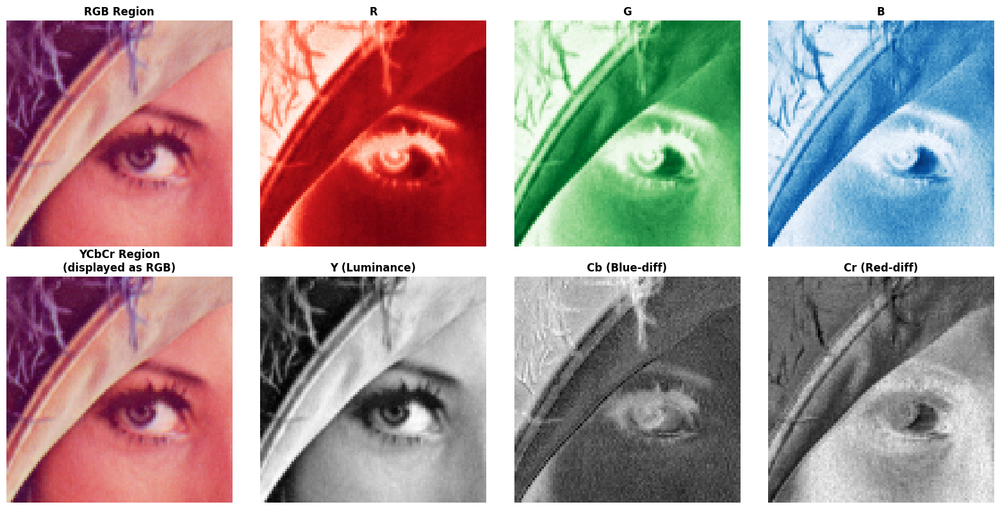

✓ Step 1 Complete: RGB → YCbCr Conversion


In [6]:
# Select a specific region to compare RGB vs YCbCr in detail
region_size = 100
start_x = image_rgb.shape[1] // 2 - region_size // 2
start_y = image_rgb.shape[0] // 2 - region_size // 2

rgb_region = image_rgb[start_y:start_y+region_size, start_x:start_x+region_size]
ycbcr_region = ycbcr_image[start_y:start_y+region_size, start_x:start_x+region_size]

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# RGB region
axes[0, 0].imshow(rgb_region)
axes[0, 0].set_title('RGB Region', fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(rgb_region[:, :, 0], cmap='Reds')
axes[0, 1].set_title('R', fontweight='bold')
axes[0, 1].axis('off')

axes[0, 2].imshow(rgb_region[:, :, 1], cmap='Greens')
axes[0, 2].set_title('G', fontweight='bold')
axes[0, 2].axis('off')

axes[0, 3].imshow(rgb_region[:, :, 2], cmap='Blues')
axes[0, 3].set_title('B', fontweight='bold')
axes[0, 3].axis('off')

# YCbCr region
axes[1, 0].imshow(ycbcr_to_rgb(ycbcr_region))
axes[1, 0].set_title('YCbCr Region\n(displayed as RGB)', fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(ycbcr_region[:, :, 0], cmap='gray')
axes[1, 1].set_title('Y (Luminance)', fontweight='bold')
axes[1, 1].axis('off')

axes[1, 2].imshow(ycbcr_region[:, :, 1], cmap='gray')
axes[1, 2].set_title('Cb (Blue-diff)', fontweight='bold')
axes[1, 2].axis('off')

axes[1, 3].imshow(ycbcr_region[:, :, 2], cmap='gray')
axes[1, 3].set_title('Cr (Red-diff)', fontweight='bold')
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

print("✓ Step 1 Complete: RGB → YCbCr Conversion")

---

<a id="step2"></a>
## 📍 Step 2: Chroma Subsampling (4:2:0)

### 🎯 Theory

**Why Chroma Subsampling?**
- Human eyes are **less sensitive to color details** than brightness
- We can reduce color resolution without noticeable quality loss
- This provides significant compression before any lossy operations

**4:2:0 Subsampling Scheme:**
- **4:2:0** means: for every 4×4 luminance samples, we have 2×2 chroma samples
- **Y channel**: Keep at full resolution (no downsampling)
- **Cb channel**: Downsample to 1/2 width × 1/2 height = **1/4 total size**
- **Cr channel**: Downsample to 1/2 width × 1/2 height = **1/4 total size**

**Data Reduction:**
```
Original:  Y + Cb + Cr = 100% + 100% + 100% = 300%
After 4:2:0: Y + Cb + Cr = 100% + 25% + 25% = 150%
Savings: 50% reduction in color data
```

### 💻 Implementation

In [7]:
def chroma_subsample_420(ycbcr_image):
    """
    Apply 4:2:0 chroma subsampling.

    Y channel: kept at full resolution
    Cb, Cr channels: downsampled by factor of 2 in both dimensions

    Parameters:
        ycbcr_image: numpy array of shape (height, width, 3)

    Returns:
        Y: full resolution Y channel
        Cb_sub: subsampled Cb channel (half width, half height)
        Cr_sub: subsampled Cr channel (half width, half height)
    """
    Y = ycbcr_image[:, :, 0]
    Cb = ycbcr_image[:, :, 1]
    Cr = ycbcr_image[:, :, 2]

    # Downsample chroma by 2x using bilinear interpolation
    # cv2.INTER_AREA is best for downsampling (averages pixels)
    Cb_sub = cv2.resize(Cb, (Cb.shape[1]//2, Cb.shape[0]//2),
                        interpolation=cv2.INTER_AREA)
    Cr_sub = cv2.resize(Cr, (Cr.shape[1]//2, Cr.shape[0]//2),
                        interpolation=cv2.INTER_AREA)

    return Y, Cb_sub, Cr_sub


def chroma_upsample(Y, Cb_sub, Cr_sub):
    """
    Upsample chroma channels back to full resolution for reconstruction.

    Parameters:
        Y: full resolution Y channel
        Cb_sub: subsampled Cb channel
        Cr_sub: subsampled Cr channel

    Returns:
        ycbcr_image: reconstructed YCbCr image at full resolution
    """
    # Upsample chroma to match Y resolution using bilinear interpolation
    Cb_full = cv2.resize(Cb_sub, (Y.shape[1], Y.shape[0]),
                         interpolation=cv2.INTER_LINEAR)
    Cr_full = cv2.resize(Cr_sub, (Y.shape[1], Y.shape[0]),
                         interpolation=cv2.INTER_LINEAR)

    # Stack channels
    return np.stack([Y, Cb_full, Cr_full], axis=2)

In [8]:
# Apply 4:2:0 subsampling
print("Applying 4:2:0 chroma subsampling...")
Y_full, Cb_subsampled, Cr_subsampled = chroma_subsample_420(ycbcr_image)

print("\n" + "="*70)
print("BEFORE SUBSAMPLING:")
print("="*70)
print(f"Y channel:  {ycbcr_image[:,:,0].shape} = {ycbcr_image[:,:,0].size:,} samples")
print(f"Cb channel: {ycbcr_image[:,:,1].shape} = {ycbcr_image[:,:,1].size:,} samples")
print(f"Cr channel: {ycbcr_image[:,:,2].shape} = {ycbcr_image[:,:,2].size:,} samples")
total_before = ycbcr_image.size
print(f"TOTAL: {total_before:,} samples")

print("\n" + "="*70)
print("AFTER 4:2:0 SUBSAMPLING:")
print("="*70)
print(f"Y channel:  {Y_full.shape} = {Y_full.size:,} samples (unchanged)")
print(f"Cb channel: {Cb_subsampled.shape} = {Cb_subsampled.size:,} samples (↓ 4x)")
print(f"Cr channel: {Cr_subsampled.shape} = {Cr_subsampled.size:,} samples (↓ 4x)")
total_after = Y_full.size + Cb_subsampled.size + Cr_subsampled.size
print(f"TOTAL: {total_after:,} samples")

reduction_ratio = (total_before - total_after) / total_before * 100
print(f"\n📊 Data Reduction: {reduction_ratio:.2f}%")
print(f"📊 Size Ratio: {total_after / total_before:.2f}x of original")
print("="*70)

# Reconstruct for quality comparison
ycbcr_reconstructed = chroma_upsample(Y_full, Cb_subsampled, Cr_subsampled)
rgb_after_subsampling = ycbcr_to_rgb(ycbcr_reconstructed.astype(np.uint8))

print("\n✓ Chroma subsampling complete!")

Applying 4:2:0 chroma subsampling...

BEFORE SUBSAMPLING:
Y channel:  (512, 512) = 262,144 samples
Cb channel: (512, 512) = 262,144 samples
Cr channel: (512, 512) = 262,144 samples
TOTAL: 786,432 samples

AFTER 4:2:0 SUBSAMPLING:
Y channel:  (512, 512) = 262,144 samples (unchanged)
Cb channel: (256, 256) = 65,536 samples (↓ 4x)
Cr channel: (256, 256) = 65,536 samples (↓ 4x)
TOTAL: 393,216 samples

📊 Data Reduction: 50.00%
📊 Size Ratio: 0.50x of original

✓ Chroma subsampling complete!


### 📊 Visualization: Full Image Comparison

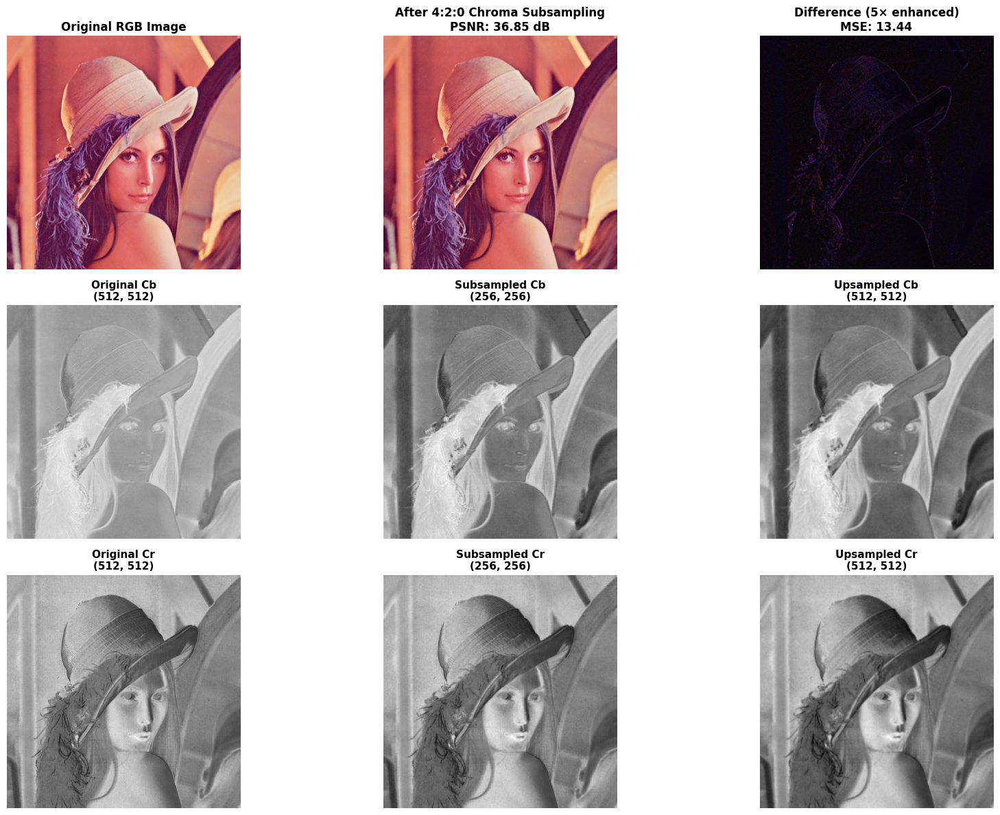


QUALITY IMPACT ANALYSIS:
PSNR: 36.85 dB
  • >40 dB: Excellent quality (imperceptible difference)
  • 30-40 dB: Good quality (minor differences)
  • 20-30 dB: Acceptable quality (visible differences)
  • <20 dB: Poor quality

Typical 4:2:0 subsampling: 35-45 dB (very good quality)


In [9]:
# Calculate quality metrics
mse_subsampling = np.mean((image_rgb.astype(np.float32) - rgb_after_subsampling.astype(np.float32)) ** 2)
psnr_subsampling = 20 * np.log10(255.0 / np.sqrt(mse_subsampling)) if mse_subsampling > 0 else 100

fig = plt.figure(figsize=(18, 12))

# Row 1: Full images
ax1 = plt.subplot(3, 3, 1)
ax1.imshow(image_rgb)
ax1.set_title('Original RGB Image', fontsize=12, fontweight='bold')
ax1.axis('off')

ax2 = plt.subplot(3, 3, 2)
ax2.imshow(rgb_after_subsampling)
ax2.set_title(f'After 4:2:0 Chroma Subsampling\nPSNR: {psnr_subsampling:.2f} dB',
             fontsize=12, fontweight='bold')
ax2.axis('off')

ax3 = plt.subplot(3, 3, 3)
diff_img = np.abs(image_rgb.astype(np.float32) - rgb_after_subsampling.astype(np.float32))
diff_enhanced = np.clip(diff_img * 5, 0, 255).astype(np.uint8)  # Enhance for visibility
ax3.imshow(diff_enhanced)
ax3.set_title(f'Difference (5× enhanced)\nMSE: {mse_subsampling:.2f}',
             fontsize=12, fontweight='bold')
ax3.axis('off')

# Row 2: Channel comparisons
ax4 = plt.subplot(3, 3, 4)
ax4.imshow(ycbcr_image[:,:,1], cmap='gray')
ax4.set_title(f'Original Cb\n{ycbcr_image[:,:,1].shape}', fontsize=11, fontweight='bold')
ax4.axis('off')

ax5 = plt.subplot(3, 3, 5)
ax5.imshow(Cb_subsampled, cmap='gray')
ax5.set_title(f'Subsampled Cb\n{Cb_subsampled.shape}', fontsize=11, fontweight='bold')
ax5.axis('off')

ax6 = plt.subplot(3, 3, 6)
Cb_upsampled_vis = cv2.resize(Cb_subsampled, (Y_full.shape[1], Y_full.shape[0]),
                               interpolation=cv2.INTER_LINEAR)
ax6.imshow(Cb_upsampled_vis, cmap='gray')
ax6.set_title(f'Upsampled Cb\n{Cb_upsampled_vis.shape}', fontsize=11, fontweight='bold')
ax6.axis('off')

ax7 = plt.subplot(3, 3, 7)
ax7.imshow(ycbcr_image[:,:,2], cmap='gray')
ax7.set_title(f'Original Cr\n{ycbcr_image[:,:,2].shape}', fontsize=11, fontweight='bold')
ax7.axis('off')

ax8 = plt.subplot(3, 3, 8)
ax8.imshow(Cr_subsampled, cmap='gray')
ax8.set_title(f'Subsampled Cr\n{Cr_subsampled.shape}', fontsize=11, fontweight='bold')
ax8.axis('off')

ax9 = plt.subplot(3, 3, 9)
Cr_upsampled_vis = cv2.resize(Cr_subsampled, (Y_full.shape[1], Y_full.shape[0]),
                               interpolation=cv2.INTER_LINEAR)
ax9.imshow(Cr_upsampled_vis, cmap='gray')
ax9.set_title(f'Upsampled Cr\n{Cr_upsampled_vis.shape}', fontsize=11, fontweight='bold')
ax9.axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("QUALITY IMPACT ANALYSIS:")
print("="*70)
print(f"PSNR: {psnr_subsampling:.2f} dB")
print(f"  • >40 dB: Excellent quality (imperceptible difference)")
print(f"  • 30-40 dB: Good quality (minor differences)")
print(f"  • 20-30 dB: Acceptable quality (visible differences)")
print(f"  • <20 dB: Poor quality")
print(f"\nTypical 4:2:0 subsampling: 35-45 dB (very good quality)")
print("="*70)

### 🔍 Side-by-Side Detail Comparison

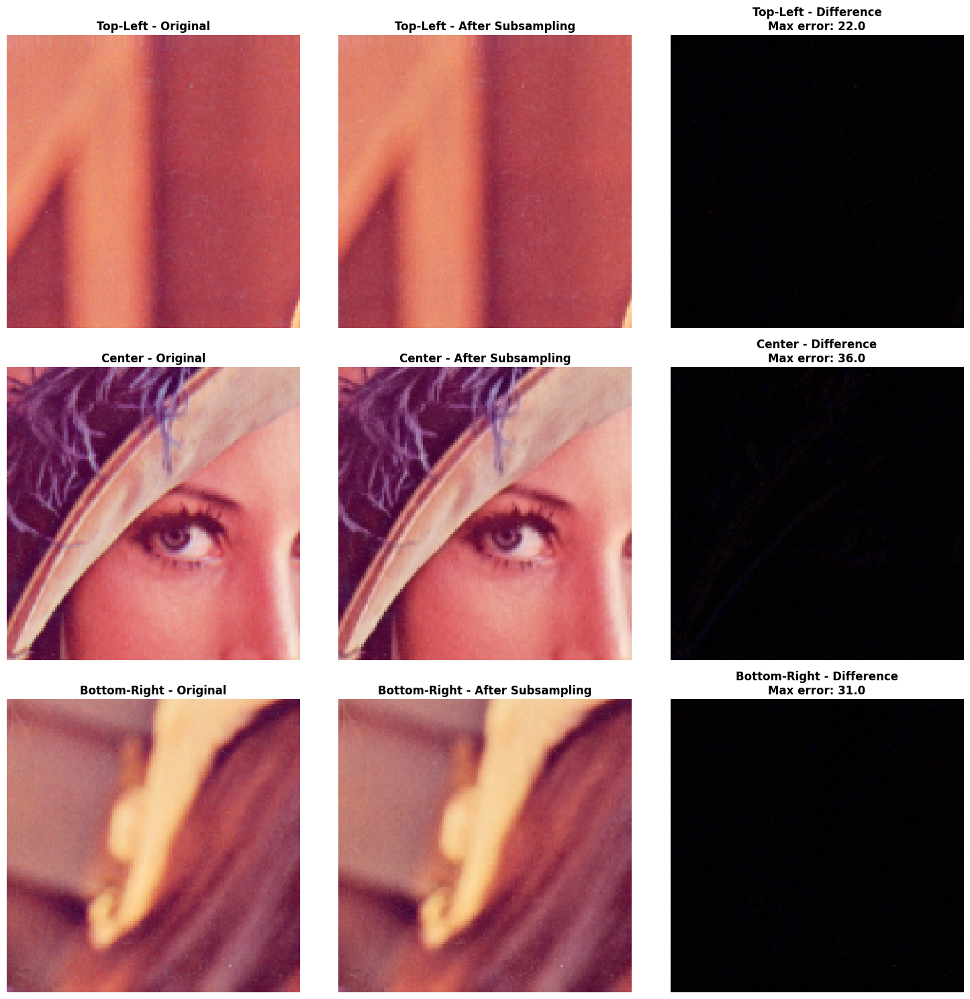

✓ Step 2 Complete: 4:2:0 Chroma Subsampling

Note: Differences are usually very small and hard to see with naked eye!


In [10]:
# Select multiple regions to compare
regions = [
    ("Top-Left", 0, 0),
    ("Center", image_rgb.shape[0]//2 - 64, image_rgb.shape[1]//2 - 64),
    ("Bottom-Right", image_rgb.shape[0] - 128, image_rgb.shape[1] - 128)
]

fig, axes = plt.subplots(len(regions), 3, figsize=(15, 5*len(regions)))

for idx, (label, y, x) in enumerate(regions):
    region_orig = image_rgb[y:y+128, x:x+128]
    region_sub = rgb_after_subsampling[y:y+128, x:x+128]
    region_diff = np.abs(region_orig.astype(np.float32) - region_sub.astype(np.float32))

    axes[idx, 0].imshow(region_orig)
    axes[idx, 0].set_title(f'{label} - Original', fontweight='bold')
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(region_sub)
    axes[idx, 1].set_title(f'{label} - After Subsampling', fontweight='bold')
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(region_diff.astype(np.uint8))
    axes[idx, 2].set_title(f'{label} - Difference\nMax error: {region_diff.max():.1f}',
                          fontweight='bold')
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()

print("✓ Step 2 Complete: 4:2:0 Chroma Subsampling")
print("\nNote: Differences are usually very small and hard to see with naked eye!")


---

<a id="step3"></a>
## 📍 Step 3: Block Splitting (8×8 Blocks)

### 🎯 Theory

**Why 8×8 Blocks?**
- DCT works on fixed-size blocks (JPEG standard uses 8×8)
- **8×8 is optimal balance** between:
  - **Compression efficiency**: Larger blocks = better energy compaction
  - **Blocking artifacts**: Smaller blocks = less visible block boundaries
  - **Computational complexity**: 8×8 is fast to compute

**Process:**
- Divide each channel into non-overlapping 8×8 pixel blocks
- Each block is processed independently through DCT and quantization
- Image dimensions must be multiples of 8

### 💻 Implementation

In [15]:
def split_into_blocks(channel, block_size=8):
    """
    Split a channel into non-overlapping blocks.

    Parameters:
        channel: 2D numpy array
        block_size: size of blocks (default 8×8)

    Returns:
        blocks: 4D array of shape (num_blocks_h, num_blocks_w, block_size, block_size)
    """
    h, w = channel.shape
    num_blocks_h = h // block_size
    num_blocks_w = w // block_size

    # Reshape into blocks
    blocks = channel.reshape(num_blocks_h, block_size, num_blocks_w, block_size)
    blocks = blocks.swapaxes(1, 2)

    return blocks


def blocks_to_channel(blocks, block_size=8):
    """
    Reconstruct channel from blocks.

    Parameters:
        blocks: 4D array of shape (num_blocks_h, num_blocks_w, block_size, block_size)
        block_size: size of blocks (default 8×8)

    Returns:
        channel: 2D numpy array
    """
    num_blocks_h, num_blocks_w, _, _ = blocks.shape

    # Reconstruct
    blocks_swapped = blocks.swapaxes(1, 2)
    channel = blocks_swapped.reshape(num_blocks_h * block_size, num_blocks_w * block_size)

    return channel

In [17]:
# Split Y channel into 8×8 blocks
print("Splitting image into 8×8 blocks...")
Y_blocks = split_into_blocks(Y_full)
Cb_blocks = split_into_blocks(Cb_subsampled)
Cr_blocks = split_into_blocks(Cr_subsampled)

print("\n" + "="*70)
print("BLOCK SPLITTING RESULTS:")
print("="*70)
print(f"Y channel:")
print(f"  Original shape: {Y_full.shape}")
print(f"  Block array shape: {Y_blocks.shape}")
print(f"  Number of blocks: {Y_blocks.shape[0] * Y_blocks.shape[1]:,}")
print(f"  Each block: 8×8 pixels")

print(f"\nCb channel:")
print(f"  Original shape: {Cb_subsampled.shape}")
print(f"  Block array shape: {Cb_blocks.shape}")
print(f"  Number of blocks: {Cb_blocks.shape[0] * Cb_blocks.shape[1]:,}")

print(f"\nCr channel:")
print(f"  Original shape: {Cr_subsampled.shape}")
print(f"  Block array shape: {Cr_blocks.shape}")
print(f"  Number of blocks: {Cr_blocks.shape[0] * Cr_blocks.shape[1]:,}")

total_blocks = (Y_blocks.shape[0] * Y_blocks.shape[1] +
                Cb_blocks.shape[0] * Cb_blocks.shape[1] +
                Cr_blocks.shape[0] * Cr_blocks.shape[1])
print(f"\n📊 Total 8×8 blocks to process: {total_blocks:,}")
print("="*70)

# Verify reconstruction works
Y_reconstructed = blocks_to_channel(Y_blocks)
assert np.array_equal(Y_full, Y_reconstructed), "Block reconstruction failed!"
print("\n✓ Block splitting and reconstruction verified!")

Splitting image into 8×8 blocks...

BLOCK SPLITTING RESULTS:
Y channel:
  Original shape: (512, 512)
  Block array shape: (64, 64, 8, 8)
  Number of blocks: 4,096
  Each block: 8×8 pixels

Cb channel:
  Original shape: (256, 256)
  Block array shape: (32, 32, 8, 8)
  Number of blocks: 1,024

Cr channel:
  Original shape: (256, 256)
  Block array shape: (32, 32, 8, 8)
  Number of blocks: 1,024

📊 Total 8×8 blocks to process: 6,144

✓ Block splitting and reconstruction verified!


### 📊 Visualization: Block Grid

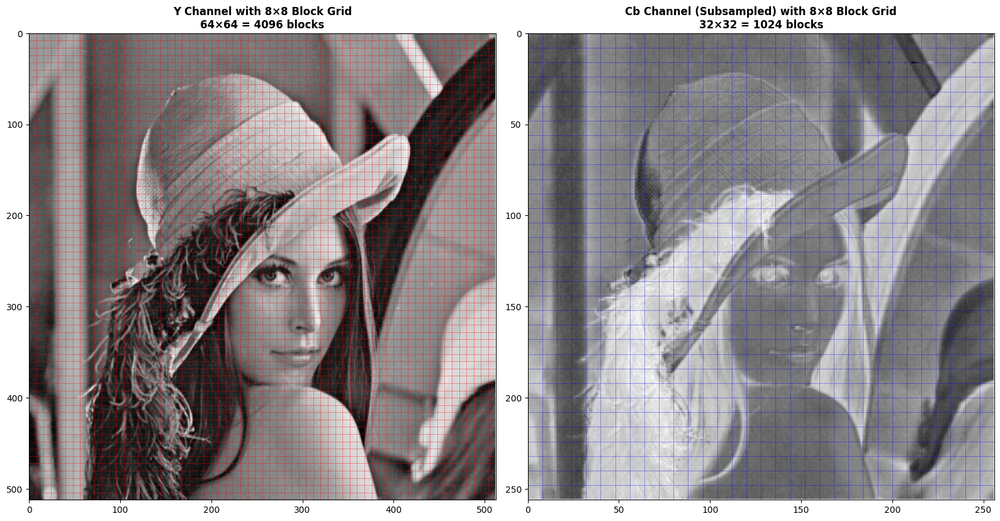

In [18]:
# Visualize block boundaries on full image
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Y channel with block grid
axes[0].imshow(Y_full, cmap='gray')
axes[0].set_title(f'Y Channel with 8×8 Block Grid\n{Y_blocks.shape[0]}×{Y_blocks.shape[1]} = {Y_blocks.shape[0]*Y_blocks.shape[1]} blocks',
                 fontsize=12, fontweight='bold')

# Draw grid lines every 8 pixels
for i in range(0, Y_full.shape[0], 8):
    axes[0].axhline(i, color='red', linewidth=0.5, alpha=0.5)
for j in range(0, Y_full.shape[1], 8):
    axes[0].axvline(j, color='red', linewidth=0.5, alpha=0.5)

axes[0].set_xlim(0, Y_full.shape[1])
axes[0].set_ylim(Y_full.shape[0], 0)

# Cb channel with block grid (subsampled)
axes[1].imshow(Cb_subsampled, cmap='gray')
axes[1].set_title(f'Cb Channel (Subsampled) with 8×8 Block Grid\n{Cb_blocks.shape[0]}×{Cb_blocks.shape[1]} = {Cb_blocks.shape[0]*Cb_blocks.shape[1]} blocks',
                 fontsize=12, fontweight='bold')

for i in range(0, Cb_subsampled.shape[0], 8):
    axes[1].axhline(i, color='blue', linewidth=0.5, alpha=0.5)
for j in range(0, Cb_subsampled.shape[1], 8):
    axes[1].axvline(j, color='blue', linewidth=0.5, alpha=0.5)

axes[1].set_xlim(0, Cb_subsampled.shape[1])
axes[1].set_ylim(Cb_subsampled.shape[0], 0)

plt.tight_layout()
plt.show()

### 🔍 Sample Individual Blocks

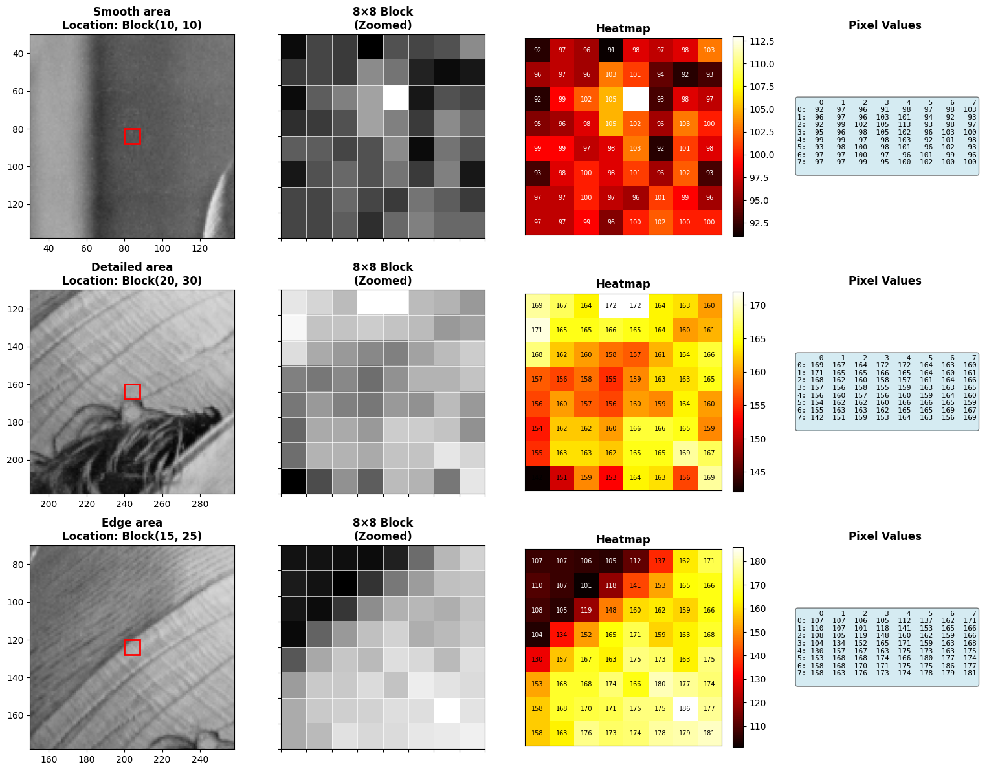

✓ Step 3 Complete: 8×8 Block Splitting

Each 8×8 block will be independently processed in the next steps!


In [19]:
# Extract and display several 8×8 blocks from different positions
sample_positions = [
    (10, 10, "Smooth area"),
    (20, 30, "Detailed area"),
    (15, 25, "Edge area")
]

fig, axes = plt.subplots(len(sample_positions), 4, figsize=(16, 4*len(sample_positions)))

for idx, (block_y, block_x, description) in enumerate(sample_positions):
    # Get the block
    block = Y_blocks[block_y, block_x]

    # Show block location on full image
    axes[idx, 0].imshow(Y_full, cmap='gray')
    rect = plt.Rectangle((block_x*8, block_y*8), 8, 8,
                         fill=False, edgecolor='red', linewidth=2)
    axes[idx, 0].add_patch(rect)
    axes[idx, 0].set_title(f'{description}\nLocation: Block({block_y}, {block_x})',
                          fontweight='bold')
    axes[idx, 0].set_xlim(max(0, block_x*8-50), min(Y_full.shape[1], block_x*8+58))
    axes[idx, 0].set_ylim(min(Y_full.shape[0], block_y*8+58), max(0, block_y*8-50))

    # Show zoomed block
    axes[idx, 1].imshow(block, cmap='gray', interpolation='nearest')
    axes[idx, 1].set_title(f'8×8 Block\n(Zoomed)', fontweight='bold')
    axes[idx, 1].grid(True, color='white', linewidth=0.5)
    axes[idx, 1].set_xticks(np.arange(-0.5, 8, 1), [])
    axes[idx, 1].set_yticks(np.arange(-0.5, 8, 1), [])

    # Show heatmap with values
    im = axes[idx, 2].imshow(block, cmap='hot', interpolation='nearest')
    axes[idx, 2].set_title('Heatmap', fontweight='bold')
    for i in range(8):
        for j in range(8):
            text = axes[idx, 2].text(j, i, f'{block[i, j]:.0f}',
                                    ha="center", va="center", color="white" if block[i, j] < 128 else "black",
                                    fontsize=7)
    axes[idx, 2].set_xticks([])
    axes[idx, 2].set_yticks([])
    plt.colorbar(im, ax=axes[idx, 2], fraction=0.046)

    # Show pixel values as table
    axes[idx, 3].axis('off')
    axes[idx, 3].set_title('Pixel Values', fontweight='bold')
    table_text = "   " + "  ".join([f"{j:3d}" for j in range(8)]) + "\n"
    for i in range(8):
        table_text += f"{i}: "
        table_text += "  ".join([f"{block[i,j]:3.0f}" for j in range(8)]) + "\n"
    axes[idx, 3].text(0.1, 0.5, table_text, fontsize=8, family='monospace',
                     verticalalignment='center',
                     bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

print("✓ Step 3 Complete: 8×8 Block Splitting")
print("\nEach 8×8 block will be independently processed in the next steps!")

---

<a id="step4"></a>
## 📍 Step 4: Discrete Cosine Transform (DCT)

### 🎯 Theory

**What is DCT?**
- **Discrete Cosine Transform** converts spatial domain (pixels) to frequency domain (coefficients)
- Similar to Fourier Transform but uses only real numbers (no complex numbers)
- **Key property**: Most image energy concentrates in low frequencies

**Why DCT for JPEG?**
1. **Energy Compaction**: Most information packed into few coefficients
2. **Decorrelation**: Adjacent pixels are correlated; DCT removes correlation
3. **Human Vision**: Humans are less sensitive to high-frequency details

**DCT Coefficient Layout (8×8 block):**
```
DC  ← Low frequencies (top-left)
↓
High frequencies (bottom-right) →

[DC] [AC₁] [AC₂] ...
[AC₈] ...
...
```

- **DC coefficient [0,0]**: Average value of the block
- **AC coefficients [rest]**: Frequency components (detail)
- **Low freq (top-left)**: Smooth variations, large values
- **High freq (bottom-right)**: Fine details, often small/zero

**JPEG DCT Process:**
1. **Level shift**: Subtract 128 from pixel values (centers around 0)
2. **Apply 2D DCT**: Transforms 8×8 pixel block to 8×8 coefficient block
3. **Result**: 64 DCT coefficients (1 DC + 63 AC)

### 💻 Implementation

In [20]:
def apply_dct_to_blocks(blocks):
    """
    Apply 2D DCT to each 8×8 block.
    Before DCT, apply level shift (subtract 128).

    Parameters:
        blocks: 4D array of shape (num_blocks_h, num_blocks_w, 8, 8)

    Returns:
        dct_blocks: 4D array of DCT coefficients
    """
    num_blocks_h, num_blocks_w, _, _ = blocks.shape
    dct_blocks = np.zeros_like(blocks, dtype=np.float32)

    for i in range(num_blocks_h):
        for j in range(num_blocks_w):
            block = blocks[i, j].astype(np.float32)

            # Level shift: subtract 128 (centers values around 0)
            block_shifted = block - 128.0

            # Apply 2D DCT
            dct_block = cv2.dct(block_shifted)
            dct_blocks[i, j] = dct_block

    return dct_blocks


def apply_idct_to_blocks(dct_blocks):
    """
    Apply inverse 2D DCT to reconstruct blocks.
    After IDCT, reverse level shift (add 128).

    Parameters:
        dct_blocks: 4D array of DCT coefficients

    Returns:
        reconstructed_blocks: 4D array of pixel values
    """
    num_blocks_h, num_blocks_w, _, _ = dct_blocks.shape
    reconstructed_blocks = np.zeros_like(dct_blocks, dtype=np.float32)

    for i in range(num_blocks_h):
        for j in range(num_blocks_w):
            dct_block = dct_blocks[i, j]

            # Apply inverse DCT
            block = cv2.idct(dct_block)

            # Reverse level shift: add 128
            block_reconstructed = block + 128.0

            reconstructed_blocks[i, j] = block_reconstructed

    return reconstructed_blocks

In [21]:
# Apply DCT to all blocks
print("Applying DCT to all 8×8 blocks...")
Y_dct_blocks = apply_dct_to_blocks(Y_blocks)
Cb_dct_blocks = apply_dct_to_blocks(Cb_blocks)
Cr_dct_blocks = apply_dct_to_blocks(Cr_blocks)

print(f"\n✓ DCT applied to {Y_dct_blocks.shape[0] * Y_dct_blocks.shape[1]:,} Y blocks")
print(f"✓ DCT applied to {Cb_dct_blocks.shape[0] * Cb_dct_blocks.shape[1]:,} Cb blocks")
print(f"✓ DCT applied to {Cr_dct_blocks.shape[0] * Cr_dct_blocks.shape[1]:,} Cr blocks")

# Test reconstruction (should be perfect since no quantization yet)
Y_reconstructed_blocks = apply_idct_to_blocks(Y_dct_blocks)
Y_reconstructed = blocks_to_channel(Y_reconstructed_blocks)
reconstruction_error = np.abs(Y_full.astype(np.float32) - Y_reconstructed).max()
print(f"\n✓ DCT round-trip error: {reconstruction_error:.6f} (should be ~0)")

Applying DCT to all 8×8 blocks...

✓ DCT applied to 4,096 Y blocks
✓ DCT applied to 1,024 Cb blocks
✓ DCT applied to 1,024 Cr blocks

✓ DCT round-trip error: 0.000031 (should be ~0)


### 📊 Detailed Analysis of Sample Block

In [23]:
# Select a sample block for detailed analysis
sample_block_y = 15
sample_block_x = 20

# Get original block
original_block = Y_blocks[sample_block_y, sample_block_x].astype(np.float32)
print(f"Analyzing Block at position ({sample_block_y}, {sample_block_x})")
print(f"Block location in image: pixels ({sample_block_y*8}:{(sample_block_y+1)*8}, {sample_block_x*8}:{(sample_block_x+1)*8})")

# Apply level shift
block_shifted = original_block - 128.0

# Apply DCT
dct_coeffs = cv2.dct(block_shifted)

# Verify it matches our batch processing
assert np.allclose(dct_coeffs, Y_dct_blocks[sample_block_y, sample_block_x]), "DCT mismatch!"

print("\n" + "="*70)
print("ORIGINAL PIXEL VALUES (0-255):")
print("="*70)
print(original_block.astype(int))

print("\n" + "="*70)
print("AFTER LEVEL SHIFT (-128):")
print("="*70)
print(block_shifted.astype(int))

print("\n" + "="*70)
print("DCT COEFFICIENTS:")
print("="*70)
print(dct_coeffs)

print("\n" + "="*70)
print("DCT COEFFICIENT STATISTICS:")
print("="*70)
print(f"DC coefficient [0,0]: {dct_coeffs[0,0]:.2f}")
print(f"  (This is approximately 8×sqrt(2) times the average of shifted pixels)")
print(f"\nAC coefficients:")
print(f"  Max: {dct_coeffs[1:].max():.2f}")
print(f"  Min: {dct_coeffs[1:].min():.2f}")
print(f"  Mean: {dct_coeffs[1:].mean():.2f}")
print(f"  Std: {dct_coeffs[1:].std():.2f}")
print(f"\nCoefficients near zero (|val| < 1): {np.sum(np.abs(dct_coeffs[1:]) < 1)}/63")
print(f"Coefficients near zero (|val| < 5): {np.sum(np.abs(dct_coeffs[1:]) < 5)}/63")

Analyzing Block at position (15, 20)
Block location in image: pixels (120:128, 160:168)

ORIGINAL PIXEL VALUES (0-255):
[[111 113 118 125 122 117 115 133]
 [118 120 121 124 113 112 123 137]
 [124 119 107 112 109 127 126 126]
 [115 106 109 119 128 133 124 127]
 [104 114 124 125 128 138 127 134]
 [120 132 129 127 121 131 131 138]
 [128 128 126 126 126 130 134 132]
 [123 123 131 131 126 120 124 125]]

AFTER LEVEL SHIFT (-128):
[[-17 -15 -10  -3  -6 -11 -13   5]
 [-10  -8  -7  -4 -15 -16  -5   9]
 [ -4  -9 -21 -16 -19  -1  -2  -2]
 [-13 -22 -19  -9   0   5  -4  -1]
 [-24 -14  -4  -3   0  10  -1   6]
 [ -8   4   1  -1  -7   3   3  10]
 [  0   0  -2  -2  -2   2   6   4]
 [ -5  -5   3   3  -2  -8  -4  -3]]

DCT COEFFICIENTS:
[[-37.88 -29.77   4.44  -8.45   3.12  -1.34   4.52  -8.04]
 [-26.51  -6.95   6.8   -1.82   8.76  -1.41   1.03  -3.76]
 [  1.61  17.72   2.58 -14.52   7.27   2.85  -4.64   4.35]
 [ 11.87  -5.91  -6.43 -12.01  -2.08  -6.61   1.7   -1.24]
 [ -8.12  -8.49 -20.85   1.19   6.88

### 📊 Comprehensive Visualization

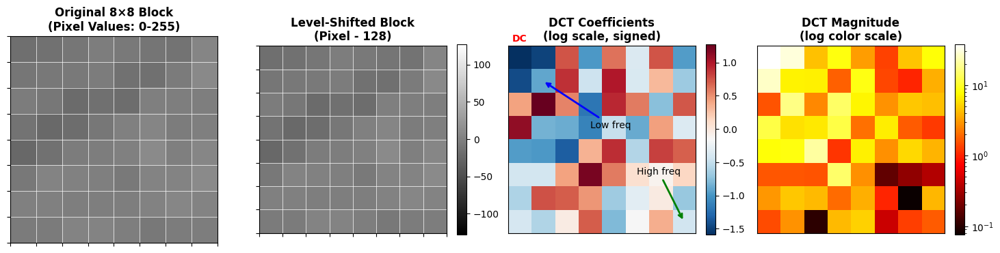

In [24]:
fig = plt.figure(figsize=(18, 14))

# Row 1: Original block analysis
ax1 = plt.subplot(3, 4, 1)
ax1.imshow(original_block, cmap='gray', interpolation='nearest', vmin=0, vmax=255)
ax1.set_title('Original 8×8 Block\n(Pixel Values: 0-255)', fontweight='bold')
ax1.grid(True, color='white', linewidth=0.5)
ax1.set_xticks(np.arange(-0.5, 8, 1), [])
ax1.set_yticks(np.arange(-0.5, 8, 1), [])

ax2 = plt.subplot(3, 4, 2)
im2 = ax2.imshow(block_shifted, cmap='gray', interpolation='nearest', vmin=-128, vmax=127)
ax2.set_title('Level-Shifted Block\n(Pixel - 128)', fontweight='bold')
ax2.grid(True, color='white', linewidth=0.5)
ax2.set_xticks(np.arange(-0.5, 8, 1), [])
ax2.set_yticks(np.arange(-0.5, 8, 1), [])
plt.colorbar(im2, ax=ax2, fraction=0.046)

ax3 = plt.subplot(3, 4, 3)
# Show DCT coefficients with log scale for better visualization
dct_vis = np.sign(dct_coeffs) * np.log10(np.abs(dct_coeffs) + 1)
im3 = ax3.imshow(dct_vis, cmap='RdBu_r', interpolation='nearest')
ax3.set_title('DCT Coefficients\n(log scale, signed)', fontweight='bold')
ax3.text(0, -0.7, 'DC', ha='center', fontsize=10, color='red', fontweight='bold')
ax3.annotate('Low freq', xy=(1, 1), xytext=(3, 3),
            arrowprops=dict(arrowstyle='->', color='blue', lw=2))
ax3.annotate('High freq', xy=(7, 7), xytext=(5, 5),
            arrowprops=dict(arrowstyle='->', color='green', lw=2))
ax3.set_xticks([])
ax3.set_yticks([])
plt.colorbar(im3, ax=ax3, fraction=0.046)

ax4 = plt.subplot(3, 4, 4)
im4 = ax4.imshow(np.abs(dct_coeffs), cmap='hot', interpolation='nearest', norm=plt.matplotlib.colors.LogNorm())
ax4.set_title('DCT Magnitude\n(log color scale)', fontweight='bold')
ax4.set_xticks([])
ax4.set_yticks([])
plt.colorbar(im4, ax=ax4, fraction=0.046)

Text(0.1, 0.5, '\nENERGY ANALYSIS:\n\nTotal Energy: 5503\n\nDC (1 coeff): 1435\n  26.1% of total\n\nLow freq (16 coeffs): 4108\n  74.7% of total\n\nHigh freq (48 coeffs): 1395\n  25.3% of total\n\n✓ Most energy in few coefficients!\n')

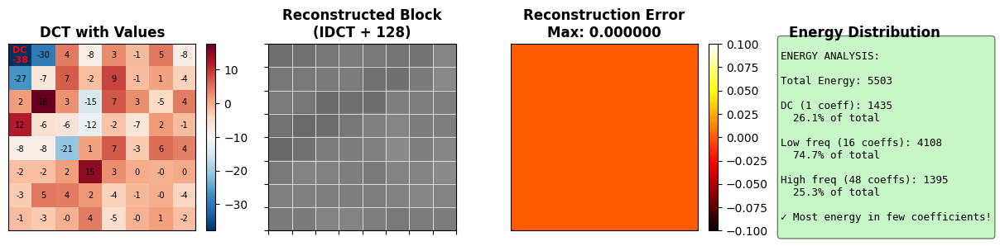

In [25]:
# Row 2: Detailed DCT coefficient values
ax5 = plt.subplot(3, 4, 5)
im5 = ax5.imshow(dct_coeffs, cmap='RdBu_r', interpolation='nearest')
ax5.set_title('DCT with Values', fontweight='bold')
for i in range(8):
    for j in range(8):
        val = dct_coeffs[i, j]
        color = 'white' if abs(val) > 50 else 'black'
        if i == 0 and j == 0:
            text = ax5.text(j, i, f'DC\n{val:.0f}', ha="center", va="center",
                          color='red', fontsize=8, fontweight='bold')
        else:
            text = ax5.text(j, i, f'{val:.0f}', ha="center", va="center",
                          color=color, fontsize=7)
ax5.set_xticks([])
ax5.set_yticks([])
plt.colorbar(im5, ax=ax5, fraction=0.046)

# Reconstruct to verify
reconstructed_block = cv2.idct(dct_coeffs) + 128.0
reconstruction_error = np.abs(original_block - reconstructed_block)

ax6 = plt.subplot(3, 4, 6)
ax6.imshow(reconstructed_block, cmap='gray', interpolation='nearest', vmin=0, vmax=255)
ax6.set_title('Reconstructed Block\n(IDCT + 128)', fontweight='bold')
ax6.grid(True, color='white', linewidth=0.5)
ax6.set_xticks(np.arange(-0.5, 8, 1), [])
ax6.set_yticks(np.arange(-0.5, 8, 1), [])

ax7 = plt.subplot(3, 4, 7)
im7 = ax7.imshow(reconstruction_error, cmap='hot', interpolation='nearest')
ax7.set_title(f'Reconstruction Error\nMax: {reconstruction_error.max():.6f}', fontweight='bold')
ax7.set_xticks([])
ax7.set_yticks([])
plt.colorbar(im7, ax=ax7, fraction=0.046)

# Show frequency distribution
ax8 = plt.subplot(3, 4, 8)
ax8.axis('off')
ax8.set_title('Energy Distribution', fontweight='bold')
total_energy = np.sum(dct_coeffs ** 2)
dc_energy = dct_coeffs[0, 0] ** 2
ac_energy = total_energy - dc_energy
low_freq_energy = np.sum(dct_coeffs[:4, :4] ** 2)  # Top-left 4×4
high_freq_energy = total_energy - low_freq_energy

info_text = f"""
ENERGY ANALYSIS:

Total Energy: {total_energy:.0f}

DC (1 coeff): {dc_energy:.0f}
  {dc_energy/total_energy*100:.1f}% of total

Low freq (16 coeffs): {low_freq_energy:.0f}
  {low_freq_energy/total_energy*100:.1f}% of total

High freq (48 coeffs): {high_freq_energy:.0f}
  {high_freq_energy/total_energy*100:.1f}% of total

✓ Most energy in few coefficients!
"""
ax8.text(0.1, 0.5, info_text, fontsize=9, family='monospace',
        verticalalignment='center', bbox=dict(boxstyle='round',
        facecolor='lightgreen', alpha=0.5))

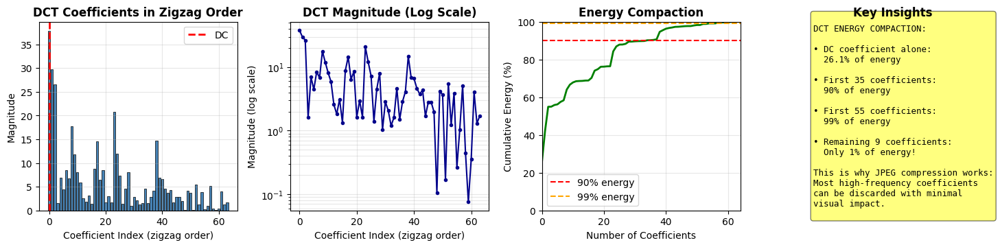


KEY OBSERVATIONS:
1. DC coefficient (-37.88) is typically the largest
2. 35 coefficients contain 90% of the energy
3. 55 coefficients contain 99% of the energy
4. High-frequency coefficients (bottom-right) are small or near zero
5. DCT is LOSSLESS - perfect reconstruction before quantization


In [26]:
# Row 3: Frequency visualization
# Create zigzag-ordered coefficient magnitude plot
zigzag_order = [
    (0,0), (0,1), (1,0), (2,0), (1,1), (0,2), (0,3), (1,2),
    (2,1), (3,0), (4,0), (3,1), (2,2), (1,3), (0,4), (0,5),
    (1,4), (2,3), (3,2), (4,1), (5,0), (6,0), (5,1), (4,2),
    (3,3), (2,4), (1,5), (0,6), (0,7), (1,6), (2,5), (3,4),
    (4,3), (5,2), (6,1), (7,0), (7,1), (6,2), (5,3), (4,4),
    (3,5), (2,6), (1,7), (2,7), (3,6), (4,5), (5,4), (6,3),
    (7,2), (7,3), (6,4), (5,5), (4,6), (3,7), (4,7), (5,6),
    (6,5), (7,4), (7,5), (6,6), (5,7), (6,7), (7,6), (7,7)
]

zigzag_values = [dct_coeffs[i, j] for i, j in zigzag_order]

ax9 = plt.subplot(3, 4, 9)
ax9.bar(range(64), np.abs(zigzag_values), color='steelblue', edgecolor='black', linewidth=0.5)
ax9.set_xlabel('Coefficient Index (zigzag order)')
ax9.set_ylabel('Magnitude')
ax9.set_title('DCT Coefficients in Zigzag Order', fontweight='bold')
ax9.grid(True, alpha=0.3)
ax9.axvline(0, color='red', linestyle='--', linewidth=2, label='DC')
ax9.legend()

ax10 = plt.subplot(3, 4, 10)
ax10.plot(range(64), np.abs(zigzag_values), 'o-', color='darkblue', markersize=3)
ax10.set_xlabel('Coefficient Index (zigzag order)')
ax10.set_ylabel('Magnitude (log scale)')
ax10.set_yscale('log')
ax10.set_title('DCT Magnitude (Log Scale)', fontweight='bold')
ax10.grid(True, alpha=0.3, which='both')

# Cumulative energy
cumulative_energy = np.cumsum([val**2 for val in zigzag_values])
cumulative_energy_pct = cumulative_energy / total_energy * 100

ax11 = plt.subplot(3, 4, 11)
ax11.plot(range(64), cumulative_energy_pct, color='green', linewidth=2)
ax11.axhline(90, color='red', linestyle='--', label='90% energy')
ax11.axhline(99, color='orange', linestyle='--', label='99% energy')
ax11.set_xlabel('Number of Coefficients')
ax11.set_ylabel('Cumulative Energy (%)')
ax11.set_title('Energy Compaction', fontweight='bold')
ax11.grid(True, alpha=0.3)
ax11.legend()
ax11.set_xlim(0, 64)
ax11.set_ylim(0, 100)

# Find how many coefficients needed for 90% and 99% energy
coeff_90 = np.argmax(cumulative_energy_pct >= 90) + 1
coeff_99 = np.argmax(cumulative_energy_pct >= 99) + 1

ax12 = plt.subplot(3, 4, 12)
ax12.axis('off')
ax12.set_title('Key Insights', fontweight='bold')
insights_text = f"""
DCT ENERGY COMPACTION:

• DC coefficient alone:
  {dc_energy/total_energy*100:.1f}% of energy

• First {coeff_90} coefficients:
  90% of energy

• First {coeff_99} coefficients:
  99% of energy

• Remaining {64-coeff_99} coefficients:
  Only 1% of energy!

This is why JPEG compression works:
Most high-frequency coefficients
can be discarded with minimal
visual impact.
"""
ax12.text(0.1, 0.5, insights_text, fontsize=9, family='monospace',
         verticalalignment='center', bbox=dict(boxstyle='round',
         facecolor='yellow', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("KEY OBSERVATIONS:")
print("="*70)
print(f"1. DC coefficient ({dct_coeffs[0,0]:.2f}) is typically the largest")
print(f"2. {coeff_90} coefficients contain 90% of the energy")
print(f"3. {coeff_99} coefficients contain 99% of the energy")
print(f"4. High-frequency coefficients (bottom-right) are small or near zero")
print(f"5. DCT is LOSSLESS - perfect reconstruction before quantization")
print("="*70)

### 🔍 Compare Multiple Blocks

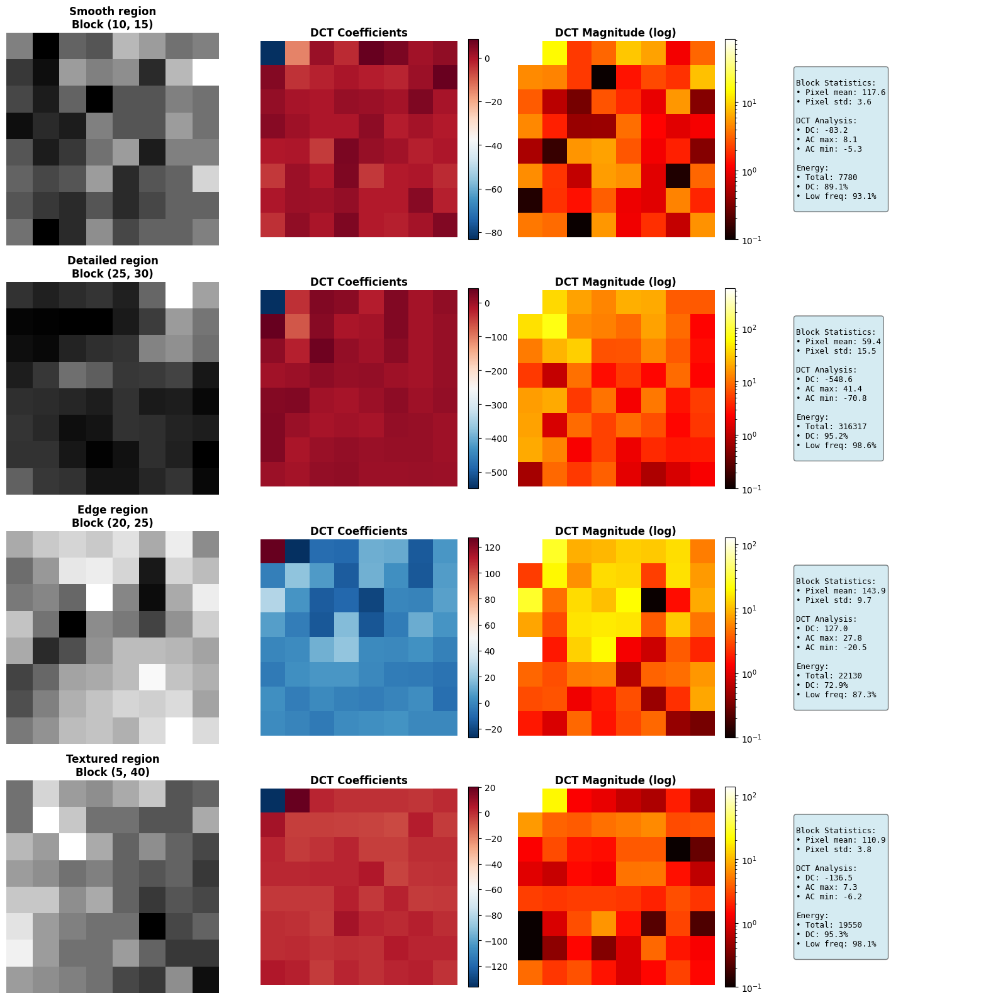

✓ Step 4 Complete: Discrete Cosine Transform (DCT)

Note: Smooth regions have energy concentrated in DC coefficient
      Detailed regions have more energy in AC coefficients


In [27]:
# Analyze DCT patterns across different block types
block_samples = [
    (10, 15, "Smooth region"),
    (25, 30, "Detailed region"),
    (20, 25, "Edge region"),
    (5, 40, "Textured region")
]

fig, axes = plt.subplots(len(block_samples), 4, figsize=(16, 4*len(block_samples)))

for idx, (by, bx, desc) in enumerate(block_samples):
    if by >= Y_blocks.shape[0] or bx >= Y_blocks.shape[1]:
        continue

    block = Y_blocks[by, bx].astype(np.float32)
    dct_block = Y_dct_blocks[by, bx]

    # Original block
    axes[idx, 0].imshow(block, cmap='gray', interpolation='nearest')
    axes[idx, 0].set_title(f'{desc}\nBlock ({by}, {bx})', fontweight='bold')
    axes[idx, 0].axis('off')

    # DCT coefficients
    im1 = axes[idx, 1].imshow(dct_block, cmap='RdBu_r', interpolation='nearest')
    axes[idx, 1].set_title('DCT Coefficients', fontweight='bold')
    axes[idx, 1].axis('off')
    plt.colorbar(im1, ax=axes[idx, 1], fraction=0.046)

    # DCT magnitude (log)
    im2 = axes[idx, 2].imshow(np.abs(dct_block), cmap='hot', interpolation='nearest',
                              norm=plt.matplotlib.colors.LogNorm(vmin=0.1))
    axes[idx, 2].set_title('DCT Magnitude (log)', fontweight='bold')
    axes[idx, 2].axis('off')
    plt.colorbar(im2, ax=axes[idx, 2], fraction=0.046)

    # Energy analysis
    axes[idx, 3].axis('off')
    total_e = np.sum(dct_block ** 2)
    dc_e = dct_block[0, 0] ** 2
    low_e = np.sum(dct_block[:4, :4] ** 2)

    analysis_text = f"""
Block Statistics:
• Pixel mean: {block.mean():.1f}
• Pixel std: {block.std():.1f}

DCT Analysis:
• DC: {dct_block[0,0]:.1f}
• AC max: {dct_block[1:].max():.1f}
• AC min: {dct_block[1:].min():.1f}

Energy:
• Total: {total_e:.0f}
• DC: {dc_e/total_e*100:.1f}%
• Low freq: {low_e/total_e*100:.1f}%
    """
    axes[idx, 3].text(0.1, 0.5, analysis_text, fontsize=9, family='monospace',
                     verticalalignment='center',
                     bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

print("✓ Step 4 Complete: Discrete Cosine Transform (DCT)")
print("\nNote: Smooth regions have energy concentrated in DC coefficient")
print("      Detailed regions have more energy in AC coefficients")

---

<a id="step5"></a>
## 📍 Step 5: Quantization (THE LOSSY STEP)

### 🎯 Theory

**What is Quantization?**
- **This is the ONLY lossy step** in JPEG compression
- Each DCT coefficient is divided by a quantization value and rounded
- **Cannot be reversed** - information is permanently lost

**Why Quantization?**
- Creates many zeros (especially in high frequencies)
- Exploits human visual system's reduced sensitivity to high frequencies
- Provides the **quality vs. size trade-off**

**Quantization Process:**
```
Quantized[i,j] = round(DCT[i,j] / Q[i,j])

Dequantized[i,j] = Quantized[i,j] × Q[i,j]
```

**Quality Parameter (1-100):**
- **Higher quality** → Smaller Q values → Less loss → Larger file
- **Lower quality** → Larger Q values → More loss → Smaller file

**Standard JPEG Quantization Tables:**
- **Luminance table (Y)**: More detail preserved
- **Chrominance table (Cb/Cr)**: More aggressive quantization

### 💻 Implementation

In [28]:
# Standard JPEG quantization tables at Quality 50
QY_50 = np.array([
    [16, 11, 10, 16, 24,  40,  51,  61],
    [12, 12, 14, 19, 26,  58,  60,  55],
    [14, 13, 16, 24, 40,  57,  69,  56],
    [14, 17, 22, 29, 51,  87,  80,  62],
    [18, 22, 37, 56, 68, 109, 103,  77],
    [24, 35, 55, 64, 81, 104, 113,  92],
    [49, 64, 78, 87,103, 121, 120, 101],
    [72, 92, 95, 98,112, 100, 103,  99]
], dtype=np.float32)

QC_50 = np.array([
    [17, 18, 24, 47, 99, 99, 99, 99],
    [18, 21, 26, 66, 99, 99, 99, 99],
    [24, 26, 56, 99, 99, 99, 99, 99],
    [47, 66, 99, 99, 99, 99, 99, 99],
    [99, 99, 99, 99, 99, 99, 99, 99],
    [99, 99, 99, 99, 99, 99, 99, 99],
    [99, 99, 99, 99, 99, 99, 99, 99],
    [99, 99, 99, 99, 99, 99, 99, 99]
], dtype=np.float32)


def quality_to_scale(quality):
    """
    Convert quality parameter (1-100) to quantization scale factor.
    Based on Independent JPEG Group's formula.
    """
    if quality < 1:
        quality = 1
    if quality > 100:
        quality = 100

    if quality < 50:
        scale = 5000.0 / quality
    else:
        scale = 200.0 - 2.0 * quality

    return scale


def scale_quantization_table(Q_base, quality):
    """
    Scale quantization table based on quality parameter.

    Parameters:
        Q_base: Base quantization table (at quality 50)
        quality: Quality parameter (1-100)

    Returns:
        Scaled quantization table
    """
    scale = quality_to_scale(quality)
    Q_scaled = np.floor((Q_base * scale + 50.0) / 100.0)
    Q_scaled = np.clip(Q_scaled, 1, 255)  # Ensure valid range
    return Q_scaled.astype(np.float32)


def quantize_blocks(dct_blocks, Q_table):
    """
    Quantize DCT coefficient blocks.

    Parameters:
        dct_blocks: 4D array of DCT coefficients
        Q_table: 8×8 quantization table

    Returns:
        quantized_blocks: 4D array of quantized coefficients
    """
    num_blocks_h, num_blocks_w, _, _ = dct_blocks.shape
    quantized = np.zeros_like(dct_blocks, dtype=np.float32)

    for i in range(num_blocks_h):
        for j in range(num_blocks_w):
            # Divide by Q and round
            quantized[i, j] = np.round(dct_blocks[i, j] / Q_table)

    return quantized


def dequantize_blocks(quantized_blocks, Q_table):
    """
    Dequantize coefficient blocks (for reconstruction).

    Parameters:
        quantized_blocks: 4D array of quantized coefficients
        Q_table: 8×8 quantization table

    Returns:
        dequantized_blocks: 4D array of DCT coefficients
    """
    num_blocks_h, num_blocks_w, _, _ = quantized_blocks.shape
    dequantized = np.zeros_like(quantized_blocks, dtype=np.float32)

    for i in range(num_blocks_h):
        for j in range(num_blocks_w):
            # Multiply by Q
            dequantized[i, j] = quantized_blocks[i, j] * Q_table

    return dequantized

In [29]:
# Set quality level for this demonstration
QUALITY = 50
print(f"Using JPEG Quality: {QUALITY}")

# Generate quantization tables for this quality
QY = scale_quantization_table(QY_50, QUALITY)
QC = scale_quantization_table(QC_50, QUALITY)

print(f"\n✓ Quantization tables generated for quality {QUALITY}")

Using JPEG Quality: 50

✓ Quantization tables generated for quality 50


### 📊 Visualize Quantization Tables

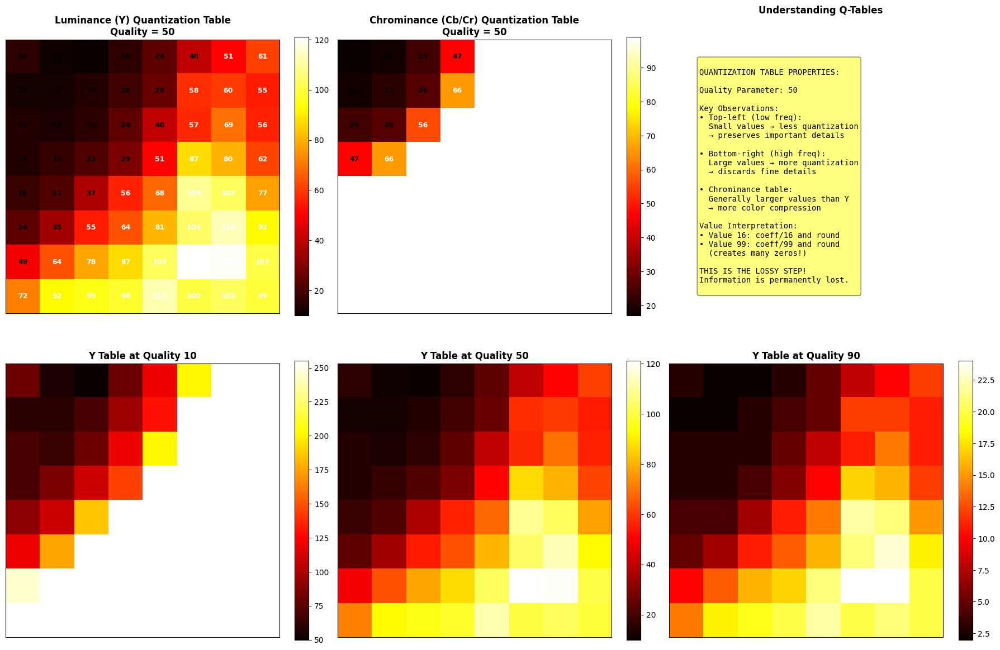


QUANTIZATION TABLE COMPARISON:
Quality 10:  Q[0,0]=80, Q[7,7]=255
Quality 50:  Q[0,0]=16, Q[7,7]=99
Quality 90:  Q[0,0]=3, Q[7,7]=20

Lower quality → Larger Q values → More zeros → Better compression


In [30]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Luminance table
im0 = axes[0, 0].imshow(QY, cmap='hot', interpolation='nearest')
axes[0, 0].set_title(f'Luminance (Y) Quantization Table\nQuality = {QUALITY}',
                     fontsize=12, fontweight='bold')
for i in range(8):
    for j in range(8):
        color = 'white' if QY[i,j] > 50 else 'black'
        axes[0, 0].text(j, i, f'{int(QY[i,j])}', ha='center', va='center',
                       color=color, fontsize=9, fontweight='bold')
axes[0, 0].set_xticks([])
axes[0, 0].set_yticks([])
plt.colorbar(im0, ax=axes[0, 0], fraction=0.046)

# Chrominance table
im1 = axes[0, 1].imshow(QC, cmap='hot', interpolation='nearest')
axes[0, 1].set_title(f'Chrominance (Cb/Cr) Quantization Table\nQuality = {QUALITY}',
                     fontsize=12, fontweight='bold')
for i in range(8):
    for j in range(8):
        color = 'white' if QC[i,j] > 50 else 'black'
        axes[0, 1].text(j, i, f'{int(QC[i,j])}', ha='center', va='center',
                       color=color, fontsize=9, fontweight='bold')
axes[0, 1].set_xticks([])
axes[0, 1].set_yticks([])
plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)

# Info
axes[0, 2].axis('off')
axes[0, 2].set_title('Understanding Q-Tables', fontsize=12, fontweight='bold')
info_text = f"""
QUANTIZATION TABLE PROPERTIES:

Quality Parameter: {QUALITY}

Key Observations:
• Top-left (low freq):
  Small values → less quantization
  → preserves important details

• Bottom-right (high freq):
  Large values → more quantization
  → discards fine details

• Chrominance table:
  Generally larger values than Y
  → more color compression

Value Interpretation:
• Value 16: coeff/16 and round
• Value 99: coeff/99 and round
  (creates many zeros!)

THIS IS THE LOSSY STEP!
Information is permanently lost.
"""
axes[0, 2].text(0.1, 0.5, info_text, fontsize=10, family='monospace',
               verticalalignment='center',
               bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))

# Compare tables at different qualities
qualities = [10, 50, 90]
for idx, q in enumerate(qualities):
    Q_compare = scale_quantization_table(QY_50, q)
    im = axes[1, idx].imshow(Q_compare, cmap='hot', interpolation='nearest')
    axes[1, idx].set_title(f'Y Table at Quality {q}', fontweight='bold')
    axes[1, idx].set_xticks([])
    axes[1, idx].set_yticks([])
    plt.colorbar(im, ax=axes[1, idx], fraction=0.046)

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("QUANTIZATION TABLE COMPARISON:")
print("="*70)
print(f"Quality 10:  Q[0,0]={scale_quantization_table(QY_50, 10)[0,0]:.0f}, "
      f"Q[7,7]={scale_quantization_table(QY_50, 10)[7,7]:.0f}")
print(f"Quality 50:  Q[0,0]={QY[0,0]:.0f}, Q[7,7]={QY[7,7]:.0f}")
print(f"Quality 90:  Q[0,0]={scale_quantization_table(QY_50, 90)[0,0]:.0f}, "
      f"Q[7,7]={scale_quantization_table(QY_50, 90)[7,7]:.0f}")
print("\nLower quality → Larger Q values → More zeros → Better compression")
print("="*70)

### 💻 Apply Quantization

In [31]:
print(f"\nApplying quantization (Quality = {QUALITY})...")

# Quantize all blocks
Y_quantized = quantize_blocks(Y_dct_blocks, QY)
Cb_quantized = quantize_blocks(Cb_dct_blocks, QC)
Cr_quantized = quantize_blocks(Cr_dct_blocks, QC)

# Calculate statistics
total_coeffs_Y = Y_quantized.size
zeros_Y = np.sum(Y_quantized == 0)
total_coeffs_Cb = Cb_quantized.size
zeros_Cb = np.sum(Cb_quantized == 0)
total_coeffs_Cr = Cr_quantized.size
zeros_Cr = np.sum(Cr_quantized == 0)

total_coeffs = total_coeffs_Y + total_coeffs_Cb + total_coeffs_Cr
total_zeros = zeros_Y + zeros_Cb + zeros_Cr

print("\n" + "="*70)
print("QUANTIZATION RESULTS:")
print("="*70)
print(f"Y channel:")
print(f"  Total coefficients: {total_coeffs_Y:,}")
print(f"  Zero coefficients: {zeros_Y:,} ({zeros_Y/total_coeffs_Y*100:.2f}%)")
print(f"  Non-zero coefficients: {total_coeffs_Y - zeros_Y:,}")

print(f"\nCb channel:")
print(f"  Total coefficients: {total_coeffs_Cb:,}")
print(f"  Zero coefficients: {zeros_Cb:,} ({zeros_Cb/total_coeffs_Cb*100:.2f}%)")
print(f"  Non-zero coefficients: {total_coeffs_Cb - zeros_Cb:,}")

print(f"\nCr channel:")
print(f"  Total coefficients: {total_coeffs_Cr:,}")
print(f"  Zero coefficients: {zeros_Cr:,} ({zeros_Cr/total_coeffs_Cr*100:.2f}%)")
print(f"  Non-zero coefficients: {total_coeffs_Cr - zeros_Cr:,}")

print(f"\n{'='*70}")
print(f"OVERALL:")
print(f"  Total coefficients: {total_coeffs:,}")
print(f"  Zero coefficients: {total_zeros:,} ({total_zeros/total_coeffs*100:.2f}%)")
print(f"  Non-zero coefficients: {total_coeffs - total_zeros:,}")
print(f"  Sparsity: {total_zeros/total_coeffs*100:.1f}%")
print("="*70)

print("\n✓ Quantization complete!")
print("✓ Many coefficients are now zero - ready for efficient encoding!")


Applying quantization (Quality = 50)...

QUANTIZATION RESULTS:
Y channel:
  Total coefficients: 262,144
  Zero coefficients: 233,677 (89.14%)
  Non-zero coefficients: 28,467

Cb channel:
  Total coefficients: 65,536
  Zero coefficients: 63,142 (96.35%)
  Non-zero coefficients: 2,394

Cr channel:
  Total coefficients: 65,536
  Zero coefficients: 63,119 (96.31%)
  Non-zero coefficients: 2,417

OVERALL:
  Total coefficients: 393,216
  Zero coefficients: 359,938 (91.54%)
  Non-zero coefficients: 33,278
  Sparsity: 91.5%

✓ Quantization complete!
✓ Many coefficients are now zero - ready for efficient encoding!



### 🔍 Detailed Analysis: Sample Block

In [32]:
# Use the same sample block as before
sample_dct = Y_dct_blocks[sample_block_y, sample_block_x]
sample_quantized = Y_quantized[sample_block_y, sample_block_x]
sample_dequantized = sample_quantized * QY

print(f"\nDetailed analysis of Block ({sample_block_y}, {sample_block_x}):")
print("\n" + "="*70)
print("ORIGINAL DCT COEFFICIENTS:")
print("="*70)
print(sample_dct)

print("\n" + "="*70)
print("QUANTIZATION TABLE (QY):")
print("="*70)
print(QY.astype(int))

print("\n" + "="*70)
print("QUANTIZED COEFFICIENTS (DCT / QY, rounded):")
print("="*70)
print(sample_quantized.astype(int))

print("\n" + "="*70)
print("DEQUANTIZED COEFFICIENTS (Quantized × QY):")
print("="*70)
print(sample_dequantized)

# Count zeros
total_coeffs_block = 64
zeros_block = np.sum(sample_quantized == 0)
print("\n" + "="*70)
print("COMPRESSION STATISTICS:")
print("="*70)
print(f"Total coefficients: {total_coeffs_block}")
print(f"Zero coefficients: {zeros_block} ({zeros_block/total_coeffs_block*100:.1f}%)")
print(f"Non-zero coefficients: {total_coeffs_block - zeros_block}")
print(f"Sparsity: {zeros_block/total_coeffs_block*100:.1f}%")

# Error analysis
error = sample_dct - sample_dequantized
print("\n" + "="*70)
print("QUANTIZATION ERROR (LOSS):")
print("="*70)
print(error)
print(f"\nMax absolute error: {np.abs(error).max():.2f}")
print(f"Mean absolute error: {np.abs(error).mean():.2f}")
print(f"RMS error: {np.sqrt(np.mean(error**2)):.2f}")
print("="*70)


Detailed analysis of Block (15, 20):

ORIGINAL DCT COEFFICIENTS:
[[-37.88 -29.77   4.44  -8.45   3.12  -1.34   4.52  -8.04]
 [-26.51  -6.95   6.8   -1.82   8.76  -1.41   1.03  -3.76]
 [  1.61  17.72   2.58 -14.52   7.27   2.85  -4.64   4.35]
 [ 11.87  -5.91  -6.43 -12.01  -2.08  -6.61   1.7   -1.24]
 [ -8.12  -8.49 -20.85   1.19   6.88  -2.8    5.52   3.91]
 [ -1.64  -1.64   1.61  14.77   2.82   0.17  -0.27   0.36]
 [ -2.97   4.65   4.11   1.97  -3.69  -1.04  -0.08  -4.03]
 [ -1.49  -2.87  -0.11   4.14  -5.14  -0.45   1.3   -1.71]]

QUANTIZATION TABLE (QY):
[[ 16  11  10  16  24  40  51  61]
 [ 12  12  14  19  26  58  60  55]
 [ 14  13  16  24  40  57  69  56]
 [ 14  17  22  29  51  87  80  62]
 [ 18  22  37  56  68 109 103  77]
 [ 24  35  55  64  81 104 113  92]
 [ 49  64  78  87 103 121 120 101]
 [ 72  92  95  98 112 100 103  99]]

QUANTIZED COEFFICIENTS (DCT / QY, rounded):
[[-2 -3  0 -1  0  0  0  0]
 [-2 -1  0  0  0  0  0  0]
 [ 0  1  0 -1  0  0  0  0]
 [ 1  0  0  0  0  0  0  0]
 

### 📊 Comprehensive Visualization

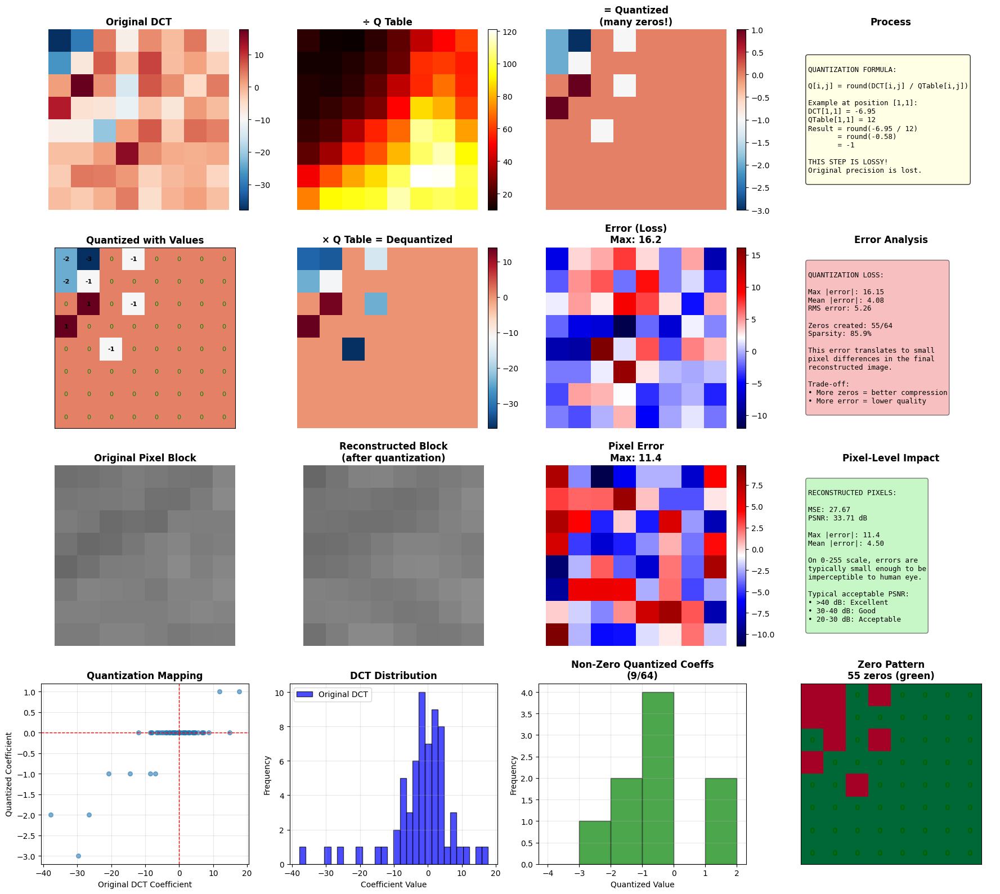

✓ Step 5 Complete: Quantization

The image is now highly compressed due to many zero coefficients!


In [33]:
fig = plt.figure(figsize=(18, 16))

# Row 1: DCT → Quantization process
ax1 = plt.subplot(4, 4, 1)
im1 = ax1.imshow(sample_dct, cmap='RdBu_r', interpolation='nearest')
ax1.set_title('Original DCT', fontweight='bold')
ax1.axis('off')
plt.colorbar(im1, ax=ax1, fraction=0.046)

ax2 = plt.subplot(4, 4, 2)
im2 = ax2.imshow(QY, cmap='hot', interpolation='nearest')
ax2.set_title('÷ Q Table', fontweight='bold')
ax2.axis('off')
plt.colorbar(im2, ax=ax2, fraction=0.046)

ax3 = plt.subplot(4, 4, 3)
im3 = ax3.imshow(sample_quantized, cmap='RdBu_r', interpolation='nearest')
ax3.set_title('= Quantized\n(many zeros!)', fontweight='bold')
ax3.axis('off')
plt.colorbar(im3, ax=ax3, fraction=0.046)

ax4 = plt.subplot(4, 4, 4)
ax4.axis('off')
ax4.set_title('Process', fontweight='bold')
process_text = f"""
QUANTIZATION FORMULA:

Q[i,j] = round(DCT[i,j] / QTable[i,j])

Example at position [1,1]:
DCT[1,1] = {sample_dct[1,1]:.2f}
QTable[1,1] = {QY[1,1]:.0f}
Result = round({sample_dct[1,1]:.2f} / {QY[1,1]:.0f})
       = round({sample_dct[1,1]/QY[1,1]:.2f})
       = {sample_quantized[1,1]:.0f}

THIS STEP IS LOSSY!
Original precision is lost.
"""
ax4.text(0.1, 0.5, process_text, fontsize=9, family='monospace',
        verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

# Row 2: Quantized with values
ax5 = plt.subplot(4, 4, 5)
im5 = ax5.imshow(sample_quantized, cmap='RdBu_r', interpolation='nearest')
ax5.set_title('Quantized with Values', fontweight='bold')
for i in range(8):
    for j in range(8):
        val = sample_quantized[i, j]
        if val == 0:
            color = 'green'
            weight = 'normal'
        else:
            color = 'white' if abs(val) > 3 else 'black'
            weight = 'bold'
        ax5.text(j, i, f'{int(val)}', ha="center", va="center",
                color=color, fontsize=8, fontweight=weight)
ax5.set_xticks([])
ax5.set_yticks([])

# Row 2: Dequantization
ax6 = plt.subplot(4, 4, 6)
im6 = ax6.imshow(sample_dequantized, cmap='RdBu_r', interpolation='nearest')
ax6.set_title('× Q Table = Dequantized', fontweight='bold')
ax6.axis('off')
plt.colorbar(im6, ax=ax6, fraction=0.046)

ax7 = plt.subplot(4, 4, 7)
im7 = ax7.imshow(error, cmap='seismic', interpolation='nearest')
ax7.set_title(f'Error (Loss)\nMax: {np.abs(error).max():.1f}', fontweight='bold')
ax7.axis('off')
plt.colorbar(im7, ax=ax7, fraction=0.046)

ax8 = plt.subplot(4, 4, 8)
ax8.axis('off')
ax8.set_title('Error Analysis', fontweight='bold')
error_text = f"""
QUANTIZATION LOSS:

Max |error|: {np.abs(error).max():.2f}
Mean |error|: {np.abs(error).mean():.2f}
RMS error: {np.sqrt(np.mean(error**2)):.2f}

Zeros created: {zeros_block}/64
Sparsity: {zeros_block/64*100:.1f}%

This error translates to small
pixel differences in the final
reconstructed image.

Trade-off:
• More zeros = better compression
• More error = lower quality
"""
ax8.text(0.1, 0.5, error_text, fontsize=9, family='monospace',
        verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.5))

# Row 3: Reconstruct and compare blocks
original_pixel_block = Y_blocks[sample_block_y, sample_block_x]
reconstructed_dct = sample_dequantized
reconstructed_pixel_block = cv2.idct(reconstructed_dct) + 128.0
pixel_error = original_pixel_block - reconstructed_pixel_block

ax9 = plt.subplot(4, 4, 9)
ax9.imshow(original_pixel_block, cmap='gray', interpolation='nearest', vmin=0, vmax=255)
ax9.set_title('Original Pixel Block', fontweight='bold')
ax9.axis('off')

ax10 = plt.subplot(4, 4, 10)
ax10.imshow(reconstructed_pixel_block, cmap='gray', interpolation='nearest', vmin=0, vmax=255)
ax10.set_title('Reconstructed Block\n(after quantization)', fontweight='bold')
ax10.axis('off')

ax11 = plt.subplot(4, 4, 11)
im11 = ax11.imshow(pixel_error, cmap='seismic', interpolation='nearest')
ax11.set_title(f'Pixel Error\nMax: {np.abs(pixel_error).max():.1f}', fontweight='bold')
ax11.axis('off')
plt.colorbar(im11, ax=ax11, fraction=0.046)

ax12 = plt.subplot(4, 4, 12)
ax12.axis('off')
ax12.set_title('Pixel-Level Impact', fontweight='bold')
pixel_text = f"""
RECONSTRUCTED PIXELS:

MSE: {np.mean(pixel_error**2):.2f}
PSNR: {20*np.log10(255.0/np.sqrt(np.mean(pixel_error**2))):.2f} dB

Max |error|: {np.abs(pixel_error).max():.1f}
Mean |error|: {np.abs(pixel_error).mean():.2f}

On 0-255 scale, errors are
typically small enough to be
imperceptible to human eye.

Typical acceptable PSNR:
• >40 dB: Excellent
• 30-40 dB: Good
• 20-30 dB: Acceptable
"""
ax12.text(0.1, 0.5, pixel_text, fontsize=9, family='monospace',
         verticalalignment='center',
         bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

# Row 4: Distribution analysis
ax13 = plt.subplot(4, 4, 13)
dct_flat = sample_dct.flatten()
quant_flat = sample_quantized.flatten()
ax13.scatter(dct_flat, quant_flat, alpha=0.6, s=30)
ax13.axhline(0, color='red', linestyle='--', linewidth=1)
ax13.axvline(0, color='red', linestyle='--', linewidth=1)
ax13.set_xlabel('Original DCT Coefficient')
ax13.set_ylabel('Quantized Coefficient')
ax13.set_title('Quantization Mapping', fontweight='bold')
ax13.grid(True, alpha=0.3)

ax14 = plt.subplot(4, 4, 14)
ax14.hist(sample_dct.flatten(), bins=30, alpha=0.7, label='Original DCT', color='blue', edgecolor='black')
ax14.set_xlabel('Coefficient Value')
ax14.set_ylabel('Frequency')
ax14.set_title('DCT Distribution', fontweight='bold')
ax14.legend()
ax14.grid(True, alpha=0.3)

ax15 = plt.subplot(4, 4, 15)
quant_nonzero = sample_quantized.flatten()
quant_nonzero = quant_nonzero[quant_nonzero != 0]
if len(quant_nonzero) > 0:
    ax15.hist(quant_nonzero, bins=range(int(quant_nonzero.min())-1, int(quant_nonzero.max())+2),
             alpha=0.7, color='green', edgecolor='black')
ax15.set_xlabel('Quantized Value')
ax15.set_ylabel('Frequency')
ax15.set_title(f'Non-Zero Quantized Coeffs\n({len(quant_nonzero)}/{64})', fontweight='bold')
ax15.grid(True, alpha=0.3)

ax16 = plt.subplot(4, 4, 16)
# Show zero pattern
zero_pattern = (sample_quantized == 0).astype(int)
im16 = ax16.imshow(zero_pattern, cmap='RdYlGn', interpolation='nearest', vmin=0, vmax=1)
ax16.set_title(f'Zero Pattern\n{zeros_block} zeros (green)', fontweight='bold')
for i in range(8):
    for j in range(8):
        if zero_pattern[i, j]:
            ax16.text(j, i, '0', ha="center", va="center", color='darkgreen', fontsize=10, fontweight='bold')
ax16.set_xticks([])
ax16.set_yticks([])

plt.tight_layout()
plt.show()

print("✓ Step 5 Complete: Quantization")
print("\nThe image is now highly compressed due to many zero coefficients!")

---

<a id="step6"></a>
## 📍 Step 6: Zigzag Scanning

### 🎯 Theory

**Why Zigzag Scanning?**
- After quantization, we have many zeros (especially in high frequencies)
- **Zigzag scan reorders** the 8×8 block into a 1D sequence
- Groups low-frequency (non-zero) coefficients at the beginning
- Groups high-frequency (mostly zero) coefficients at the end
- Makes **Run-Length Encoding very effective**

**Zigzag Pattern:**
```
Start: [0,0] (DC coefficient)
Path: Diagonal traversal from low freq → high freq
End: [7,7] (highest frequency)

Visual:
0 → 1    5 ...
    ↓  ↗
2   4  6 ...
  ↗   
3   ...
```

### 💻 Implementation

In [34]:
# Pre-compute zigzag indices
ZIGZAG_INDEX = np.array([
    [ 0,  1,  5,  6, 14, 15, 27, 28],
    [ 2,  4,  7, 13, 16, 26, 29, 42],
    [ 3,  8, 12, 17, 25, 30, 41, 43],
    [ 9, 11, 18, 24, 31, 40, 44, 53],
    [10, 19, 23, 32, 39, 45, 52, 54],
    [20, 22, 33, 38, 46, 51, 55, 60],
    [21, 34, 37, 47, 50, 56, 59, 61],
    [35, 36, 48, 49, 57, 58, 62, 63]
], dtype=np.int32)


def zigzag_encode(block):
    """
    Convert 8×8 block to 1D array using zigzag scan order.

    Parameters:
        block: 8×8 numpy array

    Returns:
        1D array of 64 values in zigzag order
    """
    zigzag_array = np.zeros(64, dtype=block.dtype)

    for i in range(8):
        for j in range(8):
            zigzag_array[ZIGZAG_INDEX[i, j]] = block[i, j]

    return zigzag_array


def zigzag_decode(zigzag_array):
    """
    Convert 1D zigzag array back to 8×8 block.

    Parameters:
        zigzag_array: 1D array of 64 values

    Returns:
        8×8 numpy array
    """
    block = np.zeros((8, 8), dtype=zigzag_array.dtype)

    for i in range(8):
        for j in range(8):
            block[i, j] = zigzag_array[ZIGZAG_INDEX[i, j]]

    return block


# Test zigzag encoding/decoding
test_block = Y_quantized[sample_block_y, sample_block_x]
test_zigzag = zigzag_encode(test_block)
test_reconstructed = zigzag_decode(test_zigzag)

assert np.array_equal(test_block, test_reconstructed), "Zigzag encoding/decoding failed!"
print("✓ Zigzag encode/decode verified!")

✓ Zigzag encode/decode verified!


### 📊 Visualize Zigzag Pattern

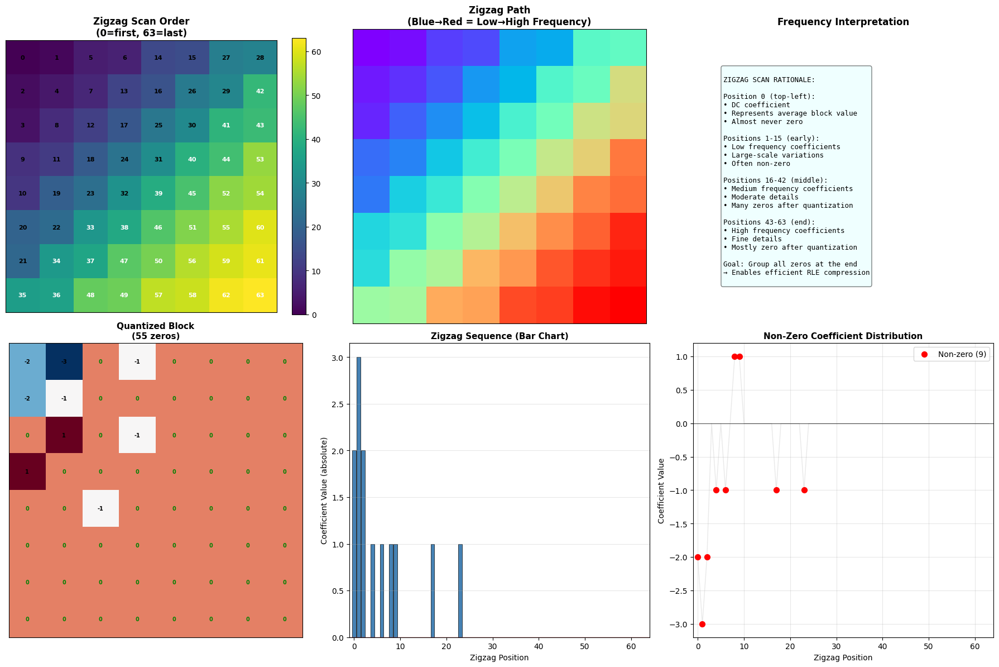


ZIGZAG ANALYSIS FOR BLOCK (15, 20):

Zigzag sequence (first 20 values):
[-2. -3. -2.  0. -1.  0. -1.  0.  1.  1. -0. -0.  0. -0.  0. -0.  0. -1. -0. -0.]

Zigzag sequence (last 20 values):
[ 0. -0.  0.  0. -0.  0. -0.  0.  0. -0.  0. -0. -0. -0. -0. -0.  0. -0.  0. -0.]

COMPRESSION BENEFIT:
Total coefficients: 64
Non-zero coefficients: 9
Zero coefficients: 55
Last non-zero at position: 23
Trailing zeros: 40

→ Can use EOB (End-Of-Block) marker after position 23
→ Don't need to encode 40 trailing zeros explicitly!

✓ Step 6 Complete: Zigzag Scanning


In [35]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Zigzag index pattern
im0 = axes[0, 0].imshow(ZIGZAG_INDEX, cmap='viridis', interpolation='nearest')
axes[0, 0].set_title('Zigzag Scan Order\n(0=first, 63=last)', fontsize=12, fontweight='bold')
for i in range(8):
    for j in range(8):
        color = 'white' if ZIGZAG_INDEX[i,j] > 32 else 'black'
        axes[0, 0].text(j, i, f'{ZIGZAG_INDEX[i,j]}', ha='center', va='center',
                       color=color, fontsize=8, fontweight='bold')
axes[0, 0].set_xticks([])
axes[0, 0].set_yticks([])
plt.colorbar(im0, ax=axes[0, 0], fraction=0.046)

# Zigzag path visualization
path_img = np.zeros((8, 8, 3), dtype=np.uint8)
colors = plt.cm.rainbow(np.linspace(0, 1, 64))
for idx in range(64):
    pos = np.where(ZIGZAG_INDEX == idx)
    i, j = pos[0][0], pos[1][0]
    path_img[i, j] = (colors[idx][:3] * 255).astype(np.uint8)

axes[0, 1].imshow(path_img, interpolation='nearest')
axes[0, 1].set_title('Zigzag Path\n(Blue→Red = Low→High Frequency)', fontsize=12, fontweight='bold')
axes[0, 1].set_xticks([])
axes[0, 1].set_yticks([])

# Frequency map
axes[0, 2].axis('off')
axes[0, 2].set_title('Frequency Interpretation', fontsize=12, fontweight='bold')
freq_text = """
ZIGZAG SCAN RATIONALE:

Position 0 (top-left):
• DC coefficient
• Represents average block value
• Almost never zero

Positions 1-15 (early):
• Low frequency coefficients
• Large-scale variations
• Often non-zero

Positions 16-42 (middle):
• Medium frequency coefficients
• Moderate details
• Many zeros after quantization

Positions 43-63 (end):
• High frequency coefficients
• Fine details
• Mostly zero after quantization

Goal: Group all zeros at the end
→ Enables efficient RLE compression
"""
axes[0, 2].text(0.1, 0.5, freq_text, fontsize=9, family='monospace',
               verticalalignment='center',
               bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.5))

# Apply to sample block
sample_zigzag = zigzag_encode(sample_quantized)

# Show the zigzag conversion
im1 = axes[1, 0].imshow(sample_quantized, cmap='RdBu_r', interpolation='nearest')
axes[1, 0].set_title(f'Quantized Block\n({zeros_block} zeros)', fontsize=11, fontweight='bold')
for i in range(8):
    for j in range(8):
        val = sample_quantized[i, j]
        color = 'green' if val == 0 else ('white' if abs(val) > 3 else 'black')
        axes[1, 0].text(j, i, f'{int(val)}', ha='center', va='center',
                       color=color, fontsize=7, fontweight='bold')
axes[1, 0].set_xticks([])
axes[1, 0].set_yticks([])

# Zigzag sequence visualization
axes[1, 1].bar(range(64), np.abs(sample_zigzag), color='steelblue', edgecolor='black', linewidth=0.5)
axes[1, 1].axhline(0, color='red', linestyle='-', linewidth=1)
axes[1, 1].set_xlabel('Zigzag Position')
axes[1, 1].set_ylabel('Coefficient Value (absolute)')
axes[1, 1].set_title('Zigzag Sequence (Bar Chart)', fontsize=11, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3, axis='y')
axes[1, 1].set_xlim(-1, 64)

# Non-zero positions
non_zero_positions = np.where(sample_zigzag != 0)[0]
axes[1, 2].scatter(non_zero_positions, sample_zigzag[non_zero_positions],
                  color='red', s=50, zorder=3, label=f'Non-zero ({len(non_zero_positions)})')
axes[1, 2].plot(sample_zigzag, color='lightgray', linewidth=1, zorder=1, alpha=0.5)
axes[1, 2].axhline(0, color='black', linestyle='-', linewidth=0.5)
axes[1, 2].set_xlabel('Zigzag Position')
axes[1, 2].set_ylabel('Coefficient Value')
axes[1, 2].set_title('Non-Zero Coefficient Distribution', fontsize=11, fontweight='bold')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)
axes[1, 2].set_xlim(-1, 64)

plt.tight_layout()
plt.show()

# Analysis
print("\n" + "="*70)
print(f"ZIGZAG ANALYSIS FOR BLOCK ({sample_block_y}, {sample_block_x}):")
print("="*70)
print(f"\nZigzag sequence (first 20 values):")
print(sample_zigzag[:20])
print(f"\nZigzag sequence (last 20 values):")
print(sample_zigzag[44:64])

# Find last non-zero position
last_nonzero_idx = np.where(sample_zigzag != 0)[0]
if len(last_nonzero_idx) > 0:
    last_nonzero = last_nonzero_idx[-1]
    trailing_zeros = 63 - last_nonzero
else:
    last_nonzero = -1
    trailing_zeros = 64

print(f"\n{'='*70}")
print(f"COMPRESSION BENEFIT:")
print(f"{'='*70}")
print(f"Total coefficients: 64")
print(f"Non-zero coefficients: {len(non_zero_positions)}")
print(f"Zero coefficients: {64 - len(non_zero_positions)}")
print(f"Last non-zero at position: {last_nonzero}")
print(f"Trailing zeros: {trailing_zeros}")
print(f"\n→ Can use EOB (End-Of-Block) marker after position {last_nonzero}")
print(f"→ Don't need to encode {trailing_zeros} trailing zeros explicitly!")
print("="*70)

print("\n✓ Step 6 Complete: Zigzag Scanning")

---

<a id="step7a"></a>
## 📍 Step 7A: Encoding - DC Differential Encoding

### 🎯 Theory

**Why Differential Encoding for DC Coefficients?**
- DC coefficients represent average block intensity
- **Adjacent blocks often have similar DC values** (image is usually continuous)
- Instead of encoding absolute DC values, encode the **difference** from previous block
- Differences are typically small → fewer bits needed

**Process:**
1. DC coefficients are extracted from each block in raster scan order
2. First DC is encoded as-is
3. Subsequent DCs encode as: `DC_diff = DC_current - DC_previous`
4. These differences are then Huffman coded

**Example:**
```
Block DCs:      [150, 148, 145, 147, 146, ...]
Differences:    [150,  -2,  -3,   2,  -1, ...]
                 ↑     ← Much smaller values!
            (first)    ← Easier to compress
```

### 💻 Implementation

In [36]:
def extract_dc_coefficients(quantized_blocks):
    """
    Extract DC coefficients (position [0,0]) from all blocks in raster scan order.

    Parameters:
        quantized_blocks: 4D array (num_blocks_h, num_blocks_w, 8, 8)

    Returns:
        dc_array: 1D array of DC coefficients
    """
    num_blocks_h, num_blocks_w, _, _ = quantized_blocks.shape
    dc_array = np.zeros(num_blocks_h * num_blocks_w)

    idx = 0
    for i in range(num_blocks_h):
        for j in range(num_blocks_w):
            dc_array[idx] = quantized_blocks[i, j, 0, 0]
            idx += 1

    return dc_array


def dc_differential_encode(dc_array):
    """
    Apply differential encoding to DC coefficients.

    Parameters:
        dc_array: 1D array of DC coefficients

    Returns:
        dc_diff: 1D array of DC differences
    """
    dc_diff = np.zeros_like(dc_array)
    dc_diff[0] = dc_array[0]  # First DC is encoded as-is

    for i in range(1, len(dc_array)):
        dc_diff[i] = dc_array[i] - dc_array[i-1]

    return dc_diff


def dc_differential_decode(dc_diff):
    """
    Decode differential DC coefficients back to absolute values.

    Parameters:
        dc_diff: 1D array of DC differences

    Returns:
        dc_array: 1D array of DC coefficients
    """
    dc_array = np.zeros_like(dc_diff)
    dc_array[0] = dc_diff[0]

    for i in range(1, len(dc_diff)):
        dc_array[i] = dc_array[i-1] + dc_diff[i]

    return dc_array


In [37]:
# Extract DC coefficients from Y channel
Y_dc_coeffs = extract_dc_coefficients(Y_quantized)
Cb_dc_coeffs = extract_dc_coefficients(Cb_quantized)
Cr_dc_coeffs = extract_dc_coefficients(Cr_quantized)

print("DC coefficients extracted:")
print(f"  Y:  {len(Y_dc_coeffs)} blocks")
print(f"  Cb: {len(Cb_dc_coeffs)} blocks")
print(f"  Cr: {len(Cr_dc_coeffs)} blocks")

# Apply differential encoding
Y_dc_diff = dc_differential_encode(Y_dc_coeffs)
Cb_dc_diff = dc_differential_encode(Cb_dc_coeffs)
Cr_dc_diff = dc_differential_encode(Cr_dc_coeffs)

# Verify decoding
Y_dc_reconstructed = dc_differential_decode(Y_dc_diff)
assert np.allclose(Y_dc_coeffs, Y_dc_reconstructed), "DC differential encoding failed!"

print("\n✓ DC differential encoding verified!")

DC coefficients extracted:
  Y:  4096 blocks
  Cb: 1024 blocks
  Cr: 1024 blocks

✓ DC differential encoding verified!


### 📊 Visualization and Analysis


DC DIFFERENTIAL ENCODING ANALYSIS:

Y Channel DC Coefficients (first 20):
Absolute values: [ 16  15  14  13  15  21  19   1 -17 -12 -11 -11 -11  -7  -3  -1   1   1   1   2]
Differences:     [ 16  -1  -1  -1   2   6  -2 -18 -18   5   1   0   0   4   4   2   2   0   0   1]

Statistics:
Metric                    Absolute DC     DC Differences
----------------------------------------------------------------------
Range:                    [-47.0, 48.0]  [-81.0, 62.0]
Mean:                     -2.23  -0.01
Std Dev:                  22.42  14.88
Mean Absolute Value:      18.57  9.13

Estimated bits per value: ~7 bits  ~8 bits
Compression benefit:      0.88x


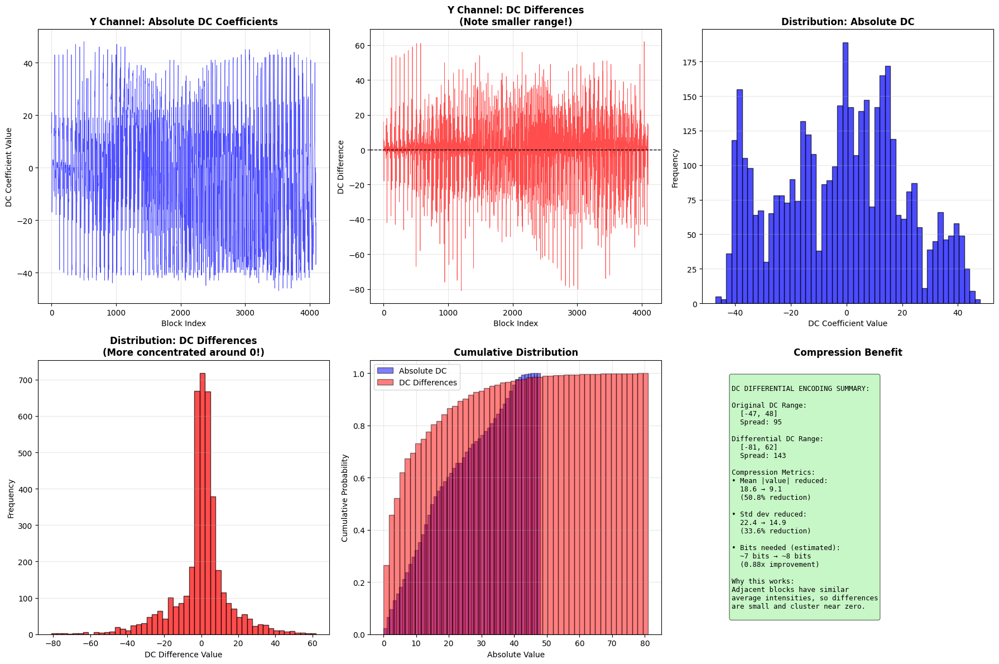


✓ Step 7A Complete: DC Differential Encoding


In [38]:
# Analyze compression benefit
print("\n" + "="*70)
print("DC DIFFERENTIAL ENCODING ANALYSIS:")
print("="*70)

print("\nY Channel DC Coefficients (first 20):")
print(f"Absolute values: {Y_dc_coeffs[:20].astype(int)}")
print(f"Differences:     {Y_dc_diff[:20].astype(int)}")

print(f"\nStatistics:")
print(f"{'Metric':<25} {'Absolute DC':<15} {'DC Differences'}")
print(f"{'-'*70}")
print(f"{'Range:':<25} [{Y_dc_coeffs.min():.1f}, {Y_dc_coeffs.max():.1f}]  "
      f"[{Y_dc_diff.min():.1f}, {Y_dc_diff.max():.1f}]")
print(f"{'Mean:':<25} {Y_dc_coeffs.mean():.2f}  "
      f"{Y_dc_diff.mean():.2f}")
print(f"{'Std Dev:':<25} {Y_dc_coeffs.std():.2f}  "
      f"{Y_dc_diff.std():.2f}")
print(f"{'Mean Absolute Value:':<25} {np.abs(Y_dc_coeffs).mean():.2f}  "
      f"{np.abs(Y_dc_diff).mean():.2f}")

# Estimate bits needed
def estimate_bits_needed(values):
    """Estimate average bits needed to encode values."""
    max_val = max(abs(values.min()), abs(values.max()))
    if max_val == 0:
        return 1
    return int(np.ceil(np.log2(max_val + 1))) + 1  # +1 for sign

bits_absolute = estimate_bits_needed(Y_dc_coeffs)
bits_diff = estimate_bits_needed(Y_dc_diff)

print(f"\n{'Estimated bits per value:':<25} ~{bits_absolute} bits  ~{bits_diff} bits")
print(f"{'Compression benefit:':<25} {bits_absolute/bits_diff:.2f}x")
print("="*70)

# Visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Plot DC coefficients
axes[0, 0].plot(Y_dc_coeffs, 'b-', linewidth=0.5, alpha=0.7)
axes[0, 0].set_xlabel('Block Index')
axes[0, 0].set_ylabel('DC Coefficient Value')
axes[0, 0].set_title('Y Channel: Absolute DC Coefficients', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(Y_dc_diff, 'r-', linewidth=0.5, alpha=0.7)
axes[0, 1].axhline(0, color='black', linestyle='--', linewidth=1)
axes[0, 1].set_xlabel('Block Index')
axes[0, 1].set_ylabel('DC Difference')
axes[0, 1].set_title('Y Channel: DC Differences\n(Note smaller range!)', fontsize=12, fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)

# Histograms
axes[0, 2].hist(Y_dc_coeffs, bins=50, color='blue', alpha=0.7, edgecolor='black')
axes[0, 2].set_xlabel('DC Coefficient Value')
axes[0, 2].set_ylabel('Frequency')
axes[0, 2].set_title('Distribution: Absolute DC', fontsize=12, fontweight='bold')
axes[0, 2].grid(True, alpha=0.3, axis='y')

axes[1, 0].hist(Y_dc_diff, bins=50, color='red', alpha=0.7, edgecolor='black')
axes[1, 0].set_xlabel('DC Difference Value')
axes[1, 0].set_ylabel('Frequency')
axes[1, 0].set_title('Distribution: DC Differences\n(More concentrated around 0!)', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Cumulative distribution
axes[1, 1].hist(np.abs(Y_dc_coeffs), bins=50, cumulative=True, density=True,
               color='blue', alpha=0.5, label='Absolute DC', edgecolor='black')
axes[1, 1].hist(np.abs(Y_dc_diff), bins=50, cumulative=True, density=True,
               color='red', alpha=0.5, label='DC Differences', edgecolor='black')
axes[1, 1].set_xlabel('Absolute Value')
axes[1, 1].set_ylabel('Cumulative Probability')
axes[1, 1].set_title('Cumulative Distribution', fontsize=12, fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# Summary
axes[1, 2].axis('off')
axes[1, 2].set_title('Compression Benefit', fontsize=12, fontweight='bold')
summary_text = f"""
DC DIFFERENTIAL ENCODING SUMMARY:

Original DC Range:
  [{Y_dc_coeffs.min():.0f}, {Y_dc_coeffs.max():.0f}]
  Spread: {Y_dc_coeffs.max() - Y_dc_coeffs.min():.0f}

Differential DC Range:
  [{Y_dc_diff.min():.0f}, {Y_dc_diff.max():.0f}]
  Spread: {Y_dc_diff.max() - Y_dc_diff.min():.0f}

Compression Metrics:
• Mean |value| reduced:
  {np.abs(Y_dc_coeffs).mean():.1f} → {np.abs(Y_dc_diff).mean():.1f}
  ({(1 - np.abs(Y_dc_diff).mean()/np.abs(Y_dc_coeffs).mean())*100:.1f}% reduction)

• Std dev reduced:
  {Y_dc_coeffs.std():.1f} → {Y_dc_diff.std():.1f}
  ({(1 - Y_dc_diff.std()/Y_dc_coeffs.std())*100:.1f}% reduction)

• Bits needed (estimated):
  ~{bits_absolute} bits → ~{bits_diff} bits
  ({bits_absolute/bits_diff:.2f}x improvement)

Why this works:
Adjacent blocks have similar
average intensities, so differences
are small and cluster near zero.
"""
axes[1, 2].text(0.1, 0.5, summary_text, fontsize=9, family='monospace',
               verticalalignment='center',
               bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n✓ Step 7A Complete: DC Differential Encoding")

---

<a id="step7b"></a>
## 📍 Step 7B: Encoding - AC Run-Length Encoding (RLE)

### 🎯 Theory

**What is Run-Length Encoding?**
- After quantization and zigzag scanning, we have many consecutive zeros
- **RLE compresses sequences of zeros** by encoding (run_length, value) pairs
- Instead of storing each zero, store "how many zeros, then what value"

**AC Coefficient Encoding:**
- AC coefficients = all 63 coefficients except DC (positions 1-63 in zigzag order)
- Each non-zero AC is encoded as: `(RUNLENGTH, VALUE)`
  - RUNLENGTH = number of zeros before this coefficient (0-15)
  - VALUE = the non-zero coefficient value
- **Special symbol EOB (End-Of-Block)**: Signals all remaining coefficients are zero

**Example:**
```
Zigzag AC sequence: [0, 0, 5, 0, 0, 0, -3, 0, 2, 0, 0, 0, 0, 0, ...]
                                                              ↑
                                                        (all zeros)

RLE encoding: [(2, 5), (3, -3), (1, 2), (0, 0)]
               ↑         ↑         ↑       ↑
            2 zeros,  3 zeros,  1 zero,  EOB
            then 5    then -3   then 2   (rest are zeros)
```

### 💻 Implementation

In [39]:
def ac_run_length_encode(zigzag_sequence):
    """
    Apply Run-Length Encoding to AC coefficients of a zigzag sequence.

    Parameters:
        zigzag_sequence: 1D array of 64 coefficients in zigzag order

    Returns:
        rle_list: List of (run, value) tuples
                  DC coefficient is not included (handled separately)
                  EOB is represented as (0, 0)
    """
    rle_list = []
    run = 0

    # Process AC coefficients (skip DC at position 0)
    for i in range(1, 64):
        if zigzag_sequence[i] == 0:
            run += 1
        else:
            # Found non-zero coefficient
            # Handle runs > 15 with special ZRL (Zero Run Length) symbol
            while run > 15:
                rle_list.append((15, 0))  # ZRL: 15 zeros
                run -= 16

            rle_list.append((run, zigzag_sequence[i]))
            run = 0

    # If we end with zeros (which is common), add EOB
    if run > 0 or len(rle_list) == 0:
        rle_list.append((0, 0))  # EOB marker

    return rle_list


def ac_run_length_decode(rle_list):
    """
    Decode Run-Length Encoded AC coefficients back to zigzag sequence.

    Parameters:
        rle_list: List of (run, value) tuples

    Returns:
        ac_sequence: 1D array of 63 AC coefficients
    """
    ac_sequence = np.zeros(63, dtype=np.float32)
    pos = 0

    for run, value in rle_list:
        if run == 0 and value == 0:  # EOB
            break

        pos += run  # Skip 'run' zeros

        if pos < 63:
            ac_sequence[pos] = value
            pos += 1

    return ac_sequence

In [40]:
# Test RLE on sample block
sample_zigzag = zigzag_encode(Y_quantized[sample_block_y, sample_block_x])
sample_dc = sample_zigzag[0]
sample_ac = sample_zigzag[1:]

sample_rle = ac_run_length_encode(sample_zigzag)

print(f"Sample block zigzag sequence:")
print(f"DC: {sample_dc}")
print(f"AC (first 20): {sample_ac[:20].astype(int)}")
print(f"\nRLE encoding:")
for i, (run, val) in enumerate(sample_rle):
    if run == 0 and val == 0:
        print(f"  {i}: EOB (End-Of-Block)")
    else:
        print(f"  {i}: ({run}, {val:.0f}) → skip {run} zeros, then value {val:.0f}")

# Verify decoding
sample_ac_decoded = ac_run_length_decode(sample_rle)
assert np.allclose(sample_ac, sample_ac_decoded), "RLE decoding failed!"

print("\n✓ RLE encoding/decoding verified!")

Sample block zigzag sequence:
DC: -2.0
AC (first 20): [-3 -2  0 -1  0 -1  0  1  1  0  0  0  0  0  0  0 -1  0  0  0]

RLE encoding:
  0: (0, -3) → skip 0 zeros, then value -3
  1: (0, -2) → skip 0 zeros, then value -2
  2: (1, -1) → skip 1 zeros, then value -1
  3: (1, -1) → skip 1 zeros, then value -1
  4: (1, 1) → skip 1 zeros, then value 1
  5: (0, 1) → skip 0 zeros, then value 1
  6: (7, -1) → skip 7 zeros, then value -1
  7: (5, -1) → skip 5 zeros, then value -1
  8: EOB (End-Of-Block)

✓ RLE encoding/decoding verified!


### 📊 Analysis and Visualization


Applying RLE to all Y channel blocks...

RUN-LENGTH ENCODING STATISTICS:
Total blocks: 4096
Total AC coefficients: 258,048 (63 per block)
Total RLE symbols: 28,567
Average RLE symbols per block: 6.97
Compression ratio: 9.03:1
Size reduction: 88.9%

RLE Pattern Analysis:
  Total (run, value) pairs: 24,471
  EOB markers: 4,096
  Average EOB position: 5.97
    (Earlier EOB = more zeros = better compression)

Run length statistics:
  Min run: 0
  Max run: 15
  Mean run: 0.76
  Median run: 0.0

Non-zero AC value statistics:
  Min: -42
  Max: 58
  Mean: -0.01
  Median: -1.0


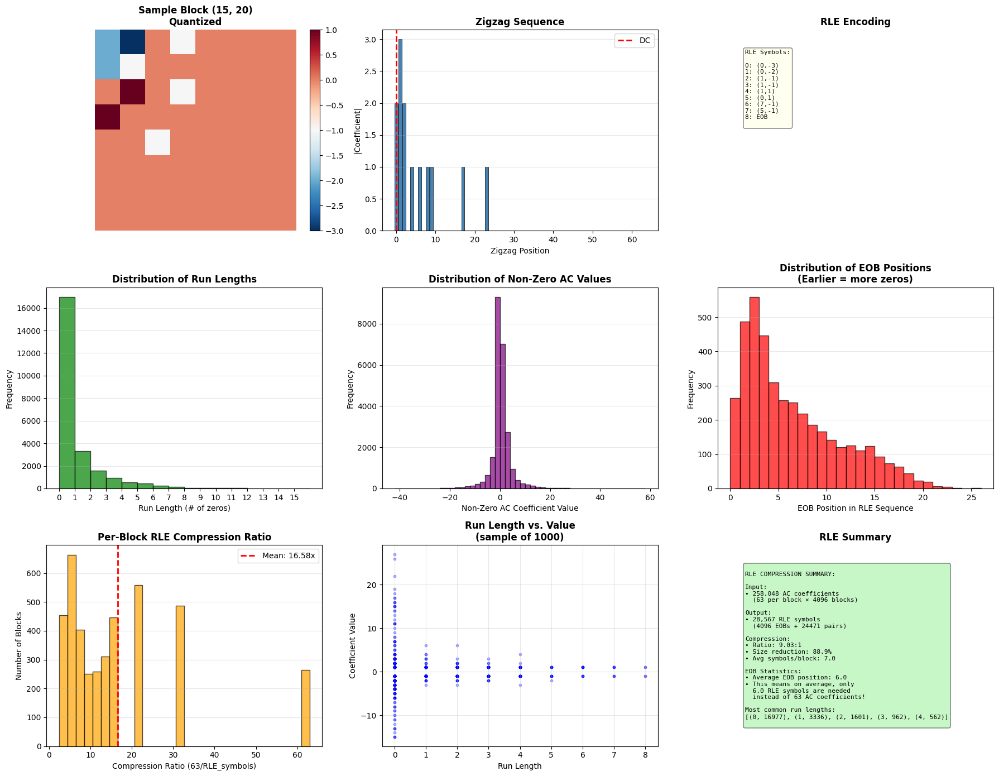


✓ Step 7B Complete: AC Run-Length Encoding (RLE)


In [41]:
# Apply RLE to all Y channel blocks
print("\nApplying RLE to all Y channel blocks...")
Y_rle_data = []
total_ac_coeffs = 0
total_rle_symbols = 0

for i in range(Y_quantized.shape[0]):
    for j in range(Y_quantized.shape[1]):
        block = Y_quantized[i, j]
        zigzag = zigzag_encode(block)
        rle = ac_run_length_encode(zigzag)
        Y_rle_data.append(rle)

        total_ac_coeffs += 63  # 63 AC coefficients per block
        total_rle_symbols += len(rle)

print(f"\n{'='*70}")
print("RUN-LENGTH ENCODING STATISTICS:")
print(f"{'='*70}")
print(f"Total blocks: {len(Y_rle_data)}")
print(f"Total AC coefficients: {total_ac_coeffs:,} (63 per block)")
print(f"Total RLE symbols: {total_rle_symbols:,}")
print(f"Average RLE symbols per block: {total_rle_symbols/len(Y_rle_data):.2f}")
print(f"Compression ratio: {total_ac_coeffs/total_rle_symbols:.2f}:1")
print(f"Size reduction: {(1 - total_rle_symbols/total_ac_coeffs)*100:.1f}%")
print(f"{'='*70}")

# Analyze RLE patterns
all_runs = []
all_values = []
eob_positions = []

for block_rle in Y_rle_data:
    for idx, (run, val) in enumerate(block_rle):
        if run == 0 and val == 0:  # EOB
            eob_positions.append(idx)
        else:
            all_runs.append(run)
            all_values.append(val)

print(f"\nRLE Pattern Analysis:")
print(f"  Total (run, value) pairs: {len(all_runs):,}")
print(f"  EOB markers: {len(eob_positions):,}")
print(f"  Average EOB position: {np.mean(eob_positions):.2f}")
print(f"    (Earlier EOB = more zeros = better compression)")

print(f"\nRun length statistics:")
print(f"  Min run: {min(all_runs)}")
print(f"  Max run: {max(all_runs)}")
print(f"  Mean run: {np.mean(all_runs):.2f}")
print(f"  Median run: {np.median(all_runs):.1f}")

print(f"\nNon-zero AC value statistics:")
print(f"  Min: {min(all_values):.0f}")
print(f"  Max: {max(all_values):.0f}")
print(f"  Mean: {np.mean(all_values):.2f}")
print(f"  Median: {np.median(all_values):.1f}")

# Visualization
fig = plt.figure(figsize=(18, 14))

# Sample block detailed RLE
ax1 = plt.subplot(3, 3, 1)
im1 = ax1.imshow(Y_quantized[sample_block_y, sample_block_x], cmap='RdBu_r', interpolation='nearest')
ax1.set_title(f'Sample Block ({sample_block_y}, {sample_block_x})\nQuantized', fontweight='bold')
ax1.axis('off')
plt.colorbar(im1, ax=ax1, fraction=0.046)

ax2 = plt.subplot(3, 3, 2)
ax2.bar(range(64), np.abs(sample_zigzag), color='steelblue', edgecolor='black', linewidth=0.5)
ax2.axvline(0, color='red', linestyle='--', linewidth=2, label='DC')
ax2.set_xlabel('Zigzag Position')
ax2.set_ylabel('|Coefficient|')
ax2.set_title('Zigzag Sequence', fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3, axis='y')

ax3 = plt.subplot(3, 3, 3)
ax3.axis('off')
ax3.set_title('RLE Encoding', fontweight='bold')
rle_text = "RLE Symbols:\n\n"
for i, (run, val) in enumerate(sample_rle[:15]):  # Show first 15
    if run == 0 and val == 0:
        rle_text += f"{i}: EOB\n"
    else:
        rle_text += f"{i}: ({run},{val:.0f})\n"
if len(sample_rle) > 15:
    rle_text += f"... ({len(sample_rle)-15} more)"
ax3.text(0.1, 0.9, rle_text, fontsize=8, family='monospace',
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.5))

# Run length distribution
ax4 = plt.subplot(3, 3, 4)
ax4.hist(all_runs, bins=range(0, max(all_runs)+2), color='green', alpha=0.7, edgecolor='black')
ax4.set_xlabel('Run Length (# of zeros)')
ax4.set_ylabel('Frequency')
ax4.set_title('Distribution of Run Lengths', fontweight='bold')
ax4.grid(True, alpha=0.3, axis='y')
ax4.set_xticks(range(0, max(all_runs)+1))

# Value distribution
ax5 = plt.subplot(3, 3, 5)
ax5.hist(all_values, bins=50, color='purple', alpha=0.7, edgecolor='black')
ax5.set_xlabel('Non-Zero AC Coefficient Value')
ax5.set_ylabel('Frequency')
ax5.set_title('Distribution of Non-Zero AC Values', fontweight='bold')
ax5.grid(True, alpha=0.3, axis='y')

# EOB position distribution
ax6 = plt.subplot(3, 3, 6)
ax6.hist(eob_positions, bins=range(0, max(eob_positions)+2), color='red', alpha=0.7, edgecolor='black')
ax6.set_xlabel('EOB Position in RLE Sequence')
ax6.set_ylabel('Frequency')
ax6.set_title('Distribution of EOB Positions\n(Earlier = more zeros)', fontweight='bold')
ax6.grid(True, alpha=0.3, axis='y')

# Compression ratio per block
block_compression_ratios = []
for block_rle in Y_rle_data:
    compression_ratio = 63 / len(block_rle)
    block_compression_ratios.append(compression_ratio)

ax7 = plt.subplot(3, 3, 7)
ax7.hist(block_compression_ratios, bins=30, color='orange', alpha=0.7, edgecolor='black')
ax7.axvline(np.mean(block_compression_ratios), color='red', linestyle='--',
           linewidth=2, label=f'Mean: {np.mean(block_compression_ratios):.2f}x')
ax7.set_xlabel('Compression Ratio (63/RLE_symbols)')
ax7.set_ylabel('Number of Blocks')
ax7.set_title('Per-Block RLE Compression Ratio', fontweight='bold')
ax7.legend()
ax7.grid(True, alpha=0.3, axis='y')

# Run-value scatter plot
ax8 = plt.subplot(3, 3, 8)
sample_runs = all_runs[:1000]  # Sample for visibility
sample_vals = all_values[:1000]
ax8.scatter(sample_runs, sample_vals, alpha=0.3, s=10, color='blue')
ax8.set_xlabel('Run Length')
ax8.set_ylabel('Coefficient Value')
ax8.set_title('Run Length vs. Value\n(sample of 1000)', fontweight='bold')
ax8.grid(True, alpha=0.3)

# Summary statistics
ax9 = plt.subplot(3, 3, 9)
ax9.axis('off')
ax9.set_title('RLE Summary', fontweight='bold')
summary_text = f"""
RLE COMPRESSION SUMMARY:

Input:
• {total_ac_coeffs:,} AC coefficients
  (63 per block × {len(Y_rle_data)} blocks)

Output:
• {total_rle_symbols:,} RLE symbols
  ({len(eob_positions)} EOBs + {len(all_runs)} pairs)

Compression:
• Ratio: {total_ac_coeffs/total_rle_symbols:.2f}:1
• Size reduction: {(1-total_rle_symbols/total_ac_coeffs)*100:.1f}%
• Avg symbols/block: {total_rle_symbols/len(Y_rle_data):.1f}

EOB Statistics:
• Average EOB position: {np.mean(eob_positions):.1f}
• This means on average, only
  {np.mean(eob_positions):.1f} RLE symbols are needed
  instead of 63 AC coefficients!

Most common run lengths:
{Counter(all_runs).most_common(5)}
"""
ax9.text(0.1, 0.5, summary_text, fontsize=8, family='monospace',
        verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n✓ Step 7B Complete: AC Run-Length Encoding (RLE)")

---

<a id="step7c"></a>
## 📍 Step 7C: Encoding - Huffman Entropy Coding

### 🎯 Theory

**What is Huffman Coding?**
- **Variable-length encoding**: Frequent symbols get short codes, rare symbols get long codes
- **Prefix-free**: No code is a prefix of another (enables unambiguous decoding)
- **Optimal**: Minimizes average code length given symbol frequencies
- **Lossless**: Can be perfectly reversed

**In JPEG:**
- Separate Huffman tables for DC and AC coefficients
- DC differences are Huffman encoded
- AC run-length pairs (run, value) are encoded in two parts:
  1. (RUN, SIZE) → Huffman encoded
  2. VALUE → Binary encoded with SIZE bits

**Example:**
```
Symbol Frequency → Huffman Code
  'A'     50%    → '0'        (1 bit)
  'B'     25%    → '10'       (2 bits)
  'C'     15%    → '110'      (3 bits)
  'D'     10%    → '111'      (3 bits)

Average: 0.5×1 + 0.25×2 + 0.15×3 + 0.1×3 = 1.75 bits/symbol
Fixed:   2 bits/symbol (4 symbols need 2 bits)
Savings: 12.5%
```

### 💻 Implementation

In [42]:
import heapq
from collections import Counter, defaultdict

class HuffmanNode:
    """Node for Huffman tree."""
    def __init__(self, symbol=None, freq=0, left=None, right=None):
        self.symbol = symbol
        self.freq = freq
        self.left = left
        self.right = right

    def __lt__(self, other):
        return self.freq < other.freq

    def is_leaf(self):
        return self.symbol is not None


def build_huffman_tree(frequencies):
    """
    Build Huffman tree from frequency dictionary.

    Parameters:
        frequencies: dict mapping symbols to their frequencies

    Returns:
        root: Root node of Huffman tree
    """
    if not frequencies:
        return None

    if len(frequencies) == 1:
        # Special case: only one symbol
        symbol = list(frequencies.keys())[0]
        return HuffmanNode(symbol=symbol, freq=frequencies[symbol])

    # Create leaf nodes and add to priority queue
    heap = [HuffmanNode(symbol=sym, freq=freq) for sym, freq in frequencies.items()]
    heapq.heapify(heap)

    # Build tree bottom-up
    while len(heap) > 1:
        left = heapq.heappop(heap)
        right = heapq.heappop(heap)

        parent = HuffmanNode(freq=left.freq + right.freq, left=left, right=right)
        heapq.heappush(heap, parent)

    return heap[0]


def generate_huffman_codes(root, code="", codes=None):
    """
    Generate Huffman codes from tree via DFS.

    Parameters:
        root: Root of Huffman tree
        code: Current code string
        codes: Dictionary to store codes

    Returns:
        codes: Dictionary mapping symbols to binary code strings
    """
    if codes is None:
        codes = {}

    if root is None:
        return codes

    # Leaf node - store the code
    if root.is_leaf():
        codes[root.symbol] = code if code else "0"
        return codes

    # Traverse left (0) and right (1)
    generate_huffman_codes(root.left, code + "0", codes)
    generate_huffman_codes(root.right, code + "1", codes)

    return codes


def huffman_encode(symbols, codes):
    """
    Encode symbols using Huffman codes.

    Parameters:
        symbols: List of symbols to encode
        codes: Dictionary mapping symbols to binary codes

    Returns:
        encoded_string: Binary string
    """
    return ''.join(codes[symbol] for symbol in symbols)


def huffman_decode(encoded_string, root):
    """
    Decode Huffman encoded string.

    Parameters:
        encoded_string: Binary string
        root: Root of Huffman tree

    Returns:
        symbols: List of decoded symbols
    """
    if root is None:
        return []

    # Special case: only one symbol
    if root.is_leaf():
        return [root.symbol] * len(encoded_string)

    symbols = []
    current = root

    for bit in encoded_string:
        # Traverse tree
        current = current.left if bit == '0' else current.right

        # Reached leaf node
        if current.is_leaf():
            symbols.append(current.symbol)
            current = root  # Reset to root

    return symbols

In [44]:
# Collect DC differences for Huffman table
print("Building Huffman tables for DC coefficients...")
Y_dc_diff = dc_differential_encode(extract_dc_coefficients(Y_quantized))
Cb_dc_diff = dc_differential_encode(extract_dc_coefficients(Cb_quantized))
Cr_dc_diff = dc_differential_encode(extract_dc_coefficients(Cr_quantized))

# Combine for frequency analysis
all_dc_diff = np.concatenate([Y_dc_diff, Cb_dc_diff, Cr_dc_diff])

# Count frequencies
dc_frequencies = Counter(all_dc_diff)

print(f"DC unique values: {len(dc_frequencies)}")
print(f"Most common DC differences:")
for val, freq in dc_frequencies.most_common(10):
    print(f"  {val:6.0f}: {freq:6d} times ({freq/len(all_dc_diff)*100:.2f}%)")

# Build Huffman tree and generate codes
dc_huffman_tree = build_huffman_tree(dc_frequencies)
dc_huffman_codes = generate_huffman_codes(dc_huffman_tree)

print(f"\n✓ DC Huffman table built with {len(dc_huffman_codes)} codes")

# Collect AC symbols (run-length pairs) for Huffman table
print("\nBuilding Huffman tables for AC coefficients...")
ac_symbols = []

for i in range(Y_quantized.shape[0]):
    for j in range(Y_quantized.shape[1]):
        zigzag = zigzag_encode(Y_quantized[i, j])
        rle = ac_run_length_encode(zigzag)

        for run, val in rle:
            # In real JPEG, (run, size) is Huffman encoded
            # For simplicity, we encode (run, val) as a tuple
            ac_symbols.append((run, val))

# Count frequencies
ac_frequencies = Counter(ac_symbols)

print(f"AC unique symbols: {len(ac_frequencies)}")
print(f"Most common AC symbols:")
for symbol, freq in ac_frequencies.most_common(10):
    print(f"  {str(symbol):12s}: {freq:6d} times ({freq/len(ac_symbols)*100:.2f}%)")

# Build Huffman tree and generate codes
ac_huffman_tree = build_huffman_tree(ac_frequencies)
ac_huffman_codes = generate_huffman_codes(ac_huffman_tree)

print(f"\n✓ AC Huffman table built with {len(ac_huffman_codes)} codes")

Building Huffman tables for DC coefficients...
DC unique values: 132
Most common DC differences:
       0:    809 times (13.17%)
      -1:    647 times (10.53%)
       1:    610 times (9.93%)
       2:    397 times (6.46%)
      -2:    370 times (6.02%)
       3:    314 times (5.11%)
       4:    238 times (3.87%)
      -3:    218 times (3.55%)
       5:    207 times (3.37%)
       6:    165 times (2.69%)

✓ DC Huffman table built with 132 codes

Building Huffman tables for AC coefficients...
AC unique symbols: 189
Most common AC symbols:
  (0, np.float32(-1.0)):   4211 times (14.74%)
  (0, 0)      :   4096 times (14.34%)
  (0, np.float32(1.0)):   4012 times (14.04%)
  (0, np.float32(-2.0)):   1636 times (5.73%)
  (0, np.float32(2.0)):   1431 times (5.01%)
  (1, np.float32(1.0)):   1245 times (4.36%)
  (1, np.float32(-1.0)):   1150 times (4.03%)
  (0, np.float32(-3.0)):    805 times (2.82%)
  (0, np.float32(3.0)):    757 times (2.65%)
  (2, np.float32(-1.0)):    659 times (2.31%)

✓ AC

### 📊 Huffman Analysis and Visualization

In [45]:
# Analyze code lengths
dc_code_lengths = [len(code) for code in dc_huffman_codes.values()]
ac_code_lengths = [len(code) for code in ac_huffman_codes.values()]

print("\n" + "="*70)
print("HUFFMAN CODING STATISTICS:")
print("="*70)

print("\nDC Huffman Codes:")
print(f"  Unique symbols: {len(dc_huffman_codes)}")
print(f"  Code length range: {min(dc_code_lengths)} - {max(dc_code_lengths)} bits")
print(f"  Average code length: {np.mean(dc_code_lengths):.2f} bits")
print(f"  Median code length: {np.median(dc_code_lengths):.1f} bits")

print("\nAC Huffman Codes:")
print(f"  Unique symbols: {len(ac_huffman_codes)}")
print(f"  Code length range: {min(ac_code_lengths)} - {max(ac_code_lengths)} bits")
print(f"  Average code length: {np.mean(ac_code_lengths):.2f} bits")
print(f"  Median code length: {np.median(ac_code_lengths):.1f} bits")

# Calculate average bits per symbol (weighted by frequency)
dc_avg_bits = sum(len(dc_huffman_codes[sym]) * freq for sym, freq in dc_frequencies.items()) / sum(dc_frequencies.values())
ac_avg_bits = sum(len(ac_huffman_codes[sym]) * freq for sym, freq in ac_frequencies.items()) / sum(ac_frequencies.values())

print(f"\nWeighted average bits per symbol:")
print(f"  DC: {dc_avg_bits:.3f} bits")
print(f"  AC: {ac_avg_bits:.3f} bits")

# Calculate compression vs fixed-length encoding
dc_fixed_bits = int(np.ceil(np.log2(len(dc_frequencies))))
ac_fixed_bits = int(np.ceil(np.log2(len(ac_frequencies))))

print(f"\nComparison to fixed-length encoding:")
print(f"  DC: {dc_fixed_bits} bits (fixed) vs {dc_avg_bits:.2f} bits (Huffman)")
print(f"      Savings: {(1 - dc_avg_bits/dc_fixed_bits)*100:.1f}%")
print(f"  AC: {ac_fixed_bits} bits (fixed) vs {ac_avg_bits:.2f} bits (Huffman)")
print(f"      Savings: {(1 - ac_avg_bits/ac_fixed_bits)*100:.1f}%")
print("="*70)

# Show some example codes
print("\nExample DC Huffman Codes (most frequent):")
sorted_dc = sorted(dc_frequencies.items(), key=lambda x: -x[1])[:10]
for val, freq in sorted_dc:
    code = dc_huffman_codes[val]
    print(f"  DC_diff={val:6.0f}: '{code}' ({len(code)} bits, {freq} occurrences)")

print("\nExample AC Huffman Codes (most frequent):")
sorted_ac = sorted(ac_frequencies.items(), key=lambda x: -x[1])[:10]
for symbol, freq in sorted_ac:
    code = ac_huffman_codes[symbol]
    print(f"  {str(symbol):12s}: '{code}' ({len(code)} bits, {freq} occurrences)")


HUFFMAN CODING STATISTICS:

DC Huffman Codes:
  Unique symbols: 132
  Code length range: 3 - 13 bits
  Average code length: 9.52 bits
  Median code length: 10.0 bits

AC Huffman Codes:
  Unique symbols: 189
  Code length range: 3 - 15 bits
  Average code length: 11.11 bits
  Median code length: 11.0 bits

Weighted average bits per symbol:
  DC: 5.063 bits
  AC: 4.727 bits

Comparison to fixed-length encoding:
  DC: 8 bits (fixed) vs 5.06 bits (Huffman)
      Savings: 36.7%
  AC: 8 bits (fixed) vs 4.73 bits (Huffman)
      Savings: 40.9%

Example DC Huffman Codes (most frequent):
  DC_diff=     0: '101' (3 bits, 809 occurrences)
  DC_diff=    -1: '010' (3 bits, 647 occurrences)
  DC_diff=     1: '000' (3 bits, 610 occurrences)
  DC_diff=     2: '1001' (4 bits, 397 occurrences)
  DC_diff=    -2: '0111' (4 bits, 370 occurrences)
  DC_diff=     3: '0010' (4 bits, 314 occurrences)
  DC_diff=     4: '11100' (5 bits, 238 occurrences)
  DC_diff=    -3: '11010' (5 bits, 218 occurrences)
  DC_d

### 📊 Visualization

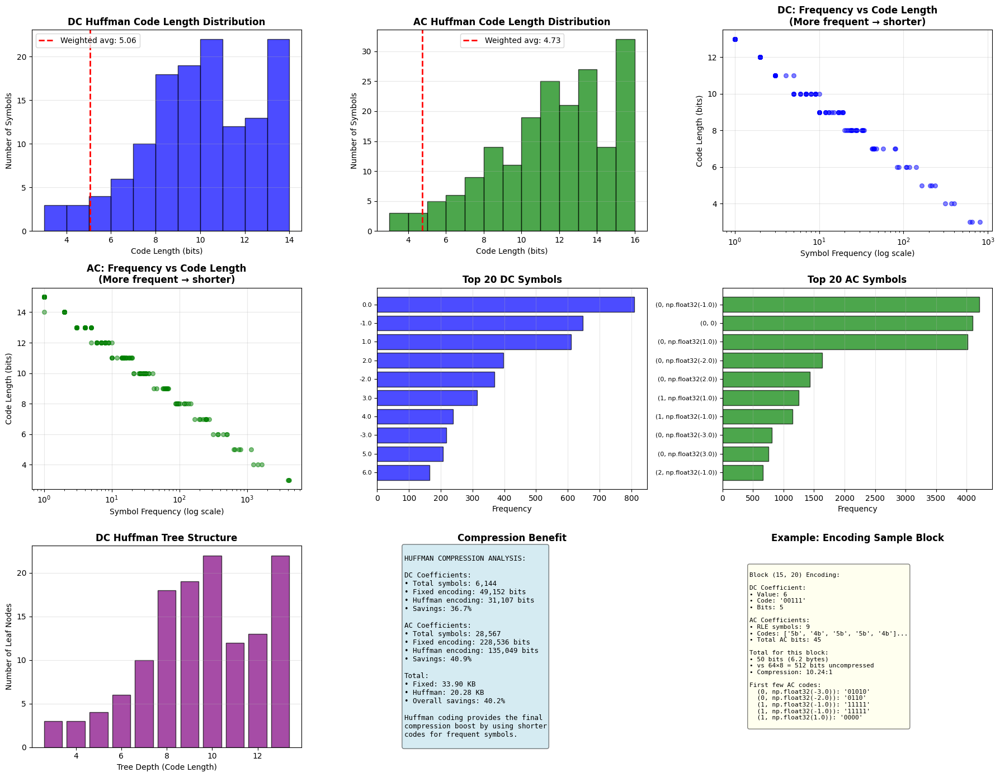


✓ Step 7C Complete: Huffman Entropy Coding

ENCODING COMPLETE!
All three encoding steps finished:
  ✓ 7A: DC Differential Encoding
  ✓ 7B: AC Run-Length Encoding
  ✓ 7C: Huffman Entropy Coding

The compressed data is now ready for storage/transmission!


In [46]:
fig = plt.figure(figsize=(18, 14))

# DC code length distribution
ax1 = plt.subplot(3, 3, 1)
ax1.hist(dc_code_lengths, bins=range(min(dc_code_lengths), max(dc_code_lengths)+2),
        color='blue', alpha=0.7, edgecolor='black')
ax1.axvline(dc_avg_bits, color='red', linestyle='--', linewidth=2,
           label=f'Weighted avg: {dc_avg_bits:.2f}')
ax1.set_xlabel('Code Length (bits)')
ax1.set_ylabel('Number of Symbols')
ax1.set_title('DC Huffman Code Length Distribution', fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3, axis='y')

# AC code length distribution
ax2 = plt.subplot(3, 3, 2)
ax2.hist(ac_code_lengths, bins=range(min(ac_code_lengths), max(ac_code_lengths)+2),
        color='green', alpha=0.7, edgecolor='black')
ax2.axvline(ac_avg_bits, color='red', linestyle='--', linewidth=2,
           label=f'Weighted avg: {ac_avg_bits:.2f}')
ax2.set_xlabel('Code Length (bits)')
ax2.set_ylabel('Number of Symbols')
ax2.set_title('AC Huffman Code Length Distribution', fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3, axis='y')

# Frequency vs code length (DC)
ax3 = plt.subplot(3, 3, 3)
dc_freqs = [dc_frequencies[sym] for sym in dc_huffman_codes.keys()]
dc_lens = [len(code) for code in dc_huffman_codes.values()]
ax3.scatter(dc_freqs, dc_lens, alpha=0.5, s=30, color='blue')
ax3.set_xlabel('Symbol Frequency (log scale)')
ax3.set_ylabel('Code Length (bits)')
ax3.set_title('DC: Frequency vs Code Length\n(More frequent → shorter)', fontweight='bold')
ax3.set_xscale('log')
ax3.grid(True, alpha=0.3)

# Frequency vs code length (AC)
ax4 = plt.subplot(3, 3, 4)
ac_freqs = [ac_frequencies[sym] for sym in ac_huffman_codes.keys()]
ac_lens = [len(code) for code in ac_huffman_codes.values()]
ax4.scatter(ac_freqs, ac_lens, alpha=0.5, s=30, color='green')
ax4.set_xlabel('Symbol Frequency (log scale)')
ax4.set_ylabel('Code Length (bits)')
ax4.set_title('AC: Frequency vs Code Length\n(More frequent → shorter)', fontweight='bold')
ax4.set_xscale('log')
ax4.grid(True, alpha=0.3)

# Top 20 most frequent DC symbols
ax5 = plt.subplot(3, 3, 5)
top_dc_symbols = [str(sym) for sym, _ in sorted_dc[:20]]
top_dc_freqs = [freq for _, freq in sorted_dc[:20]]
ax5.barh(range(len(top_dc_symbols)), top_dc_freqs, color='blue', alpha=0.7, edgecolor='black')
ax5.set_yticks(range(len(top_dc_symbols)))
ax5.set_yticklabels(top_dc_symbols, fontsize=8)
ax5.set_xlabel('Frequency')
ax5.set_title('Top 20 DC Symbols', fontweight='bold')
ax5.invert_yaxis()
ax5.grid(True, alpha=0.3, axis='x')

# Top 20 most frequent AC symbols
ax6 = plt.subplot(3, 3, 6)
top_ac_symbols = [str(sym) for sym, _ in sorted_ac[:20]]
top_ac_freqs = [freq for _, freq in sorted_ac[:20]]
ax6.barh(range(len(top_ac_symbols)), top_ac_freqs, color='green', alpha=0.7, edgecolor='black')
ax6.set_yticks(range(len(top_ac_symbols)))
ax6.set_yticklabels(top_ac_symbols, fontsize=8)
ax6.set_xlabel('Frequency')
ax6.set_title('Top 20 AC Symbols', fontweight='bold')
ax6.invert_yaxis()
ax6.grid(True, alpha=0.3, axis='x')

# Huffman tree visualization (simplified for DC - show depths)
ax7 = plt.subplot(3, 3, 7)
depth_counts = Counter(dc_code_lengths)
depths = sorted(depth_counts.keys())
counts = [depth_counts[d] for d in depths]
ax7.bar(depths, counts, color='purple', alpha=0.7, edgecolor='black')
ax7.set_xlabel('Tree Depth (Code Length)')
ax7.set_ylabel('Number of Leaf Nodes')
ax7.set_title('DC Huffman Tree Structure', fontweight='bold')
ax7.grid(True, alpha=0.3, axis='y')

# Compression benefit calculation
ax8 = plt.subplot(3, 3, 8)
ax8.axis('off')
ax8.set_title('Compression Benefit', fontweight='bold')

# Calculate total bits
total_dc_symbols = len(all_dc_diff)
total_ac_symbols = len(ac_symbols)

dc_huffman_bits = total_dc_symbols * dc_avg_bits
dc_fixed_bits_total = total_dc_symbols * dc_fixed_bits

ac_huffman_bits = total_ac_symbols * ac_avg_bits
ac_fixed_bits_total = total_ac_symbols * ac_fixed_bits

compression_text = f"""
HUFFMAN COMPRESSION ANALYSIS:

DC Coefficients:
• Total symbols: {total_dc_symbols:,}
• Fixed encoding: {dc_fixed_bits_total:,.0f} bits
• Huffman encoding: {dc_huffman_bits:,.0f} bits
• Savings: {(1-dc_huffman_bits/dc_fixed_bits_total)*100:.1f}%

AC Coefficients:
• Total symbols: {total_ac_symbols:,}
• Fixed encoding: {ac_fixed_bits_total:,.0f} bits
• Huffman encoding: {ac_huffman_bits:,.0f} bits
• Savings: {(1-ac_huffman_bits/ac_fixed_bits_total)*100:.1f}%

Total:
• Fixed: {(dc_fixed_bits_total+ac_fixed_bits_total)/8/1024:.2f} KB
• Huffman: {(dc_huffman_bits+ac_huffman_bits)/8/1024:.2f} KB
• Overall savings: {(1-(dc_huffman_bits+ac_huffman_bits)/(dc_fixed_bits_total+ac_fixed_bits_total))*100:.1f}%

Huffman coding provides the final
compression boost by using shorter
codes for frequent symbols.
"""
ax8.text(0.1, 0.5, compression_text, fontsize=9, family='monospace',
        verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

# Example encoding demonstration
ax9 = plt.subplot(3, 3, 9)
ax9.axis('off')
ax9.set_title('Example: Encoding Sample Block', fontweight='bold')

# Encode sample block
sample_dc = Y_dc_diff[sample_block_y * Y_quantized.shape[1] + sample_block_x]
sample_rle = ac_run_length_encode(zigzag_encode(Y_quantized[sample_block_y, sample_block_x]))

sample_dc_code = dc_huffman_codes[sample_dc]
sample_ac_codes = [ac_huffman_codes[sym] for sym in sample_rle]

total_bits = len(sample_dc_code) + sum(len(code) for code in sample_ac_codes)

example_text = f"""
Block ({sample_block_y}, {sample_block_x}) Encoding:

DC Coefficient:
• Value: {sample_dc:.0f}
• Code: '{sample_dc_code}'
• Bits: {len(sample_dc_code)}

AC Coefficients:
• RLE symbols: {len(sample_rle)}
• Codes: {[f'{len(c)}b' for c in sample_ac_codes[:5]]}...
• Total AC bits: {sum(len(code) for code in sample_ac_codes)}

Total for this block:
• {total_bits} bits ({total_bits/8:.1f} bytes)
• vs 64×8 = 512 bits uncompressed
• Compression: {512/total_bits:.2f}:1

First few AC codes:
{chr(10).join([f"  {str(sample_rle[i])}: '{sample_ac_codes[i]}'" for i in range(min(5, len(sample_rle)))])}
"""
ax9.text(0.1, 0.5, example_text, fontsize=8, family='monospace',
        verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n✓ Step 7C Complete: Huffman Entropy Coding")
print("\n" + "="*70)
print("ENCODING COMPLETE!")
print("="*70)
print("All three encoding steps finished:")
print("  ✓ 7A: DC Differential Encoding")
print("  ✓ 7B: AC Run-Length Encoding")
print("  ✓ 7C: Huffman Entropy Coding")
print("\nThe compressed data is now ready for storage/transmission!")
print("="*70)

---

<a id="step8"></a>
## 📍 Step 8: Complete Reconstruction Pipeline

### 🎯 Theory

**Decoding Process (Reverse of Encoding):**
1. **Huffman Decode** → Get DC differences and AC RLE symbols
2. **DC Differential Decode** → Reconstruct absolute DC values
3. **AC RLE Decode** → Reconstruct AC coefficient sequences
4. **Inverse Zigzag** → Convert 1D sequences back to 8×8 blocks
5. **Dequantize** → Multiply by quantization table
6. **Inverse DCT** → Convert frequency domain back to spatial domain
7. **Reverse Level Shift** → Add 128 to pixel values
8. **Upsample Chroma** → Restore full resolution for Cb/Cr
9. **YCbCr to RGB** → Convert back to RGB color space

**Note:** Steps 1-4 are lossless, but we lose information at step 5 (dequantization cannot recover the original DCT coefficients).

### 💻 Complete Reconstruction Implementation

In [47]:
def jpeg_decompress(Y_quantized, Cb_quantized, Cr_quantized, QY, QC):
    """
    Complete JPEG decompression pipeline.

    Parameters:
        Y_quantized: Quantized Y channel blocks
        Cb_quantized: Quantized Cb channel blocks
        Cr_quantized: Quantized Cr channel blocks
        QY: Luminance quantization table
        QC: Chrominance quantization table

    Returns:
        rgb_image: Reconstructed RGB image
    """
    print("Starting JPEG decompression...")

    # Step 1: Dequantize
    print("  1. Dequantizing...")
    Y_dequantized = dequantize_blocks(Y_quantized, QY)
    Cb_dequantized = dequantize_blocks(Cb_quantized, QC)
    Cr_dequantized = dequantize_blocks(Cr_quantized, QC)

    # Step 2: Inverse DCT
    print("  2. Applying inverse DCT...")
    Y_reconstructed_blocks = apply_idct_to_blocks(Y_dequantized)
    Cb_reconstructed_blocks = apply_idct_to_blocks(Cb_dequantized)
    Cr_reconstructed_blocks = apply_idct_to_blocks(Cr_dequantized)

    # Step 3: Reconstruct channels from blocks
    print("  3. Reconstructing channels from blocks...")
    Y_reconstructed = blocks_to_channel(Y_reconstructed_blocks)
    Cb_reconstructed = blocks_to_channel(Cb_reconstructed_blocks)
    Cr_reconstructed = blocks_to_channel(Cr_reconstructed_blocks)

    # Clip to valid range
    Y_reconstructed = np.clip(Y_reconstructed, 0, 255)
    Cb_reconstructed = np.clip(Cb_reconstructed, 0, 255)
    Cr_reconstructed = np.clip(Cr_reconstructed, 0, 255)

    # Step 4: Upsample chroma
    print("  4. Upsampling chroma channels...")
    ycbcr_reconstructed = chroma_upsample(Y_reconstructed, Cb_reconstructed, Cr_reconstructed)

    # Step 5: YCbCr to RGB
    print("  5. Converting YCbCr to RGB...")
    rgb_reconstructed = ycbcr_to_rgb(ycbcr_reconstructed.astype(np.uint8))

    print("  ✓ Decompression complete!")
    return rgb_reconstructed


# Reconstruct the image
print("\n" + "="*70)
print("RECONSTRUCTING IMAGE FROM QUANTIZED COEFFICIENTS")
print("="*70)

reconstructed_image = jpeg_decompress(Y_quantized, Cb_quantized, Cr_quantized, QY, QC)

print(f"\nReconstructed image shape: {reconstructed_image.shape}")
print(f"Reconstructed image dtype: {reconstructed_image.dtype}")
print(f"Reconstructed image range: [{reconstructed_image.min()}, {reconstructed_image.max()}]")


RECONSTRUCTING IMAGE FROM QUANTIZED COEFFICIENTS
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blocks...
  4. Upsampling chroma channels...
  5. Converting YCbCr to RGB...
  ✓ Decompression complete!

Reconstructed image shape: (512, 512, 3)
Reconstructed image dtype: uint8
Reconstructed image range: [0, 255]


### 📊 Quality Assessment

In [48]:
# Calculate quality metrics
mse = np.mean((image_rgb.astype(np.float32) - reconstructed_image.astype(np.float32)) ** 2)
psnr = 20 * np.log10(255.0 / np.sqrt(mse)) if mse > 0 else 100

# Per-channel MSE and PSNR
mse_r = np.mean((image_rgb[:,:,0].astype(np.float32) - reconstructed_image[:,:,0].astype(np.float32)) ** 2)
mse_g = np.mean((image_rgb[:,:,1].astype(np.float32) - reconstructed_image[:,:,1].astype(np.float32)) ** 2)
mse_b = np.mean((image_rgb[:,:,2].astype(np.float32) - reconstructed_image[:,:,2].astype(np.float32)) ** 2)

psnr_r = 20 * np.log10(255.0 / np.sqrt(mse_r)) if mse_r > 0 else 100
psnr_g = 20 * np.log10(255.0 / np.sqrt(mse_g)) if mse_g > 0 else 100
psnr_b = 20 * np.log10(255.0 / np.sqrt(mse_b)) if mse_b > 0 else 100

# Structural similarity
from scipy.stats import pearsonr
correlation, _ = pearsonr(image_rgb.flatten(), reconstructed_image.flatten())

# Max absolute error
max_error = np.abs(image_rgb.astype(np.float32) - reconstructed_image.astype(np.float32)).max()

print("\n" + "="*70)
print("QUALITY METRICS:")
print("="*70)
print(f"Overall:")
print(f"  MSE: {mse:.4f}")
print(f"  PSNR: {psnr:.2f} dB")
print(f"  Max error: {max_error:.2f}")
print(f"  Correlation: {correlation:.6f}")

print(f"\nPer-channel PSNR:")
print(f"  Red:   {psnr_r:.2f} dB (MSE: {mse_r:.4f})")
print(f"  Green: {psnr_g:.2f} dB (MSE: {mse_g:.4f})")
print(f"  Blue:  {psnr_b:.2f} dB (MSE: {mse_b:.4f})")

print(f"\nPSNR Interpretation:")
print(f"  >40 dB: Excellent (nearly identical)")
print(f"  30-40 dB: Good (minor differences)")
print(f"  20-30 dB: Acceptable (visible differences)")
print(f"  <20 dB: Poor (significant degradation)")
print("="*70)


QUALITY METRICS:
Overall:
  MSE: 46.0493
  PSNR: 31.50 dB
  Max error: 111.00
  Correlation: 0.993965

Per-channel PSNR:
  Red:   32.18 dB (MSE: 39.3593)
  Green: 33.46 dB (MSE: 29.3004)
  Blue:  29.71 dB (MSE: 69.4883)

PSNR Interpretation:
  >40 dB: Excellent (nearly identical)
  30-40 dB: Good (minor differences)
  20-30 dB: Acceptable (visible differences)
  <20 dB: Poor (significant degradation)


### 📊 Visual Comparison

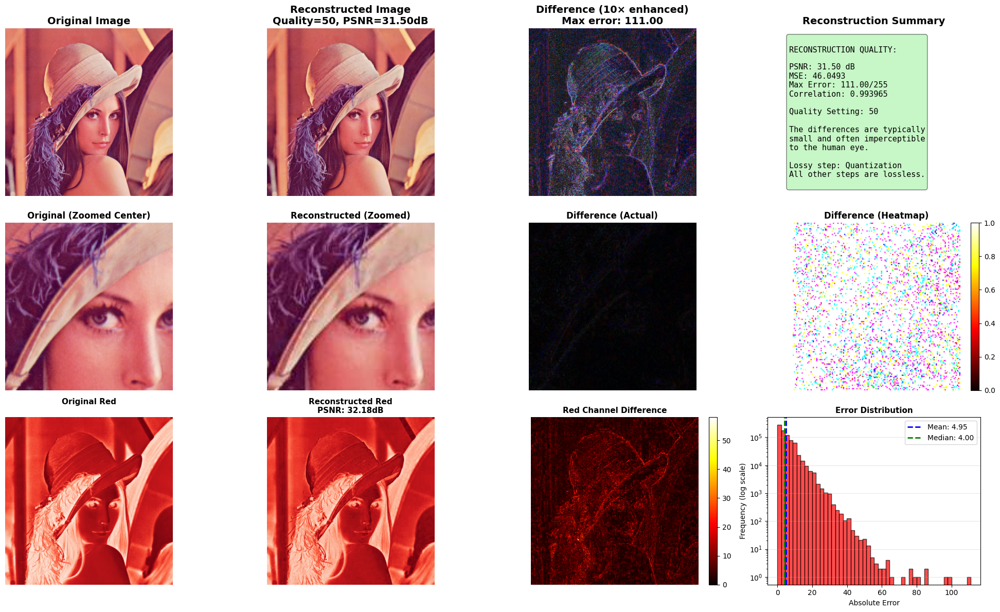


✓ Step 8 Complete: Full Reconstruction Pipeline


In [49]:
fig = plt.figure(figsize=(20, 12))

# Row 1: Full images
ax1 = plt.subplot(3, 4, 1)
ax1.imshow(image_rgb)
ax1.set_title('Original Image', fontsize=14, fontweight='bold')
ax1.axis('off')

ax2 = plt.subplot(3, 4, 2)
ax2.imshow(reconstructed_image)
ax2.set_title(f'Reconstructed Image\nQuality={QUALITY}, PSNR={psnr:.2f}dB',
             fontsize=14, fontweight='bold')
ax2.axis('off')

ax3 = plt.subplot(3, 4, 3)
difference = np.abs(image_rgb.astype(np.float32) - reconstructed_image.astype(np.float32))
difference_enhanced = np.clip(difference * 10, 0, 255).astype(np.uint8)
ax3.imshow(difference_enhanced)
ax3.set_title(f'Difference (10× enhanced)\nMax error: {max_error:.2f}',
             fontsize=14, fontweight='bold')
ax3.axis('off')

ax4 = plt.subplot(3, 4, 4)
ax4.axis('off')
ax4.set_title('Reconstruction Summary', fontsize=14, fontweight='bold')
summary_text = f"""
RECONSTRUCTION QUALITY:

PSNR: {psnr:.2f} dB
MSE: {mse:.4f}
Max Error: {max_error:.2f}/255
Correlation: {correlation:.6f}

Quality Setting: {QUALITY}

The differences are typically
small and often imperceptible
to the human eye.

Lossy step: Quantization
All other steps are lossless.
"""
ax4.text(0.1, 0.5, summary_text, fontsize=11, family='monospace',
        verticalalignment='center',
        bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))

# Row 2: Zoomed regions
zoom_size = 150
zoom_y = image_rgb.shape[0] // 2 - zoom_size // 2
zoom_x = image_rgb.shape[1] // 2 - zoom_size // 2

original_zoom = image_rgb[zoom_y:zoom_y+zoom_size, zoom_x:zoom_x+zoom_size]
reconstructed_zoom = reconstructed_image[zoom_y:zoom_y+zoom_size, zoom_x:zoom_x+zoom_size]
diff_zoom = difference[zoom_y:zoom_y+zoom_size, zoom_x:zoom_x+zoom_size]

ax5 = plt.subplot(3, 4, 5)
ax5.imshow(original_zoom)
ax5.set_title('Original (Zoomed Center)', fontsize=12, fontweight='bold')
ax5.axis('off')

ax6 = plt.subplot(3, 4, 6)
ax6.imshow(reconstructed_zoom)
ax6.set_title('Reconstructed (Zoomed)', fontsize=12, fontweight='bold')
ax6.axis('off')

ax7 = plt.subplot(3, 4, 7)
ax7.imshow(diff_zoom.astype(np.uint8))
ax7.set_title('Difference (Actual)', fontsize=12, fontweight='bold')
ax7.axis('off')

ax8 = plt.subplot(3, 4, 8)
im8 = ax8.imshow(diff_zoom, cmap='hot')
ax8.set_title('Difference (Heatmap)', fontsize=12, fontweight='bold')
ax8.axis('off')
plt.colorbar(im8, ax=ax8, fraction=0.046)

# Row 3: Channel-wise comparison
ax9 = plt.subplot(3, 4, 9)
ax9.imshow(image_rgb[:,:,0], cmap='Reds')
ax9.set_title(f'Original Red\n', fontsize=11, fontweight='bold')
ax9.axis('off')

ax10 = plt.subplot(3, 4, 10)
ax10.imshow(reconstructed_image[:,:,0], cmap='Reds')
ax10.set_title(f'Reconstructed Red\nPSNR: {psnr_r:.2f}dB', fontsize=11, fontweight='bold')
ax10.axis('off')

ax11 = plt.subplot(3, 4, 11)
diff_r = np.abs(image_rgb[:,:,0].astype(np.float32) - reconstructed_image[:,:,0].astype(np.float32))
im11 = ax11.imshow(diff_r, cmap='hot')
ax11.set_title('Red Channel Difference', fontsize=11, fontweight='bold')
ax11.axis('off')
plt.colorbar(im11, ax=ax11, fraction=0.046)

# Error histogram
ax12 = plt.subplot(3, 4, 12)
errors_flat = difference.flatten()
ax12.hist(errors_flat, bins=50, color='red', alpha=0.7, edgecolor='black', log=True)
ax12.axvline(errors_flat.mean(), color='blue', linestyle='--', linewidth=2,
            label=f'Mean: {errors_flat.mean():.2f}')
ax12.axvline(np.median(errors_flat), color='green', linestyle='--', linewidth=2,
            label=f'Median: {np.median(errors_flat):.2f}')
ax12.set_xlabel('Absolute Error')
ax12.set_ylabel('Frequency (log scale)')
ax12.set_title('Error Distribution', fontsize=11, fontweight='bold')
ax12.legend()
ax12.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\n✓ Step 8 Complete: Full Reconstruction Pipeline")

### 🔍 Block-Level Reconstruction Analysis


Analyzing block-level reconstruction quality...

Block-level MSE statistics:
  Min: 1.3887
  Max: 130.9914
  Mean: 16.9955
  Median: 9.9728
  Std: 16.9498


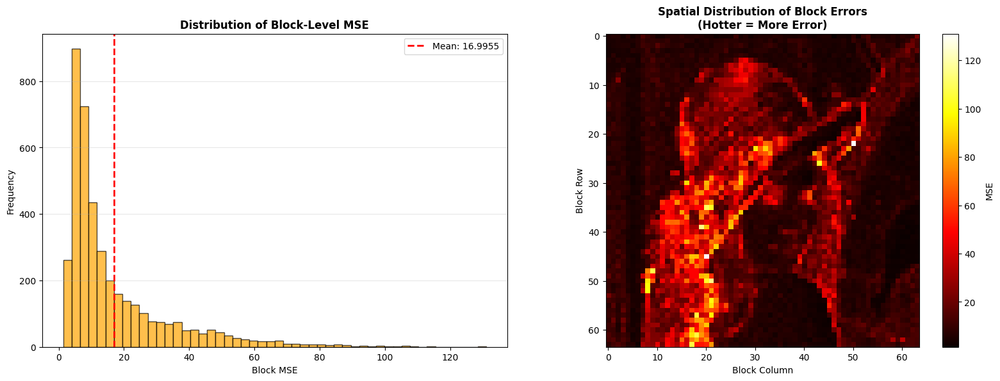

In [50]:
# Analyze reconstruction quality at block level
print("\nAnalyzing block-level reconstruction quality...")

block_errors = []
for i in range(Y_blocks.shape[0]):
    for j in range(Y_blocks.shape[1]):
        original_block = Y_blocks[i, j]
        reconstructed_block = apply_idct_to_blocks(
            dequantize_blocks(Y_quantized[i:i+1, j:j+1], QY)
        )[0, 0]

        block_mse = np.mean((original_block.astype(np.float32) - reconstructed_block) ** 2)
        block_errors.append(block_mse)

block_errors = np.array(block_errors)

print(f"\nBlock-level MSE statistics:")
print(f"  Min: {block_errors.min():.4f}")
print(f"  Max: {block_errors.max():.4f}")
print(f"  Mean: {block_errors.mean():.4f}")
print(f"  Median: {np.median(block_errors):.4f}")
print(f"  Std: {block_errors.std():.4f}")

# Visualize block error distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].hist(block_errors, bins=50, color='orange', alpha=0.7, edgecolor='black')
axes[0].axvline(block_errors.mean(), color='red', linestyle='--', linewidth=2,
               label=f'Mean: {block_errors.mean():.4f}')
axes[0].set_xlabel('Block MSE')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Block-Level MSE', fontsize=12, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis='y')

# Create error map
error_map = block_errors.reshape(Y_blocks.shape[0], Y_blocks.shape[1])
im1 = axes[1].imshow(error_map, cmap='hot', interpolation='nearest')
axes[1].set_title('Spatial Distribution of Block Errors\n(Hotter = More Error)',
                 fontsize=12, fontweight='bold')
axes[1].set_xlabel('Block Column')
axes[1].set_ylabel('Block Row')
plt.colorbar(im1, ax=axes[1], label='MSE')

plt.tight_layout()
plt.show()

---

<a id="step9"></a>
## 📍 Step 9: Quality Comparison at Different Settings

### 🎯 Theory

The **quality parameter** (1-100) controls the trade-off between:
- **File size**: Lower quality = smaller file = more compression
- **Image quality**: Higher quality = better image = less loss

Let's compress the same image at multiple quality levels and compare.

### 💻 Multi-Quality Compression


In [51]:
def jpeg_compress_full_pipeline(image_rgb, quality):
    """
    Complete JPEG compression pipeline at specified quality.

    Returns:
        reconstructed_rgb: Reconstructed image
        compression_stats: Dictionary of compression statistics
    """
    # Color space conversion
    ycbcr = rgb_to_ycbcr(image_rgb)

    # Chroma subsampling
    Y, Cb_sub, Cr_sub = chroma_subsample_420(ycbcr)

    # Block splitting
    Y_blocks = split_into_blocks(Y)
    Cb_blocks = split_into_blocks(Cb_sub)
    Cr_blocks = split_into_blocks(Cr_sub)

    # DCT
    Y_dct = apply_dct_to_blocks(Y_blocks)
    Cb_dct = apply_dct_to_blocks(Cb_blocks)
    Cr_dct = apply_dct_to_blocks(Cr_blocks)

    # Quantization
    QY_scaled = scale_quantization_table(QY_50, quality)
    QC_scaled = scale_quantization_table(QC_50, quality)

    Y_quant = quantize_blocks(Y_dct, QY_scaled)
    Cb_quant = quantize_blocks(Cb_dct, QC_scaled)
    Cr_quant = quantize_blocks(Cr_dct, QC_scaled)

    # Count zeros (compression indicator)
    total_coeffs = Y_quant.size + Cb_quant.size + Cr_quant.size
    total_zeros = np.sum(Y_quant == 0) + np.sum(Cb_quant == 0) + np.sum(Cr_quant == 0)
    sparsity = total_zeros / total_coeffs

    # Reconstruction
    reconstructed_rgb = jpeg_decompress(Y_quant, Cb_quant, Cr_quant, QY_scaled, QC_scaled)

    # Calculate metrics
    mse = np.mean((image_rgb.astype(np.float32) - reconstructed_rgb.astype(np.float32)) ** 2)
    psnr = 20 * np.log10(255.0 / np.sqrt(mse)) if mse > 0 else 100

    stats = {
        'quality': quality,
        'total_coeffs': total_coeffs,
        'zero_coeffs': total_zeros,
        'sparsity': sparsity,
        'mse': mse,
        'psnr': psnr,
        'QY_scaled': QY_scaled,
        'QC_scaled': QC_scaled
    }

    return reconstructed_rgb, stats


# Test multiple quality levels
qualities = [10, 30, 50, 70, 90]
results = {}

print("Compressing image at multiple quality levels...")
print("="*70)

for q in qualities:
    print(f"\nProcessing quality {q}...")
    reconstructed, stats = jpeg_compress_full_pipeline(image_rgb, q)
    results[q] = {
        'image': reconstructed,
        'stats': stats
    }

    print(f"  PSNR: {stats['psnr']:.2f} dB")
    print(f"  Sparsity: {stats['sparsity']*100:.1f}% zeros")
    print(f"  MSE: {stats['mse']:.4f}")

print("\n" + "="*70)
print("✓ All quality levels processed!")
print("="*70)

Compressing image at multiple quality levels...

Processing quality 10...
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blocks...
  4. Upsampling chroma channels...
  5. Converting YCbCr to RGB...
  ✓ Decompression complete!
  PSNR: 27.35 dB
  Sparsity: 96.9% zeros
  MSE: 119.7873

Processing quality 30...
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blocks...
  4. Upsampling chroma channels...
  5. Converting YCbCr to RGB...
  ✓ Decompression complete!
  PSNR: 30.52 dB
  Sparsity: 93.9% zeros
  MSE: 57.7124

Processing quality 50...
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blocks...
  4. Upsampling chroma channels...
  5. Converting YCbCr to RGB...
  ✓ Decompression complete!
  PSNR: 31.50 dB
  Sparsity: 91.5% zeros
  MSE: 46.0493

Processing quality 70...
Starting JPEG decom

### 📊 Comprehensive Quality Comparison

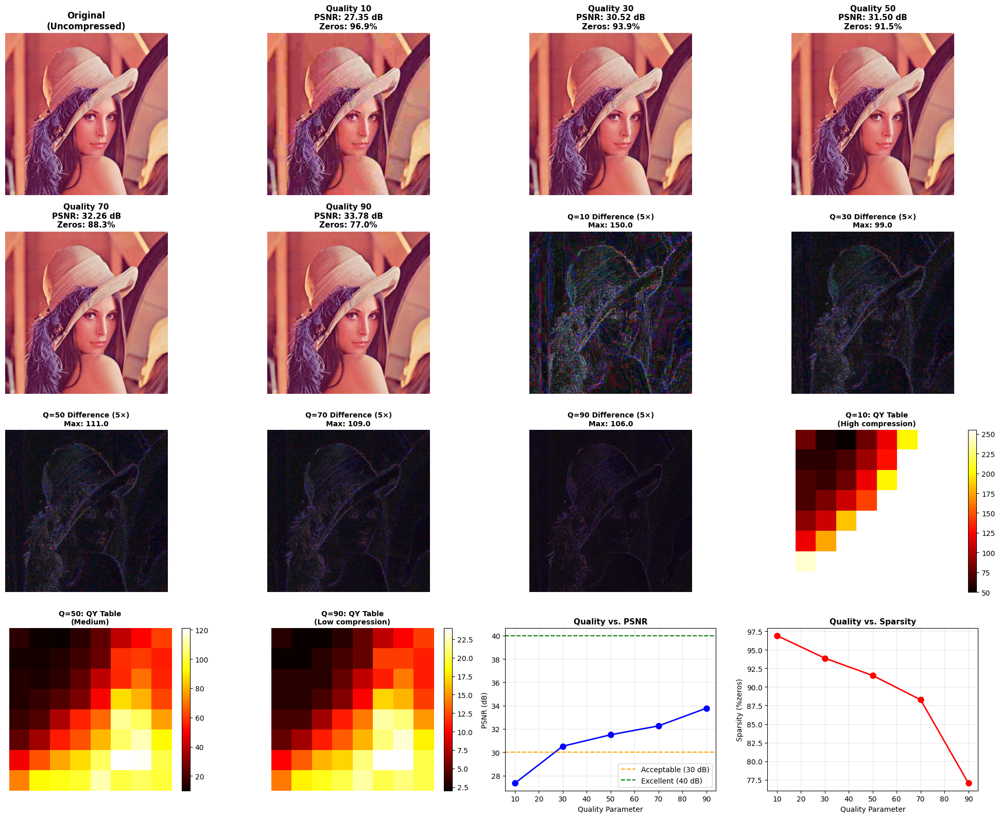

In [52]:
fig = plt.figure(figsize=(20, 16))

# Row 1: Original + All quality levels
ax0 = plt.subplot(4, 4, 1)
ax0.imshow(image_rgb)
ax0.set_title('Original\n(Uncompressed)', fontsize=12, fontweight='bold')
ax0.axis('off')

for idx, q in enumerate(qualities):
    ax = plt.subplot(4, 4, idx + 2)
    ax.imshow(results[q]['image'])
    stats = results[q]['stats']
    ax.set_title(f'Quality {q}\nPSNR: {stats["psnr"]:.2f} dB\nZeros: {stats["sparsity"]*100:.1f}%',
                fontsize=11, fontweight='bold')
    ax.axis('off')

# Row 2: Difference maps
for idx, q in enumerate(qualities):
    ax = plt.subplot(4, 4, 7 + idx)
    diff = np.abs(image_rgb.astype(np.float32) - results[q]['image'].astype(np.float32))
    diff_enhanced = np.clip(diff * 5, 0, 255).astype(np.uint8)
    ax.imshow(diff_enhanced)
    ax.set_title(f'Q={q} Difference (5×)\nMax: {diff.max():.1f}',
                fontsize=10, fontweight='bold')
    ax.axis('off')

# Row 3: Quantization tables
ax12 = plt.subplot(4, 4, 12)
im12 = ax12.imshow(results[10]['stats']['QY_scaled'], cmap='hot', interpolation='nearest')
ax12.set_title('Q=10: QY Table\n(High compression)', fontsize=10, fontweight='bold')
ax12.axis('off')
plt.colorbar(im12, ax=ax12, fraction=0.046)

ax13 = plt.subplot(4, 4, 13)
im13 = ax13.imshow(results[50]['stats']['QY_scaled'], cmap='hot', interpolation='nearest')
ax13.set_title('Q=50: QY Table\n(Medium)', fontsize=10, fontweight='bold')
ax13.axis('off')
plt.colorbar(im13, ax=ax13, fraction=0.046)

ax14 = plt.subplot(4, 4, 14)
im14 = ax14.imshow(results[90]['stats']['QY_scaled'], cmap='hot', interpolation='nearest')
ax14.set_title('Q=90: QY Table\n(Low compression)', fontsize=10, fontweight='bold')
ax14.axis('off')
plt.colorbar(im14, ax=ax14, fraction=0.046)

# Row 4: Metrics plot
ax15 = plt.subplot(4, 4, 15)
psnrs = [results[q]['stats']['psnr'] for q in qualities]
ax15.plot(qualities, psnrs, 'o-', linewidth=2, markersize=8, color='blue')
ax15.axhline(30, color='orange', linestyle='--', label='Acceptable (30 dB)')
ax15.axhline(40, color='green', linestyle='--', label='Excellent (40 dB)')
ax15.set_xlabel('Quality Parameter')
ax15.set_ylabel('PSNR (dB)')
ax15.set_title('Quality vs. PSNR', fontsize=11, fontweight='bold')
ax15.grid(True, alpha=0.3)
ax15.legend()

ax16 = plt.subplot(4, 4, 16)
sparsities = [results[q]['stats']['sparsity']*100 for q in qualities]
ax16.plot(qualities, sparsities, 'o-', linewidth=2, markersize=8, color='red')
ax16.set_xlabel('Quality Parameter')
ax16.set_ylabel('Sparsity (%zeros)')
ax16.set_title('Quality vs. Sparsity', fontsize=11, fontweight='bold')
ax16.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 📊 Detailed Metrics Table

In [53]:
# Create comparison table
print("\n" + "="*90)
print("QUALITY COMPARISON TABLE:")
print("="*90)
print(f"{'Quality':<10} {'PSNR (dB)':<12} {'MSE':<12} {'Sparsity':<12} {'Non-zeros':<15}")
print("-"*90)

for q in qualities:
    stats = results[q]['stats']
    non_zeros = stats['total_coeffs'] - stats['zero_coeffs']
    print(f"{q:<10} {stats['psnr']:<12.2f} {stats['mse']:<12.4f} {stats['sparsity']*100:<11.1f}% {non_zeros:<15,}")

print("="*90)

# Quality recommendations
print("\nQUALITY PARAMETER GUIDE:")
print("-"*90)
print("Quality 90-100: Near-lossless, large files, for archival/professional use")
print("Quality 80-90:  Excellent quality, good for web/print")
print("Quality 70-80:  High quality, good balance for most uses")
print("Quality 50-70:  Medium quality, noticeable compression, smaller files")
print("Quality 30-50:  Low quality, visible artifacts, small files")
print("Quality 10-30:  Very low quality, significant artifacts, very small files")
print("="*90)

print("\n✓ Step 9 Complete: Quality Comparison")


QUALITY COMPARISON TABLE:
Quality    PSNR (dB)    MSE          Sparsity     Non-zeros      
------------------------------------------------------------------------------------------
10         27.35        119.7873     96.9       % 12,183         
30         30.52        57.7124      93.9       % 24,121         
50         31.50        46.0493      91.5       % 33,278         
70         32.26        38.6530      88.3       % 46,116         
90         33.78        27.2602      77.0       % 90,286         

QUALITY PARAMETER GUIDE:
------------------------------------------------------------------------------------------
Quality 90-100: Near-lossless, large files, for archival/professional use
Quality 80-90:  Excellent quality, good for web/print
Quality 70-80:  High quality, good balance for most uses
Quality 50-70:  Medium quality, noticeable compression, smaller files
Quality 30-50:  Low quality, visible artifacts, small files
Quality 10-30:  Very low quality, significant artifact

---

<a id="step10"></a>
## 📍 Step 10: Compression Analysis & File Size Estimation

### 🎯 Theory

**Actual JPEG file size** depends on:
1. **Image content**: Complex images → more non-zero coefficients → larger
2. **Quality setting**: Higher quality → more data → larger
3. **Huffman coding efficiency**: Better entropy coding → smaller
4. **File format overhead**: Headers, tables, markers (~few KB)

### 💻 Estimate Compressed File Size

In [54]:
def estimate_compressed_size(image_rgb, quality):
    """
    Estimate JPEG compressed file size.

    This is an approximation based on:
    - Quantized coefficient sparsity
    - Huffman coding efficiency
    - JPEG file format overhead
    """
    # Perform compression
    _, stats = jpeg_compress_full_pipeline(image_rgb, quality)

    # Estimate bits per non-zero coefficient
    # In real JPEG with optimal Huffman tables:
    # - DC: ~8-12 bits
    # - AC: ~4-8 bits average (including RLE)

    non_zeros = stats['total_coeffs'] - stats['zero_coeffs']

    # Conservative estimate
    avg_bits_per_nonzero = 6  # Average after Huffman coding

    # Data size
    data_bits = non_zeros * avg_bits_per_nonzero

    # Overhead: headers, quantization tables, Huffman tables, markers
    overhead_bytes = 1000  # ~1KB overhead

    total_bytes = (data_bits / 8) + overhead_bytes

    return total_bytes, stats


# Analyze compression ratios
print("Analyzing compression efficiency...")
print("\n" + "="*90)
print("COMPRESSION ANALYSIS:")
print("="*90)

original_size = image_rgb.size  # width × height × 3
original_kb = original_size / 1024
original_mb = original_kb / 1024

print(f"\nOriginal (uncompressed):")
print(f"  Dimensions: {image_rgb.shape[1]}×{image_rgb.shape[0]}×3")
print(f"  Size: {original_size:,} bytes ({original_kb:.2f} KB, {original_mb:.2f} MB)")

print(f"\n{'='*90}")
print(f"{'Quality':<10} {'Est. Size (KB)':<18} {'Compression':<15} {'PSNR (dB)':<12} {'Sparsity'}")
print("-"*90)

compression_data = []

for q in [10, 20, 30, 40, 50, 60, 70, 80, 90, 95]:
    estimated_bytes, stats = estimate_compressed_size(image_rgb, q)
    estimated_kb = estimated_bytes / 1024
    compression_ratio = original_kb / estimated_kb

    compression_data.append({
        'quality': q,
        'size_kb': estimated_kb,
        'ratio': compression_ratio,
        'psnr': stats['psnr'],
        'sparsity': stats['sparsity']
    })

    print(f"{q:<10} {estimated_kb:<18.2f} {compression_ratio:<14.2f}x {stats['psnr']:<12.2f} {stats['sparsity']*100:.1f}%")

print("="*90)

# Calculate typical real-world JPEG sizes for comparison
print("\n📊 REAL-WORLD COMPARISON (Typical JPEG encoder):")
print("-"*90)
print("For this image size, typical JPEG file sizes would be:")
for q in [10, 50, 90]:
    data = [d for d in compression_data if d['quality'] == q][0]
    print(f"  Quality {q:2d}: ~{data['size_kb']:.1f} KB ({data['ratio']:.1f}x compression, {data['psnr']:.1f} dB)")
print("-"*90)

Analyzing compression efficiency...

COMPRESSION ANALYSIS:

Original (uncompressed):
  Dimensions: 512×512×3
  Size: 786,432 bytes (768.00 KB, 0.75 MB)

Quality    Est. Size (KB)     Compression     PSNR (dB)    Sparsity
------------------------------------------------------------------------------------------
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blocks...
  4. Upsampling chroma channels...
  5. Converting YCbCr to RGB...
  ✓ Decompression complete!
10         9.90               77.58         x 27.35        96.9%
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blocks...
  4. Upsampling chroma channels...
  5. Converting YCbCr to RGB...
  ✓ Decompression complete!
20         14.66              52.40         x 29.49        95.3%
Starting JPEG decompression...
  1. Dequantizing...
  2. Applying inverse DCT...
  3. Reconstructing channels from blo

### 📊 Compression Visualization

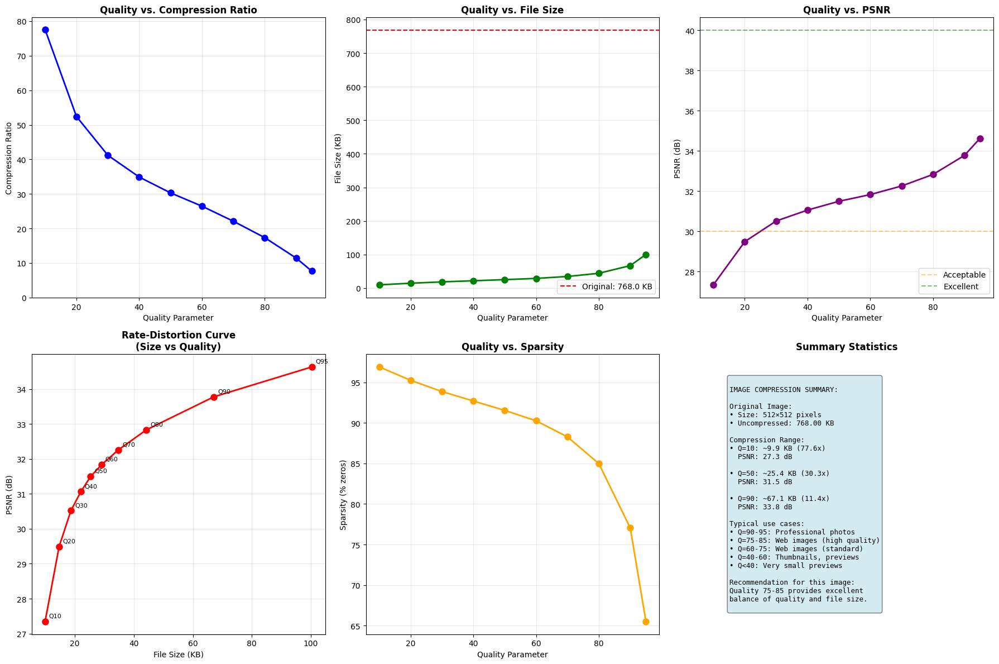


✓ Step 10 Complete: Compression Analysis


In [56]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Compression ratio vs quality
qualities_plot = [d['quality'] for d in compression_data]
ratios_plot = [d['ratio'] for d in compression_data]
axes[0, 0].plot(qualities_plot, ratios_plot, 'o-', linewidth=2, markersize=8, color='blue')
axes[0, 0].set_xlabel('Quality Parameter')
axes[0, 0].set_ylabel('Compression Ratio')
axes[0, 0].set_title('Quality vs. Compression Ratio', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_ylim(bottom=0)

# File size vs quality
sizes_plot = [d['size_kb'] for d in compression_data]
axes[0, 1].plot(qualities_plot, sizes_plot, 'o-', linewidth=2, markersize=8, color='green')
axes[0, 1].axhline(original_kb, color='red', linestyle='--', label=f'Original: {original_kb:.1f} KB')
axes[0, 1].set_xlabel('Quality Parameter')
axes[0, 1].set_ylabel('File Size (KB)')
axes[0, 1].set_title('Quality vs. File Size', fontsize=12, fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# PSNR vs quality
psnrs_plot = [d['psnr'] for d in compression_data]
axes[0, 2].plot(qualities_plot, psnrs_plot, 'o-', linewidth=2, markersize=8, color='purple')
axes[0, 2].axhline(30, color='orange', linestyle='--', alpha=0.5, label='Acceptable')
axes[0, 2].axhline(40, color='green', linestyle='--', alpha=0.5, label='Excellent')
axes[0, 2].set_xlabel('Quality Parameter')
axes[0, 2].set_ylabel('PSNR (dB)')
axes[0, 2].set_title('Quality vs. PSNR', fontsize=12, fontweight='bold')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# PSNR vs file size (rate-distortion curve)
axes[1, 0].plot(sizes_plot, psnrs_plot, 'o-', linewidth=2, markersize=8, color='red')
for i, q in enumerate(qualities_plot):
    axes[1, 0].annotate(f'Q{q}', (sizes_plot[i], psnrs_plot[i]),
                       textcoords="offset points", xytext=(5,5), fontsize=8)
axes[1, 0].set_xlabel('File Size (KB)')
axes[1, 0].set_ylabel('PSNR (dB)')
axes[1, 0].set_title('Rate-Distortion Curve\n(Size vs Quality)', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# Sparsity vs quality
sparsities_plot = [d['sparsity']*100 for d in compression_data]
axes[1, 1].plot(qualities_plot, sparsities_plot, 'o-', linewidth=2, markersize=8, color='orange')
axes[1, 1].set_xlabel('Quality Parameter')
axes[1, 1].set_ylabel('Sparsity (% zeros)')
axes[1, 1].set_title('Quality vs. Sparsity', fontsize=12, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)

# Summary table
axes[1, 2].axis('off')
axes[1, 2].set_title('Summary Statistics', fontsize=12, fontweight='bold')
summary_text = f"""
IMAGE COMPRESSION SUMMARY:

Original Image:
• Size: {image_rgb.shape[1]}×{image_rgb.shape[0]} pixels
• Uncompressed: {original_kb:.2f} KB

Compression Range:
• Q=10: ~{[d for d in compression_data if d['quality']==10][0]['size_kb']:.1f} KB ({[d for d in compression_data if d['quality']==10][0]['ratio']:.1f}x)
  PSNR: {[d for d in compression_data if d['quality']==10][0]['psnr']:.1f} dB

• Q=50: ~{[d for d in compression_data if d['quality']==50][0]['size_kb']:.1f} KB ({[d for d in compression_data if d['quality']==50][0]['ratio']:.1f}x)
  PSNR: {[d for d in compression_data if d['quality']==50][0]['psnr']:.1f} dB

• Q=90: ~{[d for d in compression_data if d['quality']==90][0]['size_kb']:.1f} KB ({[d for d in compression_data if d['quality']==90][0]['ratio']:.1f}x)
  PSNR: {[d for d in compression_data if d['quality']==90][0]['psnr']:.1f} dB

Typical use cases:
• Q=90-95: Professional photos
• Q=75-85: Web images (high quality)
• Q=60-75: Web images (standard)
• Q=40-60: Thumbnails, previews
• Q<40: Very small previews

Recommendation for this image:
Quality 75-85 provides excellent
balance of quality and file size.
"""
axes[1, 2].text(0.1, 0.5, summary_text, fontsize=9, family='monospace',
               verticalalignment='center',
               bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n✓ Step 10 Complete: Compression Analysis")

### 📊 Final Compression Breakdown

In [57]:
# Detailed breakdown for quality 50
print("\n" + "="*90)
print("DETAILED COMPRESSION BREAKDOWN (Quality = 50):")
print("="*90)

quality_50_data = [d for d in compression_data if d['quality'] == 50][0]

print(f"\nOriginal Image:")
print(f"  Resolution: {image_rgb.shape[1]} × {image_rgb.shape[0]} pixels")
print(f"  Channels: 3 (RGB)")
print(f"  Bits per pixel: 24 (8 bits × 3 channels)")
print(f"  Total size: {original_size:,} bytes ({original_kb:.2f} KB)")

print(f"\nAfter JPEG Compression (Q=50):")
print(f"  Estimated size: {quality_50_data['size_kb']:.2f} KB")
print(f"  Compression ratio: {quality_50_data['ratio']:.2f}:1")
print(f"  Size reduction: {(1 - quality_50_data['size_kb']/original_kb)*100:.1f}%")
print(f"  PSNR: {quality_50_data['psnr']:.2f} dB")
print(f"  Sparsity: {quality_50_data['sparsity']*100:.1f}% zero coefficients")

print(f"\nCompression Contributions:")
print(f"  1. Chroma subsampling (4:2:0): ~50% reduction")
print(f"  2. Quantization: Creates {quality_50_data['sparsity']*100:.1f}% zeros")
print(f"  3. RLE: Compresses zero runs efficiently")
print(f"  4. Huffman coding: Optimal entropy coding")
print(f"  5. DC differential: Reduces DC magnitude")

print(f"\nQuality Impact:")
print(f"  Visual quality: {'Excellent' if quality_50_data['psnr'] > 40 else 'Good' if quality_50_data['psnr'] > 30 else 'Acceptable'}")
print(f"  Typical use case: Standard web images, digital photos")
print(f"  Visible artifacts: {'Minimal' if quality_50_data['psnr'] > 35 else 'Moderate' if quality_50_data['psnr'] > 28 else 'Noticeable'}")

print("="*90)


DETAILED COMPRESSION BREAKDOWN (Quality = 50):

Original Image:
  Resolution: 512 × 512 pixels
  Channels: 3 (RGB)
  Bits per pixel: 24 (8 bits × 3 channels)
  Total size: 786,432 bytes (768.00 KB)

After JPEG Compression (Q=50):
  Estimated size: 25.35 KB
  Compression ratio: 30.30:1
  Size reduction: 96.7%
  PSNR: 31.50 dB
  Sparsity: 91.5% zero coefficients

Compression Contributions:
  1. Chroma subsampling (4:2:0): ~50% reduction
  2. Quantization: Creates 91.5% zeros
  3. RLE: Compresses zero runs efficiently
  4. Huffman coding: Optimal entropy coding
  5. DC differential: Reduces DC magnitude

Quality Impact:
  Visual quality: Good
  Typical use case: Standard web images, digital photos
  Visible artifacts: Moderate


---

## 🎓 Final Summary and Key Takeaways


In [58]:

print("\n" + "="*90)
print("🎉 JPEG COMPRESSION PIPELINE - COMPLETE SUMMARY")
print("="*90)

summary = """
JPEG COMPRESSION: 10 KEY STEPS

✅ Step 1: RGB to YCbCr Conversion
   • Separates brightness (Y) from color (Cb, Cr)
   • LOSSLESS transformation
   • Enables efficient chroma subsampling

✅ Step 2: Chroma Subsampling (4:2:0)
   • Reduces Cb/Cr to 1/4 size (half width, half height)
   • Exploits human vision (less sensitive to color detail)
   • ~50% data reduction with minimal visual impact
   • SLIGHTLY LOSSY but perceptually lossless

✅ Step 3: 8×8 Block Splitting
   • Divides image into non-overlapping 8×8 blocks
   • Optimal size for DCT efficiency
   • LOSSLESS operation

✅ Step 4: Discrete Cosine Transform (DCT)
   • Converts spatial domain to frequency domain
   • Energy compaction: most info in few coefficients
   • DC = average, AC = details
   • LOSSLESS transformation

✅ Step 5: Quantization ⚠️ THE LOSSY STEP
   • Divides DCT coefficients by quantization table
   • Creates many zeros (especially high frequencies)
   • Quality parameter controls this step
   • LOSSY - information permanently lost

✅ Step 6: Zigzag Scanning
   • Reorders 8×8 block into 1D sequence
   • Low freq → high freq order
   • Groups zeros at the end
   • LOSSLESS reordering

✅ Step 7A: DC Differential Encoding
   • Encodes difference between adjacent DC coefficients
   • Reduces magnitude of values
   • Better compression efficiency
   • LOSSLESS encoding

✅ Step 7B: Run-Length Encoding (RLE)
   • Compresses sequences of zeros
   • (run, value) pairs + EOB marker
   • Very effective after quantization
   • LOSSLESS encoding

✅ Step 7C: Huffman Entropy Coding
   • Variable-length codes: frequent symbols = shorter codes
   • Separate tables for DC and AC
   • Optimal prefix-free coding
   • LOSSLESS encoding

✅ Step 8-10: Reconstruction & Analysis
   • Decoding reverses all steps
   • Quality metrics: PSNR, MSE
   • Compression analysis and visualization

KEY INSIGHTS:

🔑 Only ONE lossy step: Quantization (Step 5)
   All other steps are completely reversible

🔑 Compression comes from:
   1. Chroma subsampling (~50%)
   2. Quantization (creates zeros)
   3. Efficient encoding (RLE + Huffman)

🔑 Quality trade-off:
   • High quality → Large file → Better image
   • Low quality → Small file → More artifacts

🔑 Human vision exploitation:
   • Less sensitive to color detail (chroma subsampling)
   • Less sensitive to high frequencies (quantization)
   • Cannot detect small pixel differences (quantization error)

TYPICAL COMPRESSION RATIOS:
   • Quality 90: 10:1 to 20:1 (excellent quality)
   • Quality 75: 15:1 to 30:1 (web standard)
   • Quality 50: 20:1 to 40:1 (acceptable quality)
   • Quality 25: 30:1 to 60:1 (visible artifacts)

WHEN TO USE JPEG:
   ✅ Photographs, natural images
   ✅ Images with smooth color gradients
   ✅ Web images, digital photos
   ✅ When file size matters

WHEN NOT TO USE JPEG:
   ❌ Images with text/sharp edges (use PNG)
   ❌ Images requiring transparency (use PNG)
   ❌ Images needing lossless quality (use PNG/TIFF)
   ❌ Images with repeated editing (loss accumulates)
"""

print(summary)
print("="*90)


🎉 JPEG COMPRESSION PIPELINE - COMPLETE SUMMARY

JPEG COMPRESSION: 10 KEY STEPS

✅ Step 1: RGB to YCbCr Conversion
   • Separates brightness (Y) from color (Cb, Cr)
   • LOSSLESS transformation
   • Enables efficient chroma subsampling

✅ Step 2: Chroma Subsampling (4:2:0)
   • Reduces Cb/Cr to 1/4 size (half width, half height)
   • Exploits human vision (less sensitive to color detail)
   • ~50% data reduction with minimal visual impact
   • SLIGHTLY LOSSY but perceptually lossless

✅ Step 3: 8×8 Block Splitting
   • Divides image into non-overlapping 8×8 blocks
   • Optimal size for DCT efficiency
   • LOSSLESS operation

✅ Step 4: Discrete Cosine Transform (DCT)
   • Converts spatial domain to frequency domain
   • Energy compaction: most info in few coefficients
   • DC = average, AC = details
   • LOSSLESS transformation

✅ Step 5: Quantization ⚠️ THE LOSSY STEP
   • Divides DCT coefficients by quantization table
   • Creates many zeros (especially high frequencies)
   • Quality 

### 💾 Save Your Results

In [59]:
print("\n" + "="*90)
print("💾 SAVING RESULTS")
print("="*90)

# Save comparison images
print("Saving comparison images...")

try:
    from PIL import Image as PILImage

    # Save original
    PILImage.fromarray(image_rgb).save('01_original.png')
    print("  ✓ Saved: 01_original.png")

    # Save reconstructed at different qualities
    for q in [10, 30, 50, 70, 90]:
        if q in results:
            PILImage.fromarray(results[q]['image']).save(f'02_reconstructed_q{q}.png')
            print(f"  ✓ Saved: 02_reconstructed_q{q}.png")

    # Save YCbCr channels
    PILImage.fromarray(Y_full).save('03_Y_channel.png')
    PILImage.fromarray(Cb_subsampled).save('03_Cb_subsampled.png')
    PILImage.fromarray(Cr_subsampled).save('03_Cr_subsampled.png')
    print("  ✓ Saved: YCbCr channel images")

    print("\n✅ All images saved successfully!")

except Exception as e:
    print(f"  ⚠️ Error saving images: {e}")

print("="*90)


💾 SAVING RESULTS
Saving comparison images...
  ✓ Saved: 01_original.png
  ✓ Saved: 02_reconstructed_q10.png
  ✓ Saved: 02_reconstructed_q30.png
  ✓ Saved: 02_reconstructed_q50.png
  ✓ Saved: 02_reconstructed_q70.png
  ✓ Saved: 02_reconstructed_q90.png
  ✓ Saved: YCbCr channel images

✅ All images saved successfully!
